## 命名规则
rmse:
feature_method+model

pic:
feature_method+model

In [249]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import datetime
# from pylab import *
#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats
import pandas_datareader.data as web

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
# Model
from sklearn.linear_model import Ridge, Lasso,LinearRegression
from sklearn.linear_model import LogisticRegression,SGDRegressor,TheilSenRegressor
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline

import copy

In [250]:
PRSA = pd.read_csv("./dataset/PRSA.csv",parse_dates = {"date":['year']+['month']+['day']},index_col='date')

In [251]:
PRSA = PRSA.iloc[:,2:-1]

In [252]:
PRSA.sort_index(ascending=True,inplace=True)

In [253]:
PRSA.resample('D').sum()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
date,,,,,,,,,,,
2013-03-01,171.0,258.0,281.0,542.0,10300.0,1533.0,33.4,24645.0,-449.9,0.0,78.1
2013-03-02,738.0,1010.0,879.0,1600.0,19798.0,714.0,14.8,24644.4,-382.5,0.0,35.5
2013-03-03,1846.0,2893.0,1471.0,1944.0,38895.0,459.0,133.6,24350.6,-295.6,0.0,39.8
2013-03-04,545.0,1070.0,526.0,1080.0,14200.0,1290.0,239.1,24423.6,-280.4,0.0,57.7
2013-03-05,3573.0,4411.0,2253.0,3188.0,56591.0,1643.0,151.0,24261.6,-180.6,0.0,27.1
...,...,...,...,...,...,...,...,...,...,...,...
2017-02-24,517.0,783.0,398.0,1413.0,13800.0,1219.0,124.0,24504.3,-267.4,0.0,38.3
2017-02-25,269.0,473.0,162.0,1041.0,10100.0,1581.0,173.9,24451.5,-258.1,0.0,43.8
2017-02-26,675.0,977.0,242.0,1569.0,17300.0,1167.0,173.0,24488.1,-198.2,0.0,37.6


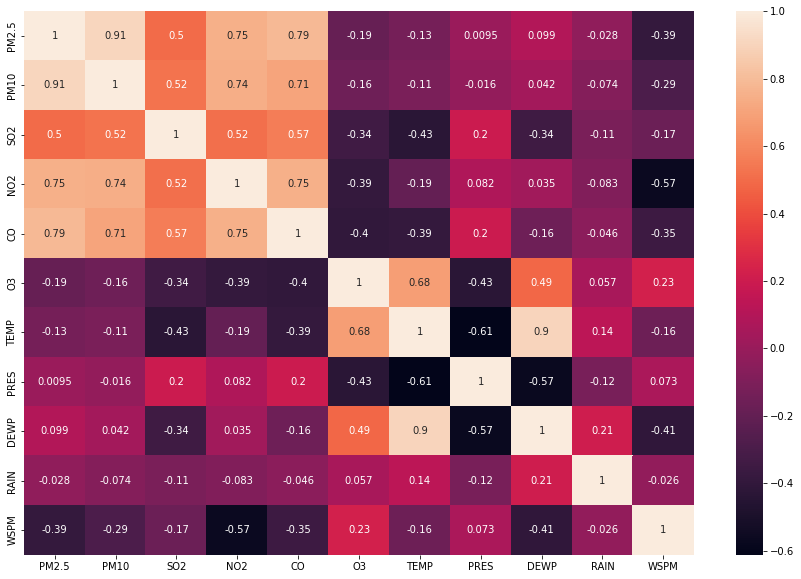

In [61]:
plt.figure(figsize=(15,10))
sns.heatmap(PRSA.resample('D').sum().corr(), annot=True)
plt.savefig('./pic/Correlation Pic/PRSA/Corr_Map.png')

In [254]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [255]:
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df

def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [256]:
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

### Lag the feature based on the order of feature in data.columns
def lag_feature_df(max_lag,data,target):
    # Store each feature's dataframe:
    X = pd.DataFrame()
    X_col = list(data.columns)
    X_col.remove(target)
    feature_range = range(len(X_col))
    for idx,col in enumerate(X_col):
        for j in range(max_lag):
            X[col+'_lag_'+str(j+1)] = data[col].shift(j)
    X[target] = data[target].copy()
    X.dropna(inplace=True)
    return X

In [257]:
df = PRSA.resample('D').sum().copy()

df['PM2.5_1'] = df['PM2.5'].shift(-1)
df.dropna(inplace=True)


df_lag = lag_feature_df(30,df,'PM2.5_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)
## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'PM2.5_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'PM2.5_1')
X_test_lag,Y_test_lag = segment(test_lag,'PM2.5_1')

train_no,valid_no,test_no = Train_Valid_Test(df.loc[df_lag.index],0.7,0.1,0.2)

## No lagging
X_train_no,Y_train_no = segment(train_no,'PM2.5_1')
X_valid_no,Y_valid_no = segment(test_no,'PM2.5_1')
X_test_no,Y_test_no = segment(test_no,'PM2.5_1')

In [258]:
X_arr = X_train_lag.values

In [259]:
X_train_lag

,PM2.5_lag_1,PM2.5_lag_2,PM2.5_lag_3,PM2.5_lag_4,PM2.5_lag_5,PM2.5_lag_6,PM2.5_lag_7,PM2.5_lag_8,PM2.5_lag_9,PM2.5_lag_10,...,WSPM_lag_21,WSPM_lag_22,WSPM_lag_23,WSPM_lag_24,WSPM_lag_25,WSPM_lag_26,WSPM_lag_27,WSPM_lag_28,WSPM_lag_29,WSPM_lag_30
date,,,,,,,,,,,,,,,,,,,,,
2013-03-30,1909.0,2109.0,680.0,2199.0,4499.0,2454.0,445.0,1266.0,2170.0,3575.0,...,58.6,81.4,39.3,37.4,35.6,27.1,57.7,39.8,35.5,78.1
2013-03-31,4182.0,1909.0,2109.0,680.0,2199.0,4499.0,2454.0,445.0,1266.0,2170.0,...,37.6,58.6,81.4,39.3,37.4,35.6,27.1,57.7,39.8,35.5
2013-04-01,2278.0,4182.0,1909.0,2109.0,680.0,2199.0,4499.0,2454.0,445.0,1266.0,...,26.0,37.6,58.6,81.4,39.3,37.4,35.6,27.1,57.7,39.8
2013-04-02,2390.0,2278.0,4182.0,1909.0,2109.0,680.0,2199.0,4499.0,2454.0,445.0,...,55.9,26.0,37.6,58.6,81.4,39.3,37.4,35.6,27.1,57.7
2013-04-03,2980.0,2390.0,2278.0,4182.0,1909.0,2109.0,680.0,2199.0,4499.0,2454.0,...,46.9,55.9,26.0,37.6,58.6,81.4,39.3,37.4,35.6,27.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-21,5894.0,4724.0,3378.0,1713.0,1010.0,156.0,144.0,3387.0,3949.0,2498.0,...,28.6,26.6,25.4,29.9,32.5,73.7,75.6,38.1,44.9,34.1
2015-12-22,7741.0,5894.0,4724.0,3378.0,1713.0,1010.0,156.0,144.0,3387.0,3949.0,...,122.3,28.6,26.6,25.4,29.9,32.5,73.7,75.6,38.1,44.9
2015-12-23,5514.0,7741.0,5894.0,4724.0,3378.0,1713.0,1010.0,156.0,144.0,3387.0,...,141.0,122.3,28.6,26.6,25.4,29.9,32.5,73.7,75.6,38.1


In [260]:
X_train_no

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
date,,,,,,,,,,,
2013-03-30,1909.0,2668.0,1490.0,1637.0,39995.0,808.0000,154.8,24403.7,-60.7,0.0,41.7
2013-03-31,4182.0,4656.0,351.0,1744.0,31992.0,72.0000,133.7,24314.8,59.4,0.0,35.9
2013-04-01,2278.0,2702.0,411.0,938.0,28996.0,1225.0000,251.0,24280.9,-112.5,0.0,73.7
2013-04-02,2390.0,3373.0,960.0,1655.0,29497.0,1280.0626,240.9,24273.8,-35.9,0.0,46.0
2013-04-03,2980.0,4910.0,1218.0,2105.0,34897.0,1104.0000,286.0,24162.1,0.7,0.0,43.9
...,...,...,...,...,...,...,...,...,...,...,...
2015-12-21,5894.0,5979.0,700.0,2962.0,131100.0,283.0000,-39.3,24553.0,-113.2,0.0,20.7
2015-12-22,7741.0,7908.0,1020.0,2977.0,135700.0,262.0000,-60.0,24572.7,-89.3,0.0,27.5
2015-12-23,5514.0,5822.0,620.0,2621.0,132000.0,416.0000,-8.8,24537.4,-109.8,0.0,25.4


## Prediction Models

In [261]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [262]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [263]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [264]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [265]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [266]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [267]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

In [268]:
mi_xy = mutual_info_regression(X_train_lag,Y_train_lag)
mi_xx = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])

for i in range(mi_xx.shape[1]):
    for j in range(mi_xx.shape[1]):
        mi_xx[i][j] = mutual_info_regression(X_arr[:,i].reshape(-1,1),X_arr[:,j])
    print(i+1,'/',mi_xx.shape[1],end='\r',flush=True)

In [269]:
def mRMR(selected,idx,metric_xy,metric_xx):
    
    mrmr = 0.0
    
    if len(selected) == 0:
        mrmr = metric_xy[idx]
        
    else:
        relevance_score = 0
        redundency_score = 0
        relevance_score = metric_xy[idx] 
        X_s = selected+[idx]
        col_len = len(selected)
        
        for i in selected:
            redundency_score+=metric_xx[idx][i]
        redundency_score/=(col_len)
        
#         for i in X_s:
#             relevance_score+=metric_xy[i]
#         relevance_score/=(col_len)
        

#         for i in range(col_len - 1):
#             for j in range(i+1,col_len):
#                 redundency_score+=metric_xx[X_s[i]][X_s[j]]
#         redundency_score/=(col_len)
        
        mrmr = (relevance_score - redundency_score)

    return mrmr

def incremental_selection(x,metric):
    X = np.array(x)
    selected = [] # indices of selected fetures
    rest = list(range(X.shape[1]))
    scores = []
    metric_xy = []
    metric_xx = []
    # stop = False
    if metric == 'MI-MI':
        metric_xy = mi_xy
        metric_xx = mi_xx
    elif metric == 'MI-MI-Norm':
        metric_xy = mi_xy_norm 
        metric_xx = mi_norm
    elif metric == 'MI-MIC':
        metric_xy = mi_xy_norm
        metric_xx = mic_norm
    elif metric == 'MIC-MI':
        metric_xy = mic_xy_norm
        metric_xx = mi_norm
    elif metric =='MI-CCF':
        metric_xy = mi_xy
        metric_xx = ccf_xx
    elif metric=='MI-CCF-Norm':
        metric_xy = mi_xy_norm
        metric_xx = ccf_norm
    elif metric == 'MI-Pearson':
        metric_xy = mi_xy_norm
        metric_xx = pearson_norm   
    print(metric)
    while len(rest)>0 :
        id_max = rest[0]
        max_score = 0   
        for idx in rest:
            temp_score = mRMR(selected,idx,metric_xy,metric_xx)
            if temp_score>max_score:
                id_max = idx
                max_score = temp_score
        if max_score <=0:        
             return selected
             break                
        selected = selected + [id_max]
        rest.remove(id_max)
        print(f"selected:{selected},delta_score:{max_score}",end = "\r",flush=True)
    
    return selected

In [270]:
mi_mi = incremental_selection(X_train_lag,'MI-MI')
len(mi_mi)

MI-MI


39

In [271]:
MI_MI_result = stacking_models(X_train_lag.iloc[:,mi_mi],Y_train_lag,X_test_lag.iloc[:,mi_mi],Y_test_lag)

Linear:rmse:  1372.6753967886611 Linear:mae: 949.3766782396726
RandomForest_mae:927.544134
 RandomForest_rmse:1369.717216

32/32 [==============================] - 1s 10ms/step - loss: 0.0895
ANN_mae:992.767225
 ANN_rmse:1465.514034

XGB rmse:  1378.236402313226 XGB mae: 932.6353437044895
LGB rmse:  1372.2965897698018 LGB mae: 926.7393783376202
SVR rmse:  1439.8704763202404 SVR mae: 992.5503236251417


In [272]:
MI_MI_result

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1372.675397,1369.717216,1465.514034,1378.236402,1372.296590,1439.870476
mae,949.376678,927.544134,992.767225,932.635344,926.739378,992.550324
mape,1.073777,0.491573,0.572810,0.528961,0.517517,1.766651


### Raw Data

In [47]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  1338.0622016224165 Linear:mae: 923.8632806620025
RandomForest_mae:908.655248
 RandomForest_rmse:1332.970872

32/32 [==============================] - 1s 4ms/step - loss: 0.0907
ANN_mae:1024.861062
 ANN_rmse:1505.529517

XGB rmse:  1322.2269240340493 XGB mae: 895.4700498148954
LGB rmse:  1344.4365049662815 LGB mae: 937.2259139411258
SVR rmse:  1360.2183536507935 SVR mae: 953.5024012874748


In [48]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1338.062202,1332.970872,1505.529517,1322.226924,1344.436505,1360.218354
mae,923.863281,908.655248,1024.861062,895.470050,937.225914,953.502401
mape,1.656934,0.458866,1.078457,0.468257,0.521555,0.450589


### All Lag

In [49]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  1632.8827418538044 Linear:mae: 1199.9975320468404
RandomForest_mae:1030.159212
 RandomForest_rmse:1423.916591

32/32 [==============================] - 1s 5ms/step - loss: 0.1336
ANN_mae:1142.794700
 ANN_rmse:1654.726721

XGB rmse:  1392.585174376341 XGB mae: 988.5750602695584
LGB rmse:  1662.012417114599 LGB mae: 1315.1338030647455
SVR rmse:  1620.6040100347072 SVR mae: 1202.332483593763


In [237]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1632.882742,1423.916591,1654.726721,1392.585174,1662.012417,1620.604010
mae,1199.997532,1030.159212,1142.794700,988.575060,1315.133803,1202.332484
mape,1.425625,0.446594,0.647613,0.448802,0.475086,1.049442


## PACF

In [51]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [52]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [53]:
len(cols)

117

In [54]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  1446.9813018829761 Linear:mae: 1031.1404986712307
RandomForest_mae:1018.852806
 RandomForest_rmse:1407.576000

32/32 [==============================] - 1s 4ms/step - loss: 0.1225
ANN_mae:1144.932497
 ANN_rmse:1795.895183

XGB rmse:  1454.2809585809055 XGB mae: 1029.412062375803
LGB rmse:  1741.7188401681913 LGB mae: 1369.2200235220555
SVR rmse:  1894.3989545424236 SVR mae: 1505.7197520807263


In [55]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1446.981302,1407.576000,1795.895183,1454.280959,1741.718840,1894.398955
mae,1031.140499,1018.852806,1144.932497,1029.412062,1369.220024,1505.719752
mape,1.213141,0.444580,1.108801,0.439150,0.477388,4.328855


## Feature Selection

### Construct Corr Matrix 

In [56]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150
150 180
180 210
210 240
240 270
270 300
300 330


In [57]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [58]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,320,321,322,323,324,325,326,327,328,329
0,0.0,0.553163,0.202272,0.040751,0.020689,0.029781,0.032450,0.007801,0.042358,0.077409,...,0.025862,0.068764,0.052026,0.013010,0.018342,0.009957,0.012028,0.008328,0.013061,0.040411
1,0.0,0.000000,0.553163,0.202272,0.040751,0.020689,0.029781,0.032450,0.007801,0.042358,...,0.021507,0.023847,0.076196,0.093038,0.045691,0.014698,0.015150,0.006927,0.012094,0.010464
2,0.0,0.000000,0.000000,0.553163,0.202272,0.040751,0.020689,0.029781,0.032450,0.007801,...,0.035842,0.023391,0.023797,0.077114,0.093702,0.045136,0.015607,0.015078,0.006779,0.010199
3,0.0,0.000000,0.000000,0.000000,0.553163,0.202272,0.040751,0.020689,0.029781,0.032450,...,0.034999,0.034661,0.025523,0.037780,0.089432,0.092631,0.043369,0.013794,0.016332,0.005503
4,0.0,0.000000,0.000000,0.000000,0.000000,0.553163,0.202272,0.040751,0.020689,0.029781,...,0.048071,0.029876,0.038239,0.048321,0.057008,0.088763,0.088557,0.040536,0.012188,0.021600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
325,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.515178,0.239080,0.202724,0.183678
326,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.515178,0.239080,0.202724
327,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.515178,0.239080
328,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.515178


In [65]:
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [66]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    # Check how many features are highly correlated with 1 feature
    correlated_pairs_dict = {}

    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    corr_cols = X_train.columns[high_correlated_features]
    
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    ### Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [67]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
for i in np.round(arange(0.7,0.99,0.05),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.7
High_correlated_features 270
MRMR Features 50
Final Features: 103
0.75
High_correlated_features 184
MRMR Features 41
Final Features: 187
0.8
High_correlated_features 180
MRMR Features 41
Final Features: 191
0.85
High_correlated_features 150
MRMR Features 41
Final Features: 221
0.9
High_correlated_features 60
MRMR Features 4
Final Features: 274
0.95
High_correlated_features 30
MRMR Features 3
Final Features: 303


In [68]:
for k,v in feature_collections.items():
    print(k,len(v))

0.7 103
0.75 187
0.8 191
0.85 221
0.9 274
0.95 303


In [69]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [70]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [71]:
features_compare

,High correlated Features,MRMR,Final Features
0.70,270,50,103
0.75,184,41,187
0.80,180,41,191
0.85,150,41,221
0.90,60,4,274
0.95,30,3,303


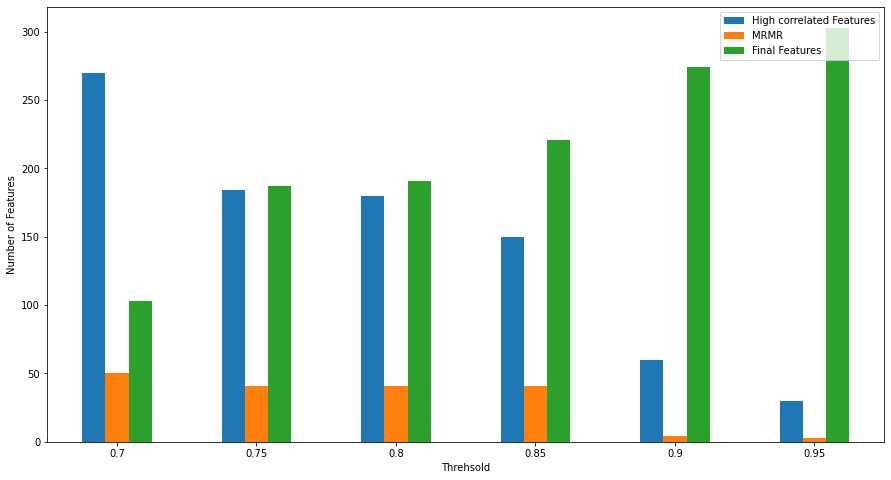

In [72]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/PRSA/feature_reduction_PRSA.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [73]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [74]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/Electricity/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

In [75]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [76]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [77]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [78]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [81]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.0392136
[2]	valid_0's l2: 0.0376701
[3]	valid_0's l2: 0.0357178
[4]	valid_0's l2: 0.0349522
[5]	valid_0's l2: 0.0339958
[6]	valid_0's l2: 0.033459
[7]	valid_0's l2: 0.0327781
[8]	valid_0's l2: 0.0324115
[9]	valid_0's l2: 0.0319619
[10]	valid_0's l2: 0.031499
[11]	valid_0's l2: 0.0312921
[12]	valid_0's l2: 0.0309986
[13]	valid_0's l2: 0.0308123
[14]	valid_0's l2: 0.0305736
[15]	valid_0's l2: 0.0303239
[16]	valid_0's l2: 0.030305
[17]	valid_0's l2: 0.0299575
[18]	valid_0's l2: 0.0298803
[19]	valid_0's l2: 0.0297664
[20]	valid_0's l2: 0.0297682
[21]	valid_0's l2: 0.02978
[22]	valid_0's l2: 0.0298208
[23]	valid_0's l2: 0.0297366
[24]	valid_0's l2: 0.0296171
[25]	valid_0's l2: 0.0296745
[26]	valid_0's l2: 0.0296498
[27]	valid_0's l2: 0.0297588
[28]	valid_0's l2: 0.0296677
[29]	valid_0's l2: 0.029806
[30]	valid_0's l2: 0.0297767
[31]	valid_0's l2: 0.0296409
[32]	valid_0's l2: 0.0297015
[33]	valid_0's l2: 0.0296722
[34]	valid_0's l2: 0.029658
[1]	valid_0's l2: 0.0399693
[2

[22]	valid_0's l2: 0.0321783
[23]	valid_0's l2: 0.0321179
[24]	valid_0's l2: 0.0320852
[25]	valid_0's l2: 0.0321656
[26]	valid_0's l2: 0.0322609
[27]	valid_0's l2: 0.0324774
[28]	valid_0's l2: 0.0323781
[29]	valid_0's l2: 0.0323669
[30]	valid_0's l2: 0.0323193
[31]	valid_0's l2: 0.0323414
[32]	valid_0's l2: 0.0322459
[33]	valid_0's l2: 0.0322883
[34]	valid_0's l2: 0.0324243
[1]	valid_0's l2: 0.0409472
[2]	valid_0's l2: 0.0410847
[3]	valid_0's l2: 0.0414362
[4]	valid_0's l2: 0.0413856
[5]	valid_0's l2: 0.0414518
[6]	valid_0's l2: 0.0412988
[7]	valid_0's l2: 0.041321
[8]	valid_0's l2: 0.0415672
[9]	valid_0's l2: 0.041535
[10]	valid_0's l2: 0.0415748
[11]	valid_0's l2: 0.0418756
[1]	valid_0's l2: 0.0392136
[2]	valid_0's l2: 0.0376701
[3]	valid_0's l2: 0.0357178
[4]	valid_0's l2: 0.0349522
[5]	valid_0's l2: 0.0339958
[6]	valid_0's l2: 0.033459
[7]	valid_0's l2: 0.0327781
[8]	valid_0's l2: 0.0324115
[9]	valid_0's l2: 0.0319619
[10]	valid_0's l2: 0.031499
[11]	valid_0's l2: 0.0312921
[12]	va

[1]	valid_0's l2: 0.0396133
[2]	valid_0's l2: 0.0385485
[3]	valid_0's l2: 0.0374107
[4]	valid_0's l2: 0.0367606
[5]	valid_0's l2: 0.0361933
[6]	valid_0's l2: 0.0355936
[7]	valid_0's l2: 0.0348584
[8]	valid_0's l2: 0.0342877
[9]	valid_0's l2: 0.0339414
[10]	valid_0's l2: 0.033644
[11]	valid_0's l2: 0.0334637
[12]	valid_0's l2: 0.0331157
[13]	valid_0's l2: 0.0328726
[14]	valid_0's l2: 0.0327009
[15]	valid_0's l2: 0.0325443
[16]	valid_0's l2: 0.0323388
[17]	valid_0's l2: 0.0322664
[18]	valid_0's l2: 0.0322858
[19]	valid_0's l2: 0.0322724
[20]	valid_0's l2: 0.0322596
[21]	valid_0's l2: 0.0321254
[22]	valid_0's l2: 0.0320447
[23]	valid_0's l2: 0.031979
[24]	valid_0's l2: 0.0320338
[25]	valid_0's l2: 0.0318539
[26]	valid_0's l2: 0.0318246
[27]	valid_0's l2: 0.0320132
[28]	valid_0's l2: 0.0321094
[29]	valid_0's l2: 0.0320601
[30]	valid_0's l2: 0.0320544
[31]	valid_0's l2: 0.0321338
[32]	valid_0's l2: 0.032099
[33]	valid_0's l2: 0.0322152
[34]	valid_0's l2: 0.0323282
[35]	valid_0's l2: 0.03248

[1]	valid_0's l2: 0.0399693
[2]	valid_0's l2: 0.0385446
[3]	valid_0's l2: 0.0374445
[4]	valid_0's l2: 0.03701
[5]	valid_0's l2: 0.0365491
[6]	valid_0's l2: 0.0362823
[7]	valid_0's l2: 0.0361031
[8]	valid_0's l2: 0.035705
[9]	valid_0's l2: 0.0354152
[10]	valid_0's l2: 0.0350246
[11]	valid_0's l2: 0.034871
[12]	valid_0's l2: 0.035099
[13]	valid_0's l2: 0.0347967
[14]	valid_0's l2: 0.0345332
[15]	valid_0's l2: 0.0341629
[16]	valid_0's l2: 0.0341838
[17]	valid_0's l2: 0.0340749
[18]	valid_0's l2: 0.0339304
[19]	valid_0's l2: 0.033875
[20]	valid_0's l2: 0.0338298
[21]	valid_0's l2: 0.0337528
[22]	valid_0's l2: 0.0336591
[23]	valid_0's l2: 0.0336644
[24]	valid_0's l2: 0.0335669
[25]	valid_0's l2: 0.033555
[26]	valid_0's l2: 0.0333253
[27]	valid_0's l2: 0.0332802
[28]	valid_0's l2: 0.0331607
[29]	valid_0's l2: 0.0331373
[30]	valid_0's l2: 0.0330077
[31]	valid_0's l2: 0.0330312
[32]	valid_0's l2: 0.0329795
[33]	valid_0's l2: 0.0330678
[34]	valid_0's l2: 0.0331642
[35]	valid_0's l2: 0.0331378
[

[26]	valid_0's l2: 0.0322609
[27]	valid_0's l2: 0.0324774
[28]	valid_0's l2: 0.0323781
[29]	valid_0's l2: 0.0323669
[30]	valid_0's l2: 0.0323193
[31]	valid_0's l2: 0.0323414
[32]	valid_0's l2: 0.0322459
[33]	valid_0's l2: 0.0322883
[34]	valid_0's l2: 0.0324243
[1]	valid_0's l2: 0.0409472
[2]	valid_0's l2: 0.0410847
[3]	valid_0's l2: 0.0414362
[4]	valid_0's l2: 0.0413856
[5]	valid_0's l2: 0.0414518
[6]	valid_0's l2: 0.0412988
[7]	valid_0's l2: 0.041321
[8]	valid_0's l2: 0.0415672
[9]	valid_0's l2: 0.041535
[10]	valid_0's l2: 0.0415748
[11]	valid_0's l2: 0.0418756
[1]	valid_0's l2: 0.0392136
[2]	valid_0's l2: 0.0376701
[3]	valid_0's l2: 0.0357178
[4]	valid_0's l2: 0.0349522
[5]	valid_0's l2: 0.0339958
[6]	valid_0's l2: 0.033459
[7]	valid_0's l2: 0.0327781
[8]	valid_0's l2: 0.0324115
[9]	valid_0's l2: 0.0319619
[10]	valid_0's l2: 0.031499
[11]	valid_0's l2: 0.0312921
[12]	valid_0's l2: 0.0309986
[13]	valid_0's l2: 0.0308123
[14]	valid_0's l2: 0.0305736
[15]	valid_0's l2: 0.0303239
[16]	va

[11]	valid_0's l2: 0.0334637
[12]	valid_0's l2: 0.0331157
[13]	valid_0's l2: 0.0328726
[14]	valid_0's l2: 0.0327009
[15]	valid_0's l2: 0.0325443
[16]	valid_0's l2: 0.0323388
[17]	valid_0's l2: 0.0322664
[18]	valid_0's l2: 0.0322858
[19]	valid_0's l2: 0.0322724
[20]	valid_0's l2: 0.0322596
[21]	valid_0's l2: 0.0321254
[22]	valid_0's l2: 0.0320447
[23]	valid_0's l2: 0.031979
[24]	valid_0's l2: 0.0320338
[25]	valid_0's l2: 0.0318539
[26]	valid_0's l2: 0.0318246
[27]	valid_0's l2: 0.0320132
[28]	valid_0's l2: 0.0321094
[29]	valid_0's l2: 0.0320601
[30]	valid_0's l2: 0.0320544
[31]	valid_0's l2: 0.0321338
[32]	valid_0's l2: 0.032099
[33]	valid_0's l2: 0.0322152
[34]	valid_0's l2: 0.0323282
[35]	valid_0's l2: 0.0324843
[36]	valid_0's l2: 0.0323539
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370149
[5]	valid_0's l2: 0.0365412
[6]	valid_0's l2: 0.0357621
[7]	valid_0's l2: 0.0348839
[8]	valid_0's l2: 0.0345094
[9]	valid_0's l2: 0.0343

[46]	valid_0's l2: 0.0280766
[47]	valid_0's l2: 0.0280429
[48]	valid_0's l2: 0.0279376
[49]	valid_0's l2: 0.0280288
[50]	valid_0's l2: 0.0280494
[51]	valid_0's l2: 0.0280896
[52]	valid_0's l2: 0.0280698
[53]	valid_0's l2: 0.0280601
[54]	valid_0's l2: 0.0280303
[55]	valid_0's l2: 0.0280105
[56]	valid_0's l2: 0.0280377
[57]	valid_0's l2: 0.0280439
[58]	valid_0's l2: 0.0280687
[1]	valid_0's l2: 0.0395069
[2]	valid_0's l2: 0.0385469
[3]	valid_0's l2: 0.0376563
[4]	valid_0's l2: 0.0367788
[5]	valid_0's l2: 0.0360687
[6]	valid_0's l2: 0.0357315
[7]	valid_0's l2: 0.035576
[8]	valid_0's l2: 0.0353458
[9]	valid_0's l2: 0.0351101
[10]	valid_0's l2: 0.0347987
[11]	valid_0's l2: 0.0345139
[12]	valid_0's l2: 0.0344784
[13]	valid_0's l2: 0.0343998
[14]	valid_0's l2: 0.0343146
[15]	valid_0's l2: 0.0341577
[16]	valid_0's l2: 0.0338919
[17]	valid_0's l2: 0.0336865
[18]	valid_0's l2: 0.0338559
[19]	valid_0's l2: 0.0337025
[20]	valid_0's l2: 0.0335558
[21]	valid_0's l2: 0.033468
[22]	valid_0's l2: 0.0335

[1]	valid_0's l2: 0.0398918
[2]	valid_0's l2: 0.0388263
[3]	valid_0's l2: 0.0381319
[4]	valid_0's l2: 0.0372496
[5]	valid_0's l2: 0.0362649
[6]	valid_0's l2: 0.0354336
[7]	valid_0's l2: 0.0350102
[8]	valid_0's l2: 0.0347201
[9]	valid_0's l2: 0.0342903
[10]	valid_0's l2: 0.0339337
[11]	valid_0's l2: 0.0334362
[12]	valid_0's l2: 0.0330448
[13]	valid_0's l2: 0.0328346
[14]	valid_0's l2: 0.0324996
[15]	valid_0's l2: 0.0324359
[16]	valid_0's l2: 0.0323255
[17]	valid_0's l2: 0.0321769
[18]	valid_0's l2: 0.032064
[19]	valid_0's l2: 0.0318586
[20]	valid_0's l2: 0.0318683
[21]	valid_0's l2: 0.0317184
[22]	valid_0's l2: 0.0316348
[23]	valid_0's l2: 0.0313867
[24]	valid_0's l2: 0.0315928
[25]	valid_0's l2: 0.0314297
[26]	valid_0's l2: 0.0316455
[27]	valid_0's l2: 0.0314481
[28]	valid_0's l2: 0.0313023
[29]	valid_0's l2: 0.0314166
[30]	valid_0's l2: 0.031384
[31]	valid_0's l2: 0.0316139
[32]	valid_0's l2: 0.0315582
[33]	valid_0's l2: 0.0313684
[34]	valid_0's l2: 0.031252
[35]	valid_0's l2: 0.03117

[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370584
[5]	valid_0's l2: 0.0365836
[6]	valid_0's l2: 0.0358123
[7]	valid_0's l2: 0.0349974
[8]	valid_0's l2: 0.0346323
[9]	valid_0's l2: 0.0341843
[10]	valid_0's l2: 0.0338588
[11]	valid_0's l2: 0.0336027
[12]	valid_0's l2: 0.0333341
[13]	valid_0's l2: 0.0331764
[14]	valid_0's l2: 0.0330557
[15]	valid_0's l2: 0.0330231
[16]	valid_0's l2: 0.0329398
[17]	valid_0's l2: 0.0326705
[18]	valid_0's l2: 0.0327342
[19]	valid_0's l2: 0.0324375
[20]	valid_0's l2: 0.0323859
[21]	valid_0's l2: 0.0322349
[22]	valid_0's l2: 0.0323358
[23]	valid_0's l2: 0.0323171
[24]	valid_0's l2: 0.0323242
[25]	valid_0's l2: 0.0321838
[26]	valid_0's l2: 0.0321864
[27]	valid_0's l2: 0.032448
[28]	valid_0's l2: 0.0323473
[29]	valid_0's l2: 0.0323791
[30]	valid_0's l2: 0.0324159
[31]	valid_0's l2: 0.0324144
[32]	valid_0's l2: 0.0325388
[33]	valid_0's l2: 0.0324623
[34]	valid_0's l2: 0.032578
[35]	valid_0's l2: 0.0325175
[1]	valid_0's l2: 0.0389

[28]	valid_0's l2: 0.0285561
[29]	valid_0's l2: 0.0284436
[30]	valid_0's l2: 0.0284802
[31]	valid_0's l2: 0.0284474
[32]	valid_0's l2: 0.0284155
[33]	valid_0's l2: 0.0283571
[34]	valid_0's l2: 0.0282844
[35]	valid_0's l2: 0.0283092
[36]	valid_0's l2: 0.0283058
[37]	valid_0's l2: 0.0281266
[38]	valid_0's l2: 0.0281473
[39]	valid_0's l2: 0.0282421
[40]	valid_0's l2: 0.02812
[41]	valid_0's l2: 0.0280798
[42]	valid_0's l2: 0.0280287
[43]	valid_0's l2: 0.028065
[44]	valid_0's l2: 0.0281342
[45]	valid_0's l2: 0.0281195
[46]	valid_0's l2: 0.0280766
[47]	valid_0's l2: 0.0280429
[48]	valid_0's l2: 0.0279376
[49]	valid_0's l2: 0.0280288
[50]	valid_0's l2: 0.0280494
[51]	valid_0's l2: 0.0280896
[52]	valid_0's l2: 0.0280698
[53]	valid_0's l2: 0.0280601
[54]	valid_0's l2: 0.0280303
[55]	valid_0's l2: 0.0280105
[56]	valid_0's l2: 0.0280377
[57]	valid_0's l2: 0.0280439
[58]	valid_0's l2: 0.0280687
[1]	valid_0's l2: 0.0395069
[2]	valid_0's l2: 0.0385469
[3]	valid_0's l2: 0.0376563
[4]	valid_0's l2: 0.

[33]	valid_0's l2: 0.0332832
[34]	valid_0's l2: 0.0333459
[35]	valid_0's l2: 0.0331526
[36]	valid_0's l2: 0.0330535
[37]	valid_0's l2: 0.0329313
[38]	valid_0's l2: 0.0329298
[39]	valid_0's l2: 0.0328924
[40]	valid_0's l2: 0.0329653
[41]	valid_0's l2: 0.0329755
[42]	valid_0's l2: 0.0328642
[43]	valid_0's l2: 0.0328982
[44]	valid_0's l2: 0.0329212
[45]	valid_0's l2: 0.0329084
[46]	valid_0's l2: 0.0328061
[47]	valid_0's l2: 0.032855
[48]	valid_0's l2: 0.0328107
[49]	valid_0's l2: 0.0328
[50]	valid_0's l2: 0.0328158
[51]	valid_0's l2: 0.0328247
[52]	valid_0's l2: 0.0328705
[53]	valid_0's l2: 0.0330117
[54]	valid_0's l2: 0.0330571
[55]	valid_0's l2: 0.0329533
[56]	valid_0's l2: 0.0329406
[57]	valid_0's l2: 0.0329241
[58]	valid_0's l2: 0.0329598
[59]	valid_0's l2: 0.0329922
[1]	valid_0's l2: 0.0398918
[2]	valid_0's l2: 0.0388263
[3]	valid_0's l2: 0.0381319
[4]	valid_0's l2: 0.0372496
[5]	valid_0's l2: 0.0362649
[6]	valid_0's l2: 0.0354336
[7]	valid_0's l2: 0.0350102
[8]	valid_0's l2: 0.03472

[49]	valid_0's l2: 0.0316038
[1]	valid_0's l2: 0.040118
[2]	valid_0's l2: 0.0392389
[3]	valid_0's l2: 0.0381423
[4]	valid_0's l2: 0.0374352
[5]	valid_0's l2: 0.0364627
[6]	valid_0's l2: 0.0362195
[7]	valid_0's l2: 0.0356702
[8]	valid_0's l2: 0.0350935
[9]	valid_0's l2: 0.035005
[10]	valid_0's l2: 0.034647
[11]	valid_0's l2: 0.0343315
[12]	valid_0's l2: 0.0341067
[13]	valid_0's l2: 0.0340535
[14]	valid_0's l2: 0.0341491
[15]	valid_0's l2: 0.0337519
[16]	valid_0's l2: 0.033512
[17]	valid_0's l2: 0.0338818
[18]	valid_0's l2: 0.0338659
[19]	valid_0's l2: 0.0338606
[20]	valid_0's l2: 0.0337537
[21]	valid_0's l2: 0.0338263
[22]	valid_0's l2: 0.0337992
[23]	valid_0's l2: 0.0338503
[24]	valid_0's l2: 0.0341498
[25]	valid_0's l2: 0.0341581
[26]	valid_0's l2: 0.034078
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370584
[5]	valid_0's l2: 0.0365836
[6]	valid_0's l2: 0.0358123
[7]	valid_0's l2: 0.0349974
[8]	valid_0's l2: 0.0346323
[9]	val

[1]	valid_0's l2: 0.0389213
[2]	valid_0's l2: 0.037045
[3]	valid_0's l2: 0.0357073
[4]	valid_0's l2: 0.0347294
[5]	valid_0's l2: 0.0340249
[6]	valid_0's l2: 0.0333782
[7]	valid_0's l2: 0.0324909
[8]	valid_0's l2: 0.0320446
[9]	valid_0's l2: 0.031531
[10]	valid_0's l2: 0.0313151
[11]	valid_0's l2: 0.0308358
[12]	valid_0's l2: 0.0307257
[13]	valid_0's l2: 0.0303816
[14]	valid_0's l2: 0.0299997
[15]	valid_0's l2: 0.0299771
[16]	valid_0's l2: 0.0298634
[17]	valid_0's l2: 0.0296128
[18]	valid_0's l2: 0.0294639
[19]	valid_0's l2: 0.0292683
[20]	valid_0's l2: 0.0291805
[21]	valid_0's l2: 0.0292415
[22]	valid_0's l2: 0.0292353
[23]	valid_0's l2: 0.0290521
[24]	valid_0's l2: 0.02906
[25]	valid_0's l2: 0.0288097
[26]	valid_0's l2: 0.0288809
[27]	valid_0's l2: 0.0287971
[28]	valid_0's l2: 0.0285561
[29]	valid_0's l2: 0.0284436
[30]	valid_0's l2: 0.0284802
[31]	valid_0's l2: 0.0284474
[32]	valid_0's l2: 0.0284155
[33]	valid_0's l2: 0.0283571
[34]	valid_0's l2: 0.0282844
[35]	valid_0's l2: 0.028309

[4]	valid_0's l2: 0.0367788
[5]	valid_0's l2: 0.0360687
[6]	valid_0's l2: 0.0357315
[7]	valid_0's l2: 0.035576
[8]	valid_0's l2: 0.0353458
[9]	valid_0's l2: 0.0351101
[10]	valid_0's l2: 0.0347987
[11]	valid_0's l2: 0.0345139
[12]	valid_0's l2: 0.0344784
[13]	valid_0's l2: 0.0343998
[14]	valid_0's l2: 0.0343146
[15]	valid_0's l2: 0.0341577
[16]	valid_0's l2: 0.0338919
[17]	valid_0's l2: 0.0336865
[18]	valid_0's l2: 0.0338559
[19]	valid_0's l2: 0.0337025
[20]	valid_0's l2: 0.0335558
[21]	valid_0's l2: 0.033468
[22]	valid_0's l2: 0.0335092
[23]	valid_0's l2: 0.033769
[24]	valid_0's l2: 0.0336768
[25]	valid_0's l2: 0.0336233
[26]	valid_0's l2: 0.0336722
[27]	valid_0's l2: 0.0336351
[28]	valid_0's l2: 0.0334061
[29]	valid_0's l2: 0.0333606
[30]	valid_0's l2: 0.0333229
[31]	valid_0's l2: 0.0332865
[32]	valid_0's l2: 0.0332548
[33]	valid_0's l2: 0.0332832
[34]	valid_0's l2: 0.0333459
[35]	valid_0's l2: 0.0331526
[36]	valid_0's l2: 0.0330535
[37]	valid_0's l2: 0.0329313
[38]	valid_0's l2: 0.03

[49]	valid_0's l2: 0.0282538
[50]	valid_0's l2: 0.0283568
[51]	valid_0's l2: 0.0283649
[52]	valid_0's l2: 0.0284347
[53]	valid_0's l2: 0.028548
[54]	valid_0's l2: 0.0285235
[55]	valid_0's l2: 0.028559
[56]	valid_0's l2: 0.0286059
[1]	valid_0's l2: 0.0401934
[2]	valid_0's l2: 0.0393993
[3]	valid_0's l2: 0.0382518
[4]	valid_0's l2: 0.0376581
[5]	valid_0's l2: 0.0374873
[6]	valid_0's l2: 0.0369358
[7]	valid_0's l2: 0.0361867
[8]	valid_0's l2: 0.0358855
[9]	valid_0's l2: 0.0356166
[10]	valid_0's l2: 0.0352998
[11]	valid_0's l2: 0.0351522
[12]	valid_0's l2: 0.0350645
[13]	valid_0's l2: 0.035091
[14]	valid_0's l2: 0.0350299
[15]	valid_0's l2: 0.0349809
[16]	valid_0's l2: 0.0350745
[17]	valid_0's l2: 0.0350482
[18]	valid_0's l2: 0.0351754
[19]	valid_0's l2: 0.035051
[20]	valid_0's l2: 0.0351431
[21]	valid_0's l2: 0.0352175
[22]	valid_0's l2: 0.0351679
[23]	valid_0's l2: 0.0352492
[24]	valid_0's l2: 0.0353902
[25]	valid_0's l2: 0.0352732
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882


[34]	valid_0's l2: 0.0282309
[35]	valid_0's l2: 0.0280657
[36]	valid_0's l2: 0.0281045
[37]	valid_0's l2: 0.0280453
[38]	valid_0's l2: 0.028063
[39]	valid_0's l2: 0.028052
[40]	valid_0's l2: 0.0280267
[41]	valid_0's l2: 0.0280276
[42]	valid_0's l2: 0.0279716
[43]	valid_0's l2: 0.0279396
[44]	valid_0's l2: 0.0280579
[45]	valid_0's l2: 0.0280722
[46]	valid_0's l2: 0.0280293
[47]	valid_0's l2: 0.0280297
[48]	valid_0's l2: 0.0280353
[49]	valid_0's l2: 0.0280343
[50]	valid_0's l2: 0.0279757
[51]	valid_0's l2: 0.0280265
[52]	valid_0's l2: 0.0280263
[53]	valid_0's l2: 0.0280723
[1]	valid_0's l2: 0.0394281
[2]	valid_0's l2: 0.0383437
[3]	valid_0's l2: 0.0374841
[4]	valid_0's l2: 0.0366541
[5]	valid_0's l2: 0.0359712
[6]	valid_0's l2: 0.0352274
[7]	valid_0's l2: 0.0349415
[8]	valid_0's l2: 0.0347707
[9]	valid_0's l2: 0.0344423
[10]	valid_0's l2: 0.0343113
[11]	valid_0's l2: 0.0338773
[12]	valid_0's l2: 0.0333906
[13]	valid_0's l2: 0.0329466
[14]	valid_0's l2: 0.0327452
[15]	valid_0's l2: 0.0325

[35]	valid_0's l2: 0.0286559
[36]	valid_0's l2: 0.0285064
[37]	valid_0's l2: 0.0283829
[38]	valid_0's l2: 0.0284324
[39]	valid_0's l2: 0.0284209
[40]	valid_0's l2: 0.0284327
[41]	valid_0's l2: 0.0283321
[42]	valid_0's l2: 0.0284111
[43]	valid_0's l2: 0.0283813
[44]	valid_0's l2: 0.0282674
[45]	valid_0's l2: 0.0282852
[46]	valid_0's l2: 0.0282015
[47]	valid_0's l2: 0.0282375
[48]	valid_0's l2: 0.0282023
[49]	valid_0's l2: 0.0282538
[50]	valid_0's l2: 0.0283568
[51]	valid_0's l2: 0.0283649
[52]	valid_0's l2: 0.0284347
[53]	valid_0's l2: 0.028548
[54]	valid_0's l2: 0.0285235
[55]	valid_0's l2: 0.028559
[56]	valid_0's l2: 0.0286059
[1]	valid_0's l2: 0.0401934
[2]	valid_0's l2: 0.0393993
[3]	valid_0's l2: 0.0382518
[4]	valid_0's l2: 0.0376581
[5]	valid_0's l2: 0.0374873
[6]	valid_0's l2: 0.0369358
[7]	valid_0's l2: 0.0361867
[8]	valid_0's l2: 0.0358855
[9]	valid_0's l2: 0.0356166
[10]	valid_0's l2: 0.0352998
[11]	valid_0's l2: 0.0351522
[12]	valid_0's l2: 0.0350645
[13]	valid_0's l2: 0.0350

[1]	valid_0's l2: 0.0389213
[2]	valid_0's l2: 0.037045
[3]	valid_0's l2: 0.0357073
[4]	valid_0's l2: 0.0347294
[5]	valid_0's l2: 0.0340814
[6]	valid_0's l2: 0.0334265
[7]	valid_0's l2: 0.032744
[8]	valid_0's l2: 0.0320844
[9]	valid_0's l2: 0.0315262
[10]	valid_0's l2: 0.0312381
[11]	valid_0's l2: 0.0308354
[12]	valid_0's l2: 0.0307989
[13]	valid_0's l2: 0.0304059
[14]	valid_0's l2: 0.0302149
[15]	valid_0's l2: 0.0298648
[16]	valid_0's l2: 0.0298213
[17]	valid_0's l2: 0.029558
[18]	valid_0's l2: 0.0293899
[19]	valid_0's l2: 0.0293036
[20]	valid_0's l2: 0.0290804
[21]	valid_0's l2: 0.0289219
[22]	valid_0's l2: 0.0288331
[23]	valid_0's l2: 0.0287913
[24]	valid_0's l2: 0.0286584
[25]	valid_0's l2: 0.0286349
[26]	valid_0's l2: 0.0285726
[27]	valid_0's l2: 0.0284538
[28]	valid_0's l2: 0.0283852
[29]	valid_0's l2: 0.0282124
[30]	valid_0's l2: 0.0282019
[31]	valid_0's l2: 0.0282305
[32]	valid_0's l2: 0.0282104
[33]	valid_0's l2: 0.0281229
[34]	valid_0's l2: 0.0282309
[35]	valid_0's l2: 0.02806

[33]	valid_0's l2: 0.0313422
[34]	valid_0's l2: 0.0313333
[35]	valid_0's l2: 0.0314682
[36]	valid_0's l2: 0.0314496
[37]	valid_0's l2: 0.031579
[38]	valid_0's l2: 0.0316086
[39]	valid_0's l2: 0.0314403
[1]	valid_0's l2: 0.0388521
[2]	valid_0's l2: 0.0369414
[3]	valid_0's l2: 0.0354921
[4]	valid_0's l2: 0.0347571
[5]	valid_0's l2: 0.0338799
[6]	valid_0's l2: 0.0328859
[7]	valid_0's l2: 0.0323708
[8]	valid_0's l2: 0.031995
[9]	valid_0's l2: 0.0311989
[10]	valid_0's l2: 0.0305307
[11]	valid_0's l2: 0.0301188
[12]	valid_0's l2: 0.030045
[13]	valid_0's l2: 0.0298848
[14]	valid_0's l2: 0.0296153
[15]	valid_0's l2: 0.0294589
[16]	valid_0's l2: 0.0293899
[17]	valid_0's l2: 0.0294233
[18]	valid_0's l2: 0.0292901
[19]	valid_0's l2: 0.0290999
[20]	valid_0's l2: 0.0290104
[21]	valid_0's l2: 0.0292206
[22]	valid_0's l2: 0.0291604
[23]	valid_0's l2: 0.0291836
[24]	valid_0's l2: 0.0291332
[25]	valid_0's l2: 0.0289586
[26]	valid_0's l2: 0.0290108
[27]	valid_0's l2: 0.0289113
[28]	valid_0's l2: 0.02890

[1]	valid_0's l2: 0.0389213
[2]	valid_0's l2: 0.037045
[3]	valid_0's l2: 0.0357073
[4]	valid_0's l2: 0.0347294
[5]	valid_0's l2: 0.0340814
[6]	valid_0's l2: 0.0334265
[7]	valid_0's l2: 0.032744
[8]	valid_0's l2: 0.0320844
[9]	valid_0's l2: 0.0315262
[10]	valid_0's l2: 0.0312381
[11]	valid_0's l2: 0.0308354
[12]	valid_0's l2: 0.0307989
[13]	valid_0's l2: 0.0304059
[14]	valid_0's l2: 0.0302149
[15]	valid_0's l2: 0.0298648
[16]	valid_0's l2: 0.0298213
[17]	valid_0's l2: 0.029558
[18]	valid_0's l2: 0.0293899
[19]	valid_0's l2: 0.0293036
[20]	valid_0's l2: 0.0290804
[21]	valid_0's l2: 0.0289219
[22]	valid_0's l2: 0.0288331
[23]	valid_0's l2: 0.0287913
[24]	valid_0's l2: 0.0286584
[25]	valid_0's l2: 0.0286349
[26]	valid_0's l2: 0.0285726
[27]	valid_0's l2: 0.0284538
[28]	valid_0's l2: 0.0283852
[29]	valid_0's l2: 0.0282124
[30]	valid_0's l2: 0.0282019
[31]	valid_0's l2: 0.0282305
[32]	valid_0's l2: 0.0282104
[33]	valid_0's l2: 0.0281229
[34]	valid_0's l2: 0.0282309
[35]	valid_0's l2: 0.02806

[1]	valid_0's l2: 0.0388521
[2]	valid_0's l2: 0.0369414
[3]	valid_0's l2: 0.0354921
[4]	valid_0's l2: 0.0347571
[5]	valid_0's l2: 0.0338799
[6]	valid_0's l2: 0.0328859
[7]	valid_0's l2: 0.0323708
[8]	valid_0's l2: 0.031995
[9]	valid_0's l2: 0.0311989
[10]	valid_0's l2: 0.0305307
[11]	valid_0's l2: 0.0301188
[12]	valid_0's l2: 0.030045
[13]	valid_0's l2: 0.0298848
[14]	valid_0's l2: 0.0296153
[15]	valid_0's l2: 0.0294589
[16]	valid_0's l2: 0.0293899
[17]	valid_0's l2: 0.0294233
[18]	valid_0's l2: 0.0292901
[19]	valid_0's l2: 0.0290999
[20]	valid_0's l2: 0.0290104
[21]	valid_0's l2: 0.0292206
[22]	valid_0's l2: 0.0291604
[23]	valid_0's l2: 0.0291836
[24]	valid_0's l2: 0.0291332
[25]	valid_0's l2: 0.0289586
[26]	valid_0's l2: 0.0290108
[27]	valid_0's l2: 0.0289113
[28]	valid_0's l2: 0.0289076
[29]	valid_0's l2: 0.0289075
[30]	valid_0's l2: 0.028793
[31]	valid_0's l2: 0.0287185
[32]	valid_0's l2: 0.028578
[33]	valid_0's l2: 0.0286798
[34]	valid_0's l2: 0.0287138
[35]	valid_0's l2: 0.028655

[1]	valid_0's l2: 0.0388586
[2]	valid_0's l2: 0.0371928
[3]	valid_0's l2: 0.0364155
[4]	valid_0's l2: 0.0353902
[5]	valid_0's l2: 0.0341717
[6]	valid_0's l2: 0.0338065
[7]	valid_0's l2: 0.0335322
[8]	valid_0's l2: 0.0331225
[9]	valid_0's l2: 0.0326349
[10]	valid_0's l2: 0.0322629
[11]	valid_0's l2: 0.0320909
[12]	valid_0's l2: 0.0316487
[13]	valid_0's l2: 0.0316329
[14]	valid_0's l2: 0.0317046
[15]	valid_0's l2: 0.0314391
[16]	valid_0's l2: 0.0311323
[17]	valid_0's l2: 0.031199
[18]	valid_0's l2: 0.0313666
[19]	valid_0's l2: 0.0314837
[20]	valid_0's l2: 0.0313645
[21]	valid_0's l2: 0.0313276
[22]	valid_0's l2: 0.0314285
[23]	valid_0's l2: 0.0313839
[24]	valid_0's l2: 0.0316309
[25]	valid_0's l2: 0.0314599
[26]	valid_0's l2: 0.0314069
[1]	valid_0's l2: 0.0397824
[2]	valid_0's l2: 0.0385044
[3]	valid_0's l2: 0.0374894
[4]	valid_0's l2: 0.0366252
[5]	valid_0's l2: 0.0358024
[6]	valid_0's l2: 0.0354117
[7]	valid_0's l2: 0.0350546
[8]	valid_0's l2: 0.0349567
[9]	valid_0's l2: 0.0345117
[10]

[7]	valid_0's l2: 0.0350223
[8]	valid_0's l2: 0.0347528
[9]	valid_0's l2: 0.0344216
[10]	valid_0's l2: 0.0340332
[11]	valid_0's l2: 0.0337225
[12]	valid_0's l2: 0.0335325
[13]	valid_0's l2: 0.0334441
[14]	valid_0's l2: 0.0332602
[15]	valid_0's l2: 0.033102
[16]	valid_0's l2: 0.0329767
[17]	valid_0's l2: 0.0327376
[18]	valid_0's l2: 0.032625
[19]	valid_0's l2: 0.0325795
[20]	valid_0's l2: 0.0322989
[21]	valid_0's l2: 0.0322647
[22]	valid_0's l2: 0.032228
[23]	valid_0's l2: 0.0321
[24]	valid_0's l2: 0.0320927
[25]	valid_0's l2: 0.0319824
[26]	valid_0's l2: 0.0319584
[27]	valid_0's l2: 0.0319109
[28]	valid_0's l2: 0.0320021
[29]	valid_0's l2: 0.0320066
[30]	valid_0's l2: 0.0321046
[31]	valid_0's l2: 0.0321128
[32]	valid_0's l2: 0.0322186
[33]	valid_0's l2: 0.0320478
[34]	valid_0's l2: 0.0320965
[35]	valid_0's l2: 0.0320143
[36]	valid_0's l2: 0.0319903
[37]	valid_0's l2: 0.0321658
[1]	valid_0's l2: 0.0388586
[2]	valid_0's l2: 0.0371928
[3]	valid_0's l2: 0.0364155
[4]	valid_0's l2: 0.035390

[1]	valid_0's l2: 0.0398027
[2]	valid_0's l2: 0.0389268
[3]	valid_0's l2: 0.0382936
[4]	valid_0's l2: 0.0376331
[5]	valid_0's l2: 0.0372742
[6]	valid_0's l2: 0.0368299
[7]	valid_0's l2: 0.0364647
[8]	valid_0's l2: 0.0359999
[9]	valid_0's l2: 0.0359311
[10]	valid_0's l2: 0.0354763
[11]	valid_0's l2: 0.0354488
[12]	valid_0's l2: 0.0352947
[13]	valid_0's l2: 0.0352792
[14]	valid_0's l2: 0.035208
[15]	valid_0's l2: 0.0350753
[16]	valid_0's l2: 0.0350687
[17]	valid_0's l2: 0.0350955
[18]	valid_0's l2: 0.035115
[19]	valid_0's l2: 0.0353054
[20]	valid_0's l2: 0.0352995
[21]	valid_0's l2: 0.0353988
[22]	valid_0's l2: 0.0350184
[23]	valid_0's l2: 0.035264
[24]	valid_0's l2: 0.0354225
[25]	valid_0's l2: 0.0356548
[26]	valid_0's l2: 0.035706
[27]	valid_0's l2: 0.0356018
[28]	valid_0's l2: 0.0358834
[29]	valid_0's l2: 0.0357808
[30]	valid_0's l2: 0.0356384
[31]	valid_0's l2: 0.035527
[32]	valid_0's l2: 0.0357011
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0390235
[3]	valid_0's l2: 0.037881
[4]

[27]	valid_0's l2: 0.0322082
[28]	valid_0's l2: 0.0321476
[29]	valid_0's l2: 0.0320396
[30]	valid_0's l2: 0.0319647
[31]	valid_0's l2: 0.0320326
[32]	valid_0's l2: 0.0319345
[33]	valid_0's l2: 0.0318461
[34]	valid_0's l2: 0.0317516
[35]	valid_0's l2: 0.0317426
[36]	valid_0's l2: 0.0317568
[37]	valid_0's l2: 0.0319305
[38]	valid_0's l2: 0.032052
[39]	valid_0's l2: 0.0318925
[40]	valid_0's l2: 0.0318709
[41]	valid_0's l2: 0.0318283
[42]	valid_0's l2: 0.0318307
[43]	valid_0's l2: 0.03179
[44]	valid_0's l2: 0.0318629
[45]	valid_0's l2: 0.0320051
[1]	valid_0's l2: 0.0387203
[2]	valid_0's l2: 0.0366673
[3]	valid_0's l2: 0.0351246
[4]	valid_0's l2: 0.0346564
[5]	valid_0's l2: 0.0337061
[6]	valid_0's l2: 0.0332651
[7]	valid_0's l2: 0.033125
[8]	valid_0's l2: 0.0328499
[9]	valid_0's l2: 0.0326
[10]	valid_0's l2: 0.0322621
[11]	valid_0's l2: 0.0320733
[12]	valid_0's l2: 0.0317879
[13]	valid_0's l2: 0.0317462
[14]	valid_0's l2: 0.0315462
[15]	valid_0's l2: 0.0313702
[16]	valid_0's l2: 0.0311091
[

[1]	valid_0's l2: 0.0388586
[2]	valid_0's l2: 0.0371928
[3]	valid_0's l2: 0.0364155
[4]	valid_0's l2: 0.0353902
[5]	valid_0's l2: 0.0341717
[6]	valid_0's l2: 0.0338065
[7]	valid_0's l2: 0.0335322
[8]	valid_0's l2: 0.0331225
[9]	valid_0's l2: 0.0326349
[10]	valid_0's l2: 0.0322629
[11]	valid_0's l2: 0.0320909
[12]	valid_0's l2: 0.0316487
[13]	valid_0's l2: 0.0316329
[14]	valid_0's l2: 0.0317046
[15]	valid_0's l2: 0.0314391
[16]	valid_0's l2: 0.0311323
[17]	valid_0's l2: 0.031199
[18]	valid_0's l2: 0.0313666
[19]	valid_0's l2: 0.0314837
[20]	valid_0's l2: 0.0313645
[21]	valid_0's l2: 0.0313276
[22]	valid_0's l2: 0.0314285
[23]	valid_0's l2: 0.0313839
[24]	valid_0's l2: 0.0316309
[25]	valid_0's l2: 0.0314599
[26]	valid_0's l2: 0.0314069
[1]	valid_0's l2: 0.0397824
[2]	valid_0's l2: 0.0385044
[3]	valid_0's l2: 0.0374894
[4]	valid_0's l2: 0.0366252
[5]	valid_0's l2: 0.0358024
[6]	valid_0's l2: 0.0354117
[7]	valid_0's l2: 0.0350546
[8]	valid_0's l2: 0.0349567
[9]	valid_0's l2: 0.0345117
[10]

[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0390235
[3]	valid_0's l2: 0.037881
[4]	valid_0's l2: 0.0370036
[5]	valid_0's l2: 0.0364988
[6]	valid_0's l2: 0.0358997
[7]	valid_0's l2: 0.0350223
[8]	valid_0's l2: 0.0347528
[9]	valid_0's l2: 0.0344216
[10]	valid_0's l2: 0.0340332
[11]	valid_0's l2: 0.0337225
[12]	valid_0's l2: 0.0335325
[13]	valid_0's l2: 0.0334441
[14]	valid_0's l2: 0.0332602
[15]	valid_0's l2: 0.033102
[16]	valid_0's l2: 0.0329767
[17]	valid_0's l2: 0.0327376
[18]	valid_0's l2: 0.032625
[19]	valid_0's l2: 0.0325795
[20]	valid_0's l2: 0.0322989
[21]	valid_0's l2: 0.0322647
[22]	valid_0's l2: 0.032228
[23]	valid_0's l2: 0.0321
[24]	valid_0's l2: 0.0320927
[25]	valid_0's l2: 0.0319824
[26]	valid_0's l2: 0.0319584
[27]	valid_0's l2: 0.0319109
[28]	valid_0's l2: 0.0320021
[29]	valid_0's l2: 0.0320066
[30]	valid_0's l2: 0.0321046
[31]	valid_0's l2: 0.0321128
[32]	valid_0's l2: 0.0322186
[33]	valid_0's l2: 0.0320478
[34]	valid_0's l2: 0.0320965
[35]	valid_0's l2: 0.0320143
[

[25]	valid_0's l2: 0.0313429
[26]	valid_0's l2: 0.0314115
[27]	valid_0's l2: 0.0311501
[28]	valid_0's l2: 0.0309477
[29]	valid_0's l2: 0.0308973
[30]	valid_0's l2: 0.0308399
[31]	valid_0's l2: 0.0307602
[32]	valid_0's l2: 0.0306463
[33]	valid_0's l2: 0.0308193
[34]	valid_0's l2: 0.0307323
[35]	valid_0's l2: 0.0307366
[36]	valid_0's l2: 0.030766
[37]	valid_0's l2: 0.0305702
[38]	valid_0's l2: 0.0305338
[39]	valid_0's l2: 0.0305433
[40]	valid_0's l2: 0.0304358
[41]	valid_0's l2: 0.0303526
[42]	valid_0's l2: 0.0302241
[43]	valid_0's l2: 0.0303439
[44]	valid_0's l2: 0.030227
[45]	valid_0's l2: 0.0302809
[46]	valid_0's l2: 0.0302642
[47]	valid_0's l2: 0.0302675
[48]	valid_0's l2: 0.0301924
[49]	valid_0's l2: 0.0301253
[50]	valid_0's l2: 0.0301034
[51]	valid_0's l2: 0.0301438
[52]	valid_0's l2: 0.0301433
[53]	valid_0's l2: 0.0302446
[54]	valid_0's l2: 0.0302834
[55]	valid_0's l2: 0.030336
[56]	valid_0's l2: 0.0302696
[57]	valid_0's l2: 0.0303306
[58]	valid_0's l2: 0.0303021
[59]	valid_0's l2

[14]	valid_0's l2: 0.0348593
[15]	valid_0's l2: 0.0346229
[16]	valid_0's l2: 0.0346348
[17]	valid_0's l2: 0.0344756
[18]	valid_0's l2: 0.0343157
[19]	valid_0's l2: 0.0341408
[20]	valid_0's l2: 0.0339242
[21]	valid_0's l2: 0.0339028
[22]	valid_0's l2: 0.0339228
[23]	valid_0's l2: 0.0339098
[24]	valid_0's l2: 0.0339568
[25]	valid_0's l2: 0.0340064
[26]	valid_0's l2: 0.0340111
[27]	valid_0's l2: 0.0340881
[28]	valid_0's l2: 0.034022
[29]	valid_0's l2: 0.0340016
[30]	valid_0's l2: 0.0340764
[31]	valid_0's l2: 0.0338599
[32]	valid_0's l2: 0.0338359
[33]	valid_0's l2: 0.0339764
[34]	valid_0's l2: 0.0338086
[35]	valid_0's l2: 0.0339056
[36]	valid_0's l2: 0.033863
[37]	valid_0's l2: 0.0338758
[38]	valid_0's l2: 0.0338658
[39]	valid_0's l2: 0.0339502
[40]	valid_0's l2: 0.033978
[41]	valid_0's l2: 0.0340751
[42]	valid_0's l2: 0.0339468
[43]	valid_0's l2: 0.0338946
[44]	valid_0's l2: 0.0339277
[1]	valid_0's l2: 0.0398287
[2]	valid_0's l2: 0.0390247
[3]	valid_0's l2: 0.0379632
[4]	valid_0's l2: 0.

[1]	valid_0's l2: 0.0389613
[2]	valid_0's l2: 0.0376743
[3]	valid_0's l2: 0.0362304
[4]	valid_0's l2: 0.0352005
[5]	valid_0's l2: 0.0341926
[6]	valid_0's l2: 0.0329145
[7]	valid_0's l2: 0.0322835
[8]	valid_0's l2: 0.0316536
[9]	valid_0's l2: 0.0315486
[10]	valid_0's l2: 0.0312136
[11]	valid_0's l2: 0.0307287
[12]	valid_0's l2: 0.0308616
[13]	valid_0's l2: 0.0307086
[14]	valid_0's l2: 0.030564
[15]	valid_0's l2: 0.0304156
[16]	valid_0's l2: 0.0302104
[17]	valid_0's l2: 0.03004
[18]	valid_0's l2: 0.0301093
[19]	valid_0's l2: 0.0300465
[20]	valid_0's l2: 0.0300622
[21]	valid_0's l2: 0.0301465
[22]	valid_0's l2: 0.0302537
[23]	valid_0's l2: 0.0301957
[24]	valid_0's l2: 0.0302966
[25]	valid_0's l2: 0.030192
[26]	valid_0's l2: 0.0300794
[27]	valid_0's l2: 0.0300668
[1]	valid_0's l2: 0.0398311
[2]	valid_0's l2: 0.0384432
[3]	valid_0's l2: 0.0375675
[4]	valid_0's l2: 0.0366397
[5]	valid_0's l2: 0.0357384
[6]	valid_0's l2: 0.0353556
[7]	valid_0's l2: 0.034506
[8]	valid_0's l2: 0.0338774
[9]	val

[57]	valid_0's l2: 0.0303306
[58]	valid_0's l2: 0.0303021
[59]	valid_0's l2: 0.030323
[60]	valid_0's l2: 0.0303223
[1]	valid_0's l2: 0.0399681
[2]	valid_0's l2: 0.0390224
[3]	valid_0's l2: 0.0382978
[4]	valid_0's l2: 0.0370927
[5]	valid_0's l2: 0.0364995
[6]	valid_0's l2: 0.0355904
[7]	valid_0's l2: 0.0350729
[8]	valid_0's l2: 0.0346621
[9]	valid_0's l2: 0.0339834
[10]	valid_0's l2: 0.0337823
[11]	valid_0's l2: 0.0330808
[12]	valid_0's l2: 0.0330894
[13]	valid_0's l2: 0.0330462
[14]	valid_0's l2: 0.0327885
[15]	valid_0's l2: 0.0326204
[16]	valid_0's l2: 0.0324787
[17]	valid_0's l2: 0.0324836
[18]	valid_0's l2: 0.0323869
[19]	valid_0's l2: 0.0322246
[20]	valid_0's l2: 0.0322964
[21]	valid_0's l2: 0.0321488
[22]	valid_0's l2: 0.0319473
[23]	valid_0's l2: 0.0318772
[24]	valid_0's l2: 0.0318905
[25]	valid_0's l2: 0.0318573
[26]	valid_0's l2: 0.0318989
[27]	valid_0's l2: 0.0319613
[28]	valid_0's l2: 0.0320351
[29]	valid_0's l2: 0.0321429
[30]	valid_0's l2: 0.0319314
[31]	valid_0's l2: 0.031

[1]	valid_0's l2: 0.0398287
[2]	valid_0's l2: 0.0390247
[3]	valid_0's l2: 0.0379632
[4]	valid_0's l2: 0.0370637
[5]	valid_0's l2: 0.0366302
[6]	valid_0's l2: 0.0359255
[7]	valid_0's l2: 0.0351055
[8]	valid_0's l2: 0.0347256
[9]	valid_0's l2: 0.0342681
[10]	valid_0's l2: 0.0340288
[11]	valid_0's l2: 0.0339502
[12]	valid_0's l2: 0.0337267
[13]	valid_0's l2: 0.03323
[14]	valid_0's l2: 0.0329048
[15]	valid_0's l2: 0.0327573
[16]	valid_0's l2: 0.0327852
[17]	valid_0's l2: 0.0327629
[18]	valid_0's l2: 0.0327435
[19]	valid_0's l2: 0.0326897
[20]	valid_0's l2: 0.0324776
[21]	valid_0's l2: 0.0322874
[22]	valid_0's l2: 0.0321832
[23]	valid_0's l2: 0.0321553
[24]	valid_0's l2: 0.0321762
[25]	valid_0's l2: 0.0323357
[26]	valid_0's l2: 0.0322706
[27]	valid_0's l2: 0.0322345
[28]	valid_0's l2: 0.03215
[29]	valid_0's l2: 0.0322084
[30]	valid_0's l2: 0.0321875
[31]	valid_0's l2: 0.0323189
[32]	valid_0's l2: 0.0323367
[33]	valid_0's l2: 0.0322936
[34]	valid_0's l2: 0.0322864
[35]	valid_0's l2: 0.032373

[1]	valid_0's l2: 0.0398311
[2]	valid_0's l2: 0.0384432
[3]	valid_0's l2: 0.0375675
[4]	valid_0's l2: 0.0366397
[5]	valid_0's l2: 0.0357384
[6]	valid_0's l2: 0.0353556
[7]	valid_0's l2: 0.034506
[8]	valid_0's l2: 0.0338774
[9]	valid_0's l2: 0.0331813
[10]	valid_0's l2: 0.0328055
[11]	valid_0's l2: 0.0325795
[12]	valid_0's l2: 0.0324195
[13]	valid_0's l2: 0.032417
[14]	valid_0's l2: 0.0320994
[15]	valid_0's l2: 0.0320088
[16]	valid_0's l2: 0.0317727
[17]	valid_0's l2: 0.0315365
[18]	valid_0's l2: 0.0315059
[19]	valid_0's l2: 0.0316633
[20]	valid_0's l2: 0.0316717
[21]	valid_0's l2: 0.0315989
[22]	valid_0's l2: 0.0314947
[23]	valid_0's l2: 0.0313072
[24]	valid_0's l2: 0.0312489
[25]	valid_0's l2: 0.0313429
[26]	valid_0's l2: 0.0314115
[27]	valid_0's l2: 0.0311501
[28]	valid_0's l2: 0.0309477
[29]	valid_0's l2: 0.0308973
[30]	valid_0's l2: 0.0308399
[31]	valid_0's l2: 0.0307602
[32]	valid_0's l2: 0.0306463
[33]	valid_0's l2: 0.0308193
[34]	valid_0's l2: 0.0307323
[35]	valid_0's l2: 0.0307

[23]	valid_0's l2: 0.0318772
[24]	valid_0's l2: 0.0318905
[25]	valid_0's l2: 0.0318573
[26]	valid_0's l2: 0.0318989
[27]	valid_0's l2: 0.0319613
[28]	valid_0's l2: 0.0320351
[29]	valid_0's l2: 0.0321429
[30]	valid_0's l2: 0.0319314
[31]	valid_0's l2: 0.031981
[32]	valid_0's l2: 0.0319278
[33]	valid_0's l2: 0.0319203
[34]	valid_0's l2: 0.0320188
[35]	valid_0's l2: 0.0319923
[1]	valid_0's l2: 0.0400071
[2]	valid_0's l2: 0.0393457
[3]	valid_0's l2: 0.0383488
[4]	valid_0's l2: 0.0375146
[5]	valid_0's l2: 0.0370414
[6]	valid_0's l2: 0.0362934
[7]	valid_0's l2: 0.03598
[8]	valid_0's l2: 0.0357573
[9]	valid_0's l2: 0.0352171
[10]	valid_0's l2: 0.0352372
[11]	valid_0's l2: 0.035161
[12]	valid_0's l2: 0.0352031
[13]	valid_0's l2: 0.0350595
[14]	valid_0's l2: 0.0348593
[15]	valid_0's l2: 0.0346229
[16]	valid_0's l2: 0.0346348
[17]	valid_0's l2: 0.0344756
[18]	valid_0's l2: 0.0343157
[19]	valid_0's l2: 0.0341408
[20]	valid_0's l2: 0.0339242
[21]	valid_0's l2: 0.0339028
[22]	valid_0's l2: 0.033922

[14]	valid_0's l2: 0.0320236
[15]	valid_0's l2: 0.0319042
[16]	valid_0's l2: 0.031914
[17]	valid_0's l2: 0.0318718
[18]	valid_0's l2: 0.0317251
[19]	valid_0's l2: 0.0315668
[20]	valid_0's l2: 0.0314881
[21]	valid_0's l2: 0.0313887
[22]	valid_0's l2: 0.031315
[23]	valid_0's l2: 0.0312566
[24]	valid_0's l2: 0.0312594
[25]	valid_0's l2: 0.0312986
[26]	valid_0's l2: 0.0314039
[27]	valid_0's l2: 0.0314773
[28]	valid_0's l2: 0.0315468
[29]	valid_0's l2: 0.0314597
[30]	valid_0's l2: 0.0316123
[31]	valid_0's l2: 0.0316328
[32]	valid_0's l2: 0.0317296
[33]	valid_0's l2: 0.0314679
[1]	valid_0's l2: 0.0391224
[2]	valid_0's l2: 0.0379749
[3]	valid_0's l2: 0.0367085
[4]	valid_0's l2: 0.0354677
[5]	valid_0's l2: 0.0343391
[6]	valid_0's l2: 0.0336156
[7]	valid_0's l2: 0.0332027
[8]	valid_0's l2: 0.0331154
[9]	valid_0's l2: 0.0326783
[10]	valid_0's l2: 0.0320635
[11]	valid_0's l2: 0.0316718
[12]	valid_0's l2: 0.0317286
[13]	valid_0's l2: 0.0313158
[14]	valid_0's l2: 0.0312405
[15]	valid_0's l2: 0.0309

[21]	valid_0's l2: 0.0332047
[22]	valid_0's l2: 0.0329724
[23]	valid_0's l2: 0.0330585
[24]	valid_0's l2: 0.0328656
[25]	valid_0's l2: 0.032726
[26]	valid_0's l2: 0.0327638
[27]	valid_0's l2: 0.032757
[28]	valid_0's l2: 0.0326409
[29]	valid_0's l2: 0.0325973
[30]	valid_0's l2: 0.0327329
[31]	valid_0's l2: 0.0326079
[32]	valid_0's l2: 0.0327433
[33]	valid_0's l2: 0.0326123
[34]	valid_0's l2: 0.0325036
[35]	valid_0's l2: 0.0325405
[36]	valid_0's l2: 0.032539
[37]	valid_0's l2: 0.0324342
[38]	valid_0's l2: 0.0324659
[39]	valid_0's l2: 0.0323742
[40]	valid_0's l2: 0.0323366
[41]	valid_0's l2: 0.0323098
[42]	valid_0's l2: 0.0321885
[43]	valid_0's l2: 0.0321308
[44]	valid_0's l2: 0.0321373
[45]	valid_0's l2: 0.0320767
[46]	valid_0's l2: 0.0320566
[47]	valid_0's l2: 0.0319848
[48]	valid_0's l2: 0.0319085
[49]	valid_0's l2: 0.0318354
[50]	valid_0's l2: 0.0318342
[51]	valid_0's l2: 0.0318593
[52]	valid_0's l2: 0.0319073
[53]	valid_0's l2: 0.0320091
[54]	valid_0's l2: 0.0320924
[55]	valid_0's l2

[44]	valid_0's l2: 0.033393
[45]	valid_0's l2: 0.0333891
[46]	valid_0's l2: 0.0333887
[47]	valid_0's l2: 0.0334592
[1]	valid_0's l2: 0.0399772
[2]	valid_0's l2: 0.0390303
[3]	valid_0's l2: 0.0381842
[4]	valid_0's l2: 0.0375789
[5]	valid_0's l2: 0.0366917
[6]	valid_0's l2: 0.0364145
[7]	valid_0's l2: 0.0362866
[8]	valid_0's l2: 0.0360776
[9]	valid_0's l2: 0.0360426
[10]	valid_0's l2: 0.0356458
[11]	valid_0's l2: 0.0358231
[12]	valid_0's l2: 0.0351473
[13]	valid_0's l2: 0.0351469
[14]	valid_0's l2: 0.035019
[15]	valid_0's l2: 0.0346979
[16]	valid_0's l2: 0.0344233
[17]	valid_0's l2: 0.0341523
[18]	valid_0's l2: 0.0344332
[19]	valid_0's l2: 0.0344571
[20]	valid_0's l2: 0.0344341
[21]	valid_0's l2: 0.0344684
[22]	valid_0's l2: 0.0342704
[23]	valid_0's l2: 0.0342079
[24]	valid_0's l2: 0.0340048
[25]	valid_0's l2: 0.0341214
[26]	valid_0's l2: 0.0340771
[27]	valid_0's l2: 0.0342958
[28]	valid_0's l2: 0.0342487
[29]	valid_0's l2: 0.0342718
[30]	valid_0's l2: 0.0341851
[31]	valid_0's l2: 0.0341

[1]	valid_0's l2: 0.0391224
[2]	valid_0's l2: 0.0379749
[3]	valid_0's l2: 0.0367085
[4]	valid_0's l2: 0.0354677
[5]	valid_0's l2: 0.0343391
[6]	valid_0's l2: 0.0336156
[7]	valid_0's l2: 0.0332027
[8]	valid_0's l2: 0.0331154
[9]	valid_0's l2: 0.0326783
[10]	valid_0's l2: 0.0320635
[11]	valid_0's l2: 0.0316718
[12]	valid_0's l2: 0.0317286
[13]	valid_0's l2: 0.0313158
[14]	valid_0's l2: 0.0312405
[15]	valid_0's l2: 0.0309627
[16]	valid_0's l2: 0.030882
[17]	valid_0's l2: 0.0309185
[18]	valid_0's l2: 0.0305479
[19]	valid_0's l2: 0.0303932
[20]	valid_0's l2: 0.0304417
[21]	valid_0's l2: 0.0303326
[22]	valid_0's l2: 0.030257
[23]	valid_0's l2: 0.0302036
[24]	valid_0's l2: 0.0302541
[25]	valid_0's l2: 0.0302859
[26]	valid_0's l2: 0.0301401
[27]	valid_0's l2: 0.0301582
[28]	valid_0's l2: 0.029991
[29]	valid_0's l2: 0.0299431
[30]	valid_0's l2: 0.0299234
[31]	valid_0's l2: 0.0299022
[32]	valid_0's l2: 0.0298015
[33]	valid_0's l2: 0.0297737
[34]	valid_0's l2: 0.029893
[35]	valid_0's l2: 0.029898

[41]	valid_0's l2: 0.0323098
[42]	valid_0's l2: 0.0321885
[43]	valid_0's l2: 0.0321308
[44]	valid_0's l2: 0.0321373
[45]	valid_0's l2: 0.0320767
[46]	valid_0's l2: 0.0320566
[47]	valid_0's l2: 0.0319848
[48]	valid_0's l2: 0.0319085
[49]	valid_0's l2: 0.0318354
[50]	valid_0's l2: 0.0318342
[51]	valid_0's l2: 0.0318593
[52]	valid_0's l2: 0.0319073
[53]	valid_0's l2: 0.0320091
[54]	valid_0's l2: 0.0320924
[55]	valid_0's l2: 0.0320457
[56]	valid_0's l2: 0.031923
[57]	valid_0's l2: 0.0319408
[58]	valid_0's l2: 0.0319397
[59]	valid_0's l2: 0.0320025
[60]	valid_0's l2: 0.0319827
[1]	valid_0's l2: 0.0397739
[2]	valid_0's l2: 0.0387285
[3]	valid_0's l2: 0.0375615
[4]	valid_0's l2: 0.0370972
[5]	valid_0's l2: 0.0366265
[6]	valid_0's l2: 0.0363189
[7]	valid_0's l2: 0.0360722
[8]	valid_0's l2: 0.0357504
[9]	valid_0's l2: 0.0358298
[10]	valid_0's l2: 0.0355989
[11]	valid_0's l2: 0.0352823
[12]	valid_0's l2: 0.0351199
[13]	valid_0's l2: 0.0348584
[14]	valid_0's l2: 0.0348417
[15]	valid_0's l2: 0.034

[16]	valid_0's l2: 0.0344233
[17]	valid_0's l2: 0.0341523
[18]	valid_0's l2: 0.0344332
[19]	valid_0's l2: 0.0344571
[20]	valid_0's l2: 0.0344341
[21]	valid_0's l2: 0.0344684
[22]	valid_0's l2: 0.0342704
[23]	valid_0's l2: 0.0342079
[24]	valid_0's l2: 0.0340048
[25]	valid_0's l2: 0.0341214
[26]	valid_0's l2: 0.0340771
[27]	valid_0's l2: 0.0342958
[28]	valid_0's l2: 0.0342487
[29]	valid_0's l2: 0.0342718
[30]	valid_0's l2: 0.0341851
[31]	valid_0's l2: 0.0341934
[32]	valid_0's l2: 0.0342639
[33]	valid_0's l2: 0.0342361
[34]	valid_0's l2: 0.0341628
[1]	valid_0's l2: 0.0392431
[2]	valid_0's l2: 0.0381311
[3]	valid_0's l2: 0.0369738
[4]	valid_0's l2: 0.036044
[5]	valid_0's l2: 0.0353557
[6]	valid_0's l2: 0.0348743
[7]	valid_0's l2: 0.0344304
[8]	valid_0's l2: 0.0339733
[9]	valid_0's l2: 0.0333821
[10]	valid_0's l2: 0.0332177
[11]	valid_0's l2: 0.0329865
[12]	valid_0's l2: 0.0328068
[13]	valid_0's l2: 0.0324629
[14]	valid_0's l2: 0.0320236
[15]	valid_0's l2: 0.0319042
[16]	valid_0's l2: 0.031

[28]	valid_0's l2: 0.029991
[29]	valid_0's l2: 0.0299431
[30]	valid_0's l2: 0.0299234
[31]	valid_0's l2: 0.0299022
[32]	valid_0's l2: 0.0298015
[33]	valid_0's l2: 0.0297737
[34]	valid_0's l2: 0.029893
[35]	valid_0's l2: 0.0298986
[36]	valid_0's l2: 0.0299241
[37]	valid_0's l2: 0.0298769
[38]	valid_0's l2: 0.0298893
[39]	valid_0's l2: 0.0298602
[40]	valid_0's l2: 0.0298878
[41]	valid_0's l2: 0.0299357
[42]	valid_0's l2: 0.0299676
[43]	valid_0's l2: 0.0299198
[1]	valid_0's l2: 0.0397713
[2]	valid_0's l2: 0.0385507
[3]	valid_0's l2: 0.0376601
[4]	valid_0's l2: 0.0367151
[5]	valid_0's l2: 0.035876
[6]	valid_0's l2: 0.0356033
[7]	valid_0's l2: 0.0347575
[8]	valid_0's l2: 0.0346991
[9]	valid_0's l2: 0.0346347
[10]	valid_0's l2: 0.0340115
[11]	valid_0's l2: 0.0337034
[12]	valid_0's l2: 0.0337582
[13]	valid_0's l2: 0.0335601
[14]	valid_0's l2: 0.0334458
[15]	valid_0's l2: 0.0331811
[16]	valid_0's l2: 0.0332998
[17]	valid_0's l2: 0.0331541
[18]	valid_0's l2: 0.0331606
[19]	valid_0's l2: 0.03326

In [82]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.7
[0]	validation_0-rmse:0.29370
[1]	validation_0-rmse:0.24792
[2]	validation_0-rmse:0.22086
[3]	validation_0-rmse:0.20673
[4]	validation_0-rmse:0.19856
[5]	validation_0-rmse:0.19405
[6]	validation_0-rmse:0.19104
[7]	validation_0-rmse:0.18843
[8]	validation_0-rmse:0.18560
[9]	validation_0-rmse:0.18256
[10]	validation_0-rmse:0.18170
[11]	validation_0-rmse:0.18144
[12]	validation_0-rmse:0.18133
[13]	validation_0-rmse:0.18119
[14]	validation_0-rmse:0.18139
[15]	validation_0-rmse:0.18152
[16]	validation_0-rmse:0.18153
[17]	validation_0-rmse:0.18144
[18]	validation_0-rmse:0.18126
[19]	validation_0-rmse:0.18229
[20]	validation_0-rmse:0.18205
[21]	validation_0-rmse:0.18205
[22]	validation_0-rmse:0.18247
[0]	validation_0-rmse:0.29297
[1]	validation_0-rmse:0.25095
[2]	validation_0-rmse:0.22306
[3]	validation_0-rmse:0.21033
[4]	validation_0-rmse:0.20286
[5]	validation_0-rmse:0.19586
[6]	validation_0-rmse:0.19275
[7]	validation_0-rmse:0.19104
[8]	validation_0-rmse:0.18987
[9]	validation_0-rmse:0

[14]	validation_0-rmse:0.18907
[15]	validation_0-rmse:0.18889
[16]	validation_0-rmse:0.18891
[17]	validation_0-rmse:0.18892
[18]	validation_0-rmse:0.18877
[19]	validation_0-rmse:0.18880
[20]	validation_0-rmse:0.18927
[0]	validation_0-rmse:0.29476
[1]	validation_0-rmse:0.24448
[2]	validation_0-rmse:0.21894
[3]	validation_0-rmse:0.20990
[4]	validation_0-rmse:0.20403
[5]	validation_0-rmse:0.19799
[6]	validation_0-rmse:0.19671
[7]	validation_0-rmse:0.19718
[8]	validation_0-rmse:0.19563
[9]	validation_0-rmse:0.19673
[10]	validation_0-rmse:0.19726
[11]	validation_0-rmse:0.19672
[12]	validation_0-rmse:0.19729
[13]	validation_0-rmse:0.19553
[14]	validation_0-rmse:0.19628
[15]	validation_0-rmse:0.19635
[16]	validation_0-rmse:0.19659
[17]	validation_0-rmse:0.19701
[18]	validation_0-rmse:0.19520
[19]	validation_0-rmse:0.19509
[20]	validation_0-rmse:0.19459
[21]	validation_0-rmse:0.19526
[22]	validation_0-rmse:0.19529
[23]	validation_0-rmse:0.19574
[24]	validation_0-rmse:0.19611
[25]	validation_0-

[27]	validation_0-rmse:0.19684
[28]	validation_0-rmse:0.19645
[29]	validation_0-rmse:0.19556
[0]	validation_0-rmse:0.29271
[1]	validation_0-rmse:0.24360
[2]	validation_0-rmse:0.21489
[3]	validation_0-rmse:0.20142
[4]	validation_0-rmse:0.19584
[5]	validation_0-rmse:0.19269
[6]	validation_0-rmse:0.19180
[7]	validation_0-rmse:0.19158
[8]	validation_0-rmse:0.19323
[9]	validation_0-rmse:0.19194
[10]	validation_0-rmse:0.19183
[11]	validation_0-rmse:0.19375
[12]	validation_0-rmse:0.19521
[13]	validation_0-rmse:0.19525
[14]	validation_0-rmse:0.19661
[15]	validation_0-rmse:0.19726
[16]	validation_0-rmse:0.19804
[17]	validation_0-rmse:0.19807
[0]	validation_0-rmse:0.29666
[1]	validation_0-rmse:0.25681
[2]	validation_0-rmse:0.24092
[3]	validation_0-rmse:0.22942
[4]	validation_0-rmse:0.22697
[5]	validation_0-rmse:0.22248
[6]	validation_0-rmse:0.22135
[7]	validation_0-rmse:0.22188
[8]	validation_0-rmse:0.22193
[9]	validation_0-rmse:0.21817
[10]	validation_0-rmse:0.21774
[11]	validation_0-rmse:0.218

[16]	validation_0-rmse:0.21980
[17]	validation_0-rmse:0.21918
[18]	validation_0-rmse:0.21950
[19]	validation_0-rmse:0.21887
[20]	validation_0-rmse:0.22028
[21]	validation_0-rmse:0.21997
[22]	validation_0-rmse:0.21950
[23]	validation_0-rmse:0.21890
[0]	validation_0-rmse:0.29370
[1]	validation_0-rmse:0.24792
[2]	validation_0-rmse:0.22086
[3]	validation_0-rmse:0.20673
[4]	validation_0-rmse:0.19856
[5]	validation_0-rmse:0.19405
[6]	validation_0-rmse:0.19104
[7]	validation_0-rmse:0.18843
[8]	validation_0-rmse:0.18560
[9]	validation_0-rmse:0.18256
[10]	validation_0-rmse:0.18170
[11]	validation_0-rmse:0.18144
[12]	validation_0-rmse:0.18133
[13]	validation_0-rmse:0.18119
[14]	validation_0-rmse:0.18139
[15]	validation_0-rmse:0.18152
[16]	validation_0-rmse:0.18153
[17]	validation_0-rmse:0.18144
[18]	validation_0-rmse:0.18126
[19]	validation_0-rmse:0.18229
[20]	validation_0-rmse:0.18205
[21]	validation_0-rmse:0.18205
[22]	validation_0-rmse:0.18247
[0]	validation_0-rmse:0.29297
[1]	validation_0-rm

[5]	validation_0-rmse:0.19586
[6]	validation_0-rmse:0.19275
[7]	validation_0-rmse:0.19104
[8]	validation_0-rmse:0.18987
[9]	validation_0-rmse:0.18921
[10]	validation_0-rmse:0.18776
[11]	validation_0-rmse:0.18954
[12]	validation_0-rmse:0.19027
[13]	validation_0-rmse:0.18961
[14]	validation_0-rmse:0.18907
[15]	validation_0-rmse:0.18889
[16]	validation_0-rmse:0.18891
[17]	validation_0-rmse:0.18892
[18]	validation_0-rmse:0.18877
[19]	validation_0-rmse:0.18880
[0]	validation_0-rmse:0.29476
[1]	validation_0-rmse:0.24448
[2]	validation_0-rmse:0.21894
[3]	validation_0-rmse:0.20990
[4]	validation_0-rmse:0.20403
[5]	validation_0-rmse:0.19799
[6]	validation_0-rmse:0.19671
[7]	validation_0-rmse:0.19718
[8]	validation_0-rmse:0.19563
[9]	validation_0-rmse:0.19673
[10]	validation_0-rmse:0.19726
[11]	validation_0-rmse:0.19672
[12]	validation_0-rmse:0.19729
[13]	validation_0-rmse:0.19553
[14]	validation_0-rmse:0.19628
[15]	validation_0-rmse:0.19635
[16]	validation_0-rmse:0.19659
[17]	validation_0-rmse:

[12]	validation_0-rmse:0.20015
[13]	validation_0-rmse:0.20022
[14]	validation_0-rmse:0.20134
[15]	validation_0-rmse:0.20143
[0]	validation_0-rmse:0.29271
[1]	validation_0-rmse:0.24360
[2]	validation_0-rmse:0.21516
[3]	validation_0-rmse:0.20173
[4]	validation_0-rmse:0.19622
[5]	validation_0-rmse:0.19327
[6]	validation_0-rmse:0.19221
[7]	validation_0-rmse:0.19195
[8]	validation_0-rmse:0.19272
[9]	validation_0-rmse:0.19297
[10]	validation_0-rmse:0.19344
[11]	validation_0-rmse:0.19332
[12]	validation_0-rmse:0.19536
[13]	validation_0-rmse:0.19608
[14]	validation_0-rmse:0.19665
[15]	validation_0-rmse:0.19822
[16]	validation_0-rmse:0.19784
[17]	validation_0-rmse:0.19734
[0]	validation_0-rmse:0.28956
[1]	validation_0-rmse:0.23880
[2]	validation_0-rmse:0.20980
[3]	validation_0-rmse:0.19526
[4]	validation_0-rmse:0.18705
[5]	validation_0-rmse:0.18343
[6]	validation_0-rmse:0.18105
[7]	validation_0-rmse:0.17968
[8]	validation_0-rmse:0.17982
[9]	validation_0-rmse:0.17914
[10]	validation_0-rmse:0.178

[23]	validation_0-rmse:0.17351
[24]	validation_0-rmse:0.17372
[25]	validation_0-rmse:0.17401
[26]	validation_0-rmse:0.17437
[27]	validation_0-rmse:0.17459
[0]	validation_0-rmse:0.29387
[1]	validation_0-rmse:0.24983
[2]	validation_0-rmse:0.22364
[3]	validation_0-rmse:0.20927
[4]	validation_0-rmse:0.20252
[5]	validation_0-rmse:0.19930
[6]	validation_0-rmse:0.19754
[7]	validation_0-rmse:0.19486
[8]	validation_0-rmse:0.19396
[9]	validation_0-rmse:0.19264
[10]	validation_0-rmse:0.19220
[11]	validation_0-rmse:0.19290
[12]	validation_0-rmse:0.19303
[13]	validation_0-rmse:0.19358
[14]	validation_0-rmse:0.19263
[15]	validation_0-rmse:0.19362
[16]	validation_0-rmse:0.19420
[17]	validation_0-rmse:0.19405
[18]	validation_0-rmse:0.19517
[19]	validation_0-rmse:0.19468
[0]	validation_0-rmse:0.29441
[1]	validation_0-rmse:0.24671
[2]	validation_0-rmse:0.22030
[3]	validation_0-rmse:0.20885
[4]	validation_0-rmse:0.20353
[5]	validation_0-rmse:0.20268
[6]	validation_0-rmse:0.20000
[7]	validation_0-rmse:0.2

[3]	validation_0-rmse:0.19526
[4]	validation_0-rmse:0.18705
[5]	validation_0-rmse:0.18343
[6]	validation_0-rmse:0.18105
[7]	validation_0-rmse:0.17968
[8]	validation_0-rmse:0.17982
[9]	validation_0-rmse:0.17914
[10]	validation_0-rmse:0.17814
[11]	validation_0-rmse:0.17856
[12]	validation_0-rmse:0.17954
[13]	validation_0-rmse:0.18020
[14]	validation_0-rmse:0.18064
[15]	validation_0-rmse:0.18126
[16]	validation_0-rmse:0.18138
[17]	validation_0-rmse:0.18124
[18]	validation_0-rmse:0.18117
[19]	validation_0-rmse:0.18096
[20]	validation_0-rmse:0.18103
[0]	validation_0-rmse:0.28304
[1]	validation_0-rmse:0.23318
[2]	validation_0-rmse:0.20080
[3]	validation_0-rmse:0.18574
[4]	validation_0-rmse:0.17787
[5]	validation_0-rmse:0.17306
[6]	validation_0-rmse:0.17331
[7]	validation_0-rmse:0.17305
[8]	validation_0-rmse:0.17287
[9]	validation_0-rmse:0.17270
[10]	validation_0-rmse:0.17244
[11]	validation_0-rmse:0.17342
[12]	validation_0-rmse:0.17342
[13]	validation_0-rmse:0.17270
[14]	validation_0-rmse:0.

[20]	validation_0-rmse:0.19502
[0]	validation_0-rmse:0.29441
[1]	validation_0-rmse:0.24671
[2]	validation_0-rmse:0.22030
[3]	validation_0-rmse:0.20885
[4]	validation_0-rmse:0.20353
[5]	validation_0-rmse:0.20268
[6]	validation_0-rmse:0.20000
[7]	validation_0-rmse:0.20105
[8]	validation_0-rmse:0.20155
[9]	validation_0-rmse:0.20145
[10]	validation_0-rmse:0.20021
[11]	validation_0-rmse:0.20030
[12]	validation_0-rmse:0.20015
[13]	validation_0-rmse:0.20022
[14]	validation_0-rmse:0.20134
[15]	validation_0-rmse:0.20143
[16]	validation_0-rmse:0.20217
[0]	validation_0-rmse:0.29271
[1]	validation_0-rmse:0.24360
[2]	validation_0-rmse:0.21516
[3]	validation_0-rmse:0.20173
[4]	validation_0-rmse:0.19622
[5]	validation_0-rmse:0.19327
[6]	validation_0-rmse:0.19221
[7]	validation_0-rmse:0.19195
[8]	validation_0-rmse:0.19272
[9]	validation_0-rmse:0.19297
[10]	validation_0-rmse:0.19344
[11]	validation_0-rmse:0.19332
[12]	validation_0-rmse:0.19536
[13]	validation_0-rmse:0.19608
[14]	validation_0-rmse:0.196

[2]	validation_0-rmse:0.20669
[3]	validation_0-rmse:0.18958
[4]	validation_0-rmse:0.18169
[5]	validation_0-rmse:0.18117
[6]	validation_0-rmse:0.17989
[7]	validation_0-rmse:0.17894
[8]	validation_0-rmse:0.17754
[9]	validation_0-rmse:0.17830
[10]	validation_0-rmse:0.17696
[11]	validation_0-rmse:0.17687
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17767
[14]	validation_0-rmse:0.17829
[15]	validation_0-rmse:0.17752
[16]	validation_0-rmse:0.17819
[17]	validation_0-rmse:0.17872
[18]	validation_0-rmse:0.17853
[19]	validation_0-rmse:0.17893
[20]	validation_0-rmse:0.17946
[21]	validation_0-rmse:0.17987
[0]	validation_0-rmse:0.29450
[1]	validation_0-rmse:0.24132
[2]	validation_0-rmse:0.21455
[3]	validation_0-rmse:0.19796
[4]	validation_0-rmse:0.18720
[5]	validation_0-rmse:0.18134
[6]	validation_0-rmse:0.17965
[7]	validation_0-rmse:0.17837
[8]	validation_0-rmse:0.17926
[9]	validation_0-rmse:0.17847
[10]	validation_0-rmse:0.18042
[11]	validation_0-rmse:0.18115
[12]	validation_0-rmse:0.1

[1]	validation_0-rmse:0.24360
[2]	validation_0-rmse:0.21516
[3]	validation_0-rmse:0.20173
[4]	validation_0-rmse:0.19622
[5]	validation_0-rmse:0.19321
[6]	validation_0-rmse:0.19213
[7]	validation_0-rmse:0.19187
[8]	validation_0-rmse:0.19254
[9]	validation_0-rmse:0.19277
[10]	validation_0-rmse:0.19266
[11]	validation_0-rmse:0.19425
[12]	validation_0-rmse:0.19480
[13]	validation_0-rmse:0.19261
[14]	validation_0-rmse:0.19231
[15]	validation_0-rmse:0.19275
[16]	validation_0-rmse:0.19170
[17]	validation_0-rmse:0.19160
[18]	validation_0-rmse:0.19188
[19]	validation_0-rmse:0.19251
[20]	validation_0-rmse:0.19296
[21]	validation_0-rmse:0.19362
[22]	validation_0-rmse:0.19393
[23]	validation_0-rmse:0.19405
[24]	validation_0-rmse:0.19431
[25]	validation_0-rmse:0.19491
[26]	validation_0-rmse:0.19562
[27]	validation_0-rmse:0.19683
[0]	validation_0-rmse:0.28956
[1]	validation_0-rmse:0.23903
[2]	validation_0-rmse:0.20822
[3]	validation_0-rmse:0.19510
[4]	validation_0-rmse:0.18650
[5]	validation_0-rmse:

[10]	validation_0-rmse:0.17696
[11]	validation_0-rmse:0.17687
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17767
[14]	validation_0-rmse:0.17829
[15]	validation_0-rmse:0.17752
[16]	validation_0-rmse:0.17819
[17]	validation_0-rmse:0.17872
[18]	validation_0-rmse:0.17853
[19]	validation_0-rmse:0.17893
[20]	validation_0-rmse:0.17946
[21]	validation_0-rmse:0.17987
[0]	validation_0-rmse:0.29450
[1]	validation_0-rmse:0.24132
[2]	validation_0-rmse:0.21455
[3]	validation_0-rmse:0.19796
[4]	validation_0-rmse:0.18720
[5]	validation_0-rmse:0.18134
[6]	validation_0-rmse:0.17965
[7]	validation_0-rmse:0.17837
[8]	validation_0-rmse:0.17926
[9]	validation_0-rmse:0.17847
[10]	validation_0-rmse:0.18042
[11]	validation_0-rmse:0.18115
[12]	validation_0-rmse:0.18091
[13]	validation_0-rmse:0.18058
[14]	validation_0-rmse:0.18163
[15]	validation_0-rmse:0.18126
[16]	validation_0-rmse:0.18136
[17]	validation_0-rmse:0.18138
[0]	validation_0-rmse:0.29445
[1]	validation_0-rmse:0.24360
[2]	validation_0-rms

[8]	validation_0-rmse:0.19254
[9]	validation_0-rmse:0.19277
[10]	validation_0-rmse:0.19266
[11]	validation_0-rmse:0.19425
[12]	validation_0-rmse:0.19480
[13]	validation_0-rmse:0.19261
[14]	validation_0-rmse:0.19231
[15]	validation_0-rmse:0.19275
[16]	validation_0-rmse:0.19170
[17]	validation_0-rmse:0.19160
[18]	validation_0-rmse:0.19188
[19]	validation_0-rmse:0.19251
[20]	validation_0-rmse:0.19296
[21]	validation_0-rmse:0.19362
[22]	validation_0-rmse:0.19393
[23]	validation_0-rmse:0.19405
[24]	validation_0-rmse:0.19431
[25]	validation_0-rmse:0.19491
[26]	validation_0-rmse:0.19562
0.85
[0]	validation_0-rmse:0.29095
[1]	validation_0-rmse:0.24487
[2]	validation_0-rmse:0.21743
[3]	validation_0-rmse:0.20311
[4]	validation_0-rmse:0.19728
[5]	validation_0-rmse:0.19314
[6]	validation_0-rmse:0.19184
[7]	validation_0-rmse:0.18990
[8]	validation_0-rmse:0.18945
[9]	validation_0-rmse:0.18843
[10]	validation_0-rmse:0.18870
[11]	validation_0-rmse:0.18838
[12]	validation_0-rmse:0.18807
[13]	validation

[10]	validation_0-rmse:0.17537
[11]	validation_0-rmse:0.17530
[12]	validation_0-rmse:0.17536
[13]	validation_0-rmse:0.17499
[14]	validation_0-rmse:0.17521
[15]	validation_0-rmse:0.17523
[16]	validation_0-rmse:0.17528
[17]	validation_0-rmse:0.17538
[0]	validation_0-rmse:0.29607
[1]	validation_0-rmse:0.24566
[2]	validation_0-rmse:0.21477
[3]	validation_0-rmse:0.19668
[4]	validation_0-rmse:0.18628
[5]	validation_0-rmse:0.18118
[6]	validation_0-rmse:0.17972
[7]	validation_0-rmse:0.17823
[8]	validation_0-rmse:0.17789
[9]	validation_0-rmse:0.17655
[10]	validation_0-rmse:0.17809
[11]	validation_0-rmse:0.17902
[12]	validation_0-rmse:0.17866
[13]	validation_0-rmse:0.17859
[14]	validation_0-rmse:0.17852
[15]	validation_0-rmse:0.17956
[16]	validation_0-rmse:0.17982
[17]	validation_0-rmse:0.17947
[18]	validation_0-rmse:0.17908
[0]	validation_0-rmse:0.29337
[1]	validation_0-rmse:0.24212
[2]	validation_0-rmse:0.21589
[3]	validation_0-rmse:0.20297
[4]	validation_0-rmse:0.19726
[5]	validation_0-rmse:0

[5]	validation_0-rmse:0.18798
[6]	validation_0-rmse:0.18666
[7]	validation_0-rmse:0.18814
[8]	validation_0-rmse:0.18761
[9]	validation_0-rmse:0.18701
[10]	validation_0-rmse:0.18643
[11]	validation_0-rmse:0.18851
[12]	validation_0-rmse:0.18848
[13]	validation_0-rmse:0.18865
[14]	validation_0-rmse:0.18915
[15]	validation_0-rmse:0.18940
[16]	validation_0-rmse:0.18932
[17]	validation_0-rmse:0.18873
[18]	validation_0-rmse:0.18933
[19]	validation_0-rmse:0.18996
[20]	validation_0-rmse:0.19039
[0]	validation_0-rmse:0.29095
[1]	validation_0-rmse:0.24487
[2]	validation_0-rmse:0.21743
[3]	validation_0-rmse:0.20311
[4]	validation_0-rmse:0.19728
[5]	validation_0-rmse:0.19314
[6]	validation_0-rmse:0.19184
[7]	validation_0-rmse:0.18990
[8]	validation_0-rmse:0.18945
[9]	validation_0-rmse:0.18843
[10]	validation_0-rmse:0.18870
[11]	validation_0-rmse:0.18838
[12]	validation_0-rmse:0.18807
[13]	validation_0-rmse:0.18720
[14]	validation_0-rmse:0.18768
[15]	validation_0-rmse:0.18702
[16]	validation_0-rmse:

[10]	validation_0-rmse:0.17537
[11]	validation_0-rmse:0.17530
[12]	validation_0-rmse:0.17536
[13]	validation_0-rmse:0.17499
[14]	validation_0-rmse:0.17521
[15]	validation_0-rmse:0.17523
[16]	validation_0-rmse:0.17528
[17]	validation_0-rmse:0.17538
[18]	validation_0-rmse:0.17540
[0]	validation_0-rmse:0.29607
[1]	validation_0-rmse:0.24566
[2]	validation_0-rmse:0.21477
[3]	validation_0-rmse:0.19668
[4]	validation_0-rmse:0.18628
[5]	validation_0-rmse:0.18118
[6]	validation_0-rmse:0.17972
[7]	validation_0-rmse:0.17823
[8]	validation_0-rmse:0.17789
[9]	validation_0-rmse:0.17655
[10]	validation_0-rmse:0.17809
[11]	validation_0-rmse:0.17902
[12]	validation_0-rmse:0.17866
[13]	validation_0-rmse:0.17859
[14]	validation_0-rmse:0.17852
[15]	validation_0-rmse:0.17956
[16]	validation_0-rmse:0.17982
[17]	validation_0-rmse:0.17947
[18]	validation_0-rmse:0.17908
[19]	validation_0-rmse:0.17944
[0]	validation_0-rmse:0.29337
[1]	validation_0-rmse:0.24212
[2]	validation_0-rmse:0.21589
[3]	validation_0-rmse

[4]	validation_0-rmse:0.19067
[5]	validation_0-rmse:0.18798
[6]	validation_0-rmse:0.18666
[7]	validation_0-rmse:0.18814
[8]	validation_0-rmse:0.18761
[9]	validation_0-rmse:0.18701
[10]	validation_0-rmse:0.18643
[11]	validation_0-rmse:0.18851
[12]	validation_0-rmse:0.18848
[13]	validation_0-rmse:0.18865
[14]	validation_0-rmse:0.18915
[15]	validation_0-rmse:0.18940
[16]	validation_0-rmse:0.18932
[17]	validation_0-rmse:0.18873
[18]	validation_0-rmse:0.18933
[19]	validation_0-rmse:0.18996
[20]	validation_0-rmse:0.19039
0.9
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24312
[2]	validation_0-rmse:0.21319
[3]	validation_0-rmse:0.19944
[4]	validation_0-rmse:0.19064
[5]	validation_0-rmse:0.18709
[6]	validation_0-rmse:0.18577
[7]	validation_0-rmse:0.18536
[8]	validation_0-rmse:0.18435
[9]	validation_0-rmse:0.18277
[10]	validation_0-rmse:0.18306
[11]	validation_0-rmse:0.18432
[12]	validation_0-rmse:0.18332
[13]	validation_0-rmse:0.18244
[14]	validation_0-rmse:0.18215
[15]	validation_0-rm

[14]	validation_0-rmse:0.19916
[15]	validation_0-rmse:0.19894
[16]	validation_0-rmse:0.19881
[17]	validation_0-rmse:0.19913
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24312
[2]	validation_0-rmse:0.21319
[3]	validation_0-rmse:0.19944
[4]	validation_0-rmse:0.19064
[5]	validation_0-rmse:0.18709
[6]	validation_0-rmse:0.18577
[7]	validation_0-rmse:0.18536
[8]	validation_0-rmse:0.18435
[9]	validation_0-rmse:0.18277
[10]	validation_0-rmse:0.18306
[11]	validation_0-rmse:0.18432
[12]	validation_0-rmse:0.18332
[13]	validation_0-rmse:0.18244
[14]	validation_0-rmse:0.18215
[15]	validation_0-rmse:0.18249
[16]	validation_0-rmse:0.18286
[17]	validation_0-rmse:0.18286
[18]	validation_0-rmse:0.18371
[19]	validation_0-rmse:0.18370
[20]	validation_0-rmse:0.18432
[21]	validation_0-rmse:0.18401
[22]	validation_0-rmse:0.18434
[23]	validation_0-rmse:0.18390
[24]	validation_0-rmse:0.18414
[0]	validation_0-rmse:0.28432
[1]	validation_0-rmse:0.23672
[2]	validation_0-rmse:0.20537
[3]	validation_0-rmse

[17]	validation_0-rmse:0.18286
[18]	validation_0-rmse:0.18371
[19]	validation_0-rmse:0.18370
[20]	validation_0-rmse:0.18432
[21]	validation_0-rmse:0.18401
[22]	validation_0-rmse:0.18434
[23]	validation_0-rmse:0.18390
[0]	validation_0-rmse:0.28432
[1]	validation_0-rmse:0.23672
[2]	validation_0-rmse:0.20537
[3]	validation_0-rmse:0.19354
[4]	validation_0-rmse:0.18584
[5]	validation_0-rmse:0.18140
[6]	validation_0-rmse:0.17822
[7]	validation_0-rmse:0.17692
[8]	validation_0-rmse:0.17779
[9]	validation_0-rmse:0.17714
[10]	validation_0-rmse:0.17676
[11]	validation_0-rmse:0.17704
[12]	validation_0-rmse:0.17699
[13]	validation_0-rmse:0.17617
[14]	validation_0-rmse:0.17584
[15]	validation_0-rmse:0.17491
[16]	validation_0-rmse:0.17386
[17]	validation_0-rmse:0.17466
[18]	validation_0-rmse:0.17475
[19]	validation_0-rmse:0.17501
[20]	validation_0-rmse:0.17490
[21]	validation_0-rmse:0.17450
[22]	validation_0-rmse:0.17438
[23]	validation_0-rmse:0.17460
[24]	validation_0-rmse:0.17466
[25]	validation_0-

[5]	validation_0-rmse:0.18140
[6]	validation_0-rmse:0.17822
[7]	validation_0-rmse:0.17692
[8]	validation_0-rmse:0.17779
[9]	validation_0-rmse:0.17714
[10]	validation_0-rmse:0.17676
[11]	validation_0-rmse:0.17704
[12]	validation_0-rmse:0.17699
[13]	validation_0-rmse:0.17617
[14]	validation_0-rmse:0.17584
[15]	validation_0-rmse:0.17491
[16]	validation_0-rmse:0.17386
[17]	validation_0-rmse:0.17466
[18]	validation_0-rmse:0.17475
[19]	validation_0-rmse:0.17501
[20]	validation_0-rmse:0.17490
[21]	validation_0-rmse:0.17450
[22]	validation_0-rmse:0.17438
[23]	validation_0-rmse:0.17460
[24]	validation_0-rmse:0.17466
[25]	validation_0-rmse:0.17461
[0]	validation_0-rmse:0.29407
[1]	validation_0-rmse:0.24351
[2]	validation_0-rmse:0.21465
[3]	validation_0-rmse:0.19511
[4]	validation_0-rmse:0.18901
[5]	validation_0-rmse:0.18504
[6]	validation_0-rmse:0.18226
[7]	validation_0-rmse:0.18052
[8]	validation_0-rmse:0.17848
[9]	validation_0-rmse:0.17791
[10]	validation_0-rmse:0.17825
[11]	validation_0-rmse:

[15]	validation_0-rmse:0.18602
[16]	validation_0-rmse:0.18629
[17]	validation_0-rmse:0.18596
[0]	validation_0-rmse:0.29609
[1]	validation_0-rmse:0.24752
[2]	validation_0-rmse:0.22254
[3]	validation_0-rmse:0.20961
[4]	validation_0-rmse:0.20400
[5]	validation_0-rmse:0.19992
[6]	validation_0-rmse:0.19933
[7]	validation_0-rmse:0.19851
[8]	validation_0-rmse:0.19696
[9]	validation_0-rmse:0.19693
[10]	validation_0-rmse:0.19851
[11]	validation_0-rmse:0.19977
[12]	validation_0-rmse:0.19973
[13]	validation_0-rmse:0.19947
[14]	validation_0-rmse:0.19929
[15]	validation_0-rmse:0.19992
[16]	validation_0-rmse:0.20041
[17]	validation_0-rmse:0.20042
[18]	validation_0-rmse:0.20061
[19]	validation_0-rmse:0.20111
[0]	validation_0-rmse:0.29425
[1]	validation_0-rmse:0.24296
[2]	validation_0-rmse:0.21849
[3]	validation_0-rmse:0.20453
[4]	validation_0-rmse:0.19552
[5]	validation_0-rmse:0.19051
[6]	validation_0-rmse:0.18944
[7]	validation_0-rmse:0.18942
[8]	validation_0-rmse:0.18943
[9]	validation_0-rmse:0.188

[11]	validation_0-rmse:0.18989
[12]	validation_0-rmse:0.19003
[13]	validation_0-rmse:0.19048
[14]	validation_0-rmse:0.19087
[15]	validation_0-rmse:0.18987
[16]	validation_0-rmse:0.18932
[17]	validation_0-rmse:0.19030
[18]	validation_0-rmse:0.19099
[0]	validation_0-rmse:0.29678
[1]	validation_0-rmse:0.24444
[2]	validation_0-rmse:0.21911
[3]	validation_0-rmse:0.20762
[4]	validation_0-rmse:0.20039
[5]	validation_0-rmse:0.19930
[6]	validation_0-rmse:0.19693
[7]	validation_0-rmse:0.19680
[8]	validation_0-rmse:0.19766
[9]	validation_0-rmse:0.20009
[10]	validation_0-rmse:0.19957
[11]	validation_0-rmse:0.19978
[12]	validation_0-rmse:0.19986
[13]	validation_0-rmse:0.20023
[14]	validation_0-rmse:0.20051
[15]	validation_0-rmse:0.20134
[16]	validation_0-rmse:0.20056
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24280
[2]	validation_0-rmse:0.21299
[3]	validation_0-rmse:0.19980
[4]	validation_0-rmse:0.18995
[5]	validation_0-rmse:0.18690
[6]	validation_0-rmse:0.18558
[7]	validation_0-rmse:0.1

[18]	validation_0-rmse:0.18614
[0]	validation_0-rmse:0.29609
[1]	validation_0-rmse:0.24752
[2]	validation_0-rmse:0.22254
[3]	validation_0-rmse:0.20961
[4]	validation_0-rmse:0.20400
[5]	validation_0-rmse:0.19992
[6]	validation_0-rmse:0.19933
[7]	validation_0-rmse:0.19851
[8]	validation_0-rmse:0.19696
[9]	validation_0-rmse:0.19693
[10]	validation_0-rmse:0.19851
[11]	validation_0-rmse:0.19977
[12]	validation_0-rmse:0.19973
[13]	validation_0-rmse:0.19947
[14]	validation_0-rmse:0.19929
[15]	validation_0-rmse:0.19992
[16]	validation_0-rmse:0.20041
[17]	validation_0-rmse:0.20042
[18]	validation_0-rmse:0.20061
[19]	validation_0-rmse:0.20111
[0]	validation_0-rmse:0.29425
[1]	validation_0-rmse:0.24296
[2]	validation_0-rmse:0.21849
[3]	validation_0-rmse:0.20453
[4]	validation_0-rmse:0.19552
[5]	validation_0-rmse:0.19051
[6]	validation_0-rmse:0.18944
[7]	validation_0-rmse:0.18942
[8]	validation_0-rmse:0.18943
[9]	validation_0-rmse:0.18884
[10]	validation_0-rmse:0.18956
[11]	validation_0-rmse:0.189

In [83]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,1,10,X_train_lag,Y_train_lag)

Wall time: 3min 47s
Wall time: 6min 57s
Wall time: 7min 23s
Wall time: 9min 26s
Wall time: 9min 58s
Wall time: 9min 36s


## Delete null features under some threshold

In [84]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

In [85]:
np.save('real_lgb.npy', real_lgb)

In [86]:
np.save('real_xgb.npy', real_xgb)

In [87]:
np.save('real_rfr.npy', real_rfr)

### Mix Models

In [88]:
import random

In [89]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [90]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,1,10,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[0]	validation_0-rmse:0.29370
[1]	validation_0-rmse:0.24792
[2]	validation_0-rmse:0.22086
[3]	validation_0-rmse:0.20673
[4]	validation_0-rmse:0.19856
[5]	validation_0-rmse:0.19405
[6]	validation_0-rmse:0.19104
[7]	validation_0-rmse:0.18843
[8]	validation_0-rmse:0.18560
[9]	validation_0-rmse:0.18256
[10]	validation_0-rmse:0.18170
[11]	validation_0-rmse:0.18144
[12]	validation_0-rmse:0.18133
[13]	validation_0-rmse:0.18119
[14]	validation_0-rmse:0.18139
[15]	validation_0-rmse:0.18152
[16]	validation_0-rmse:0.18153
[17]	validation_0-rmse:0.18144
[18]	validation_0-rmse:0.18126
[19]	validation_0-rmse:0.18229
[20]	validation_0-rmse:0.18205
[21]	validation_0-rmse:0.18205
[22]	validation_0-rmse:0.18247
[23]	validation_0-rmse:0.18261
[0]	validation_0-rmse:0.29297
[1]	validation_0-rmse:0.25095
[2]	validation_0-rmse:0.22306
[3]	validation_0-rmse:0.21033
[4]	validation_0-rmse:0.20286
[5]	validation_0-rmse:0.19586
[6]	validation_0-rmse:0.19275
[7]	validation_0-rmse:0.19104
[8]	validation_0-rmse:0.18

[12]	validation_0-rmse:0.19027
[13]	validation_0-rmse:0.18961
[14]	validation_0-rmse:0.18907
[15]	validation_0-rmse:0.18889
[16]	validation_0-rmse:0.18891
[17]	validation_0-rmse:0.18892
[18]	validation_0-rmse:0.18877
[19]	validation_0-rmse:0.18880
[20]	validation_0-rmse:0.18927
[0]	validation_0-rmse:0.29476
[1]	validation_0-rmse:0.24448
[2]	validation_0-rmse:0.21894
[3]	validation_0-rmse:0.20990
[4]	validation_0-rmse:0.20403
[5]	validation_0-rmse:0.19799
[6]	validation_0-rmse:0.19671
[7]	validation_0-rmse:0.19718
[8]	validation_0-rmse:0.19563
[9]	validation_0-rmse:0.19673
[10]	validation_0-rmse:0.19726
[11]	validation_0-rmse:0.19672
[12]	validation_0-rmse:0.19729
[13]	validation_0-rmse:0.19553
[14]	validation_0-rmse:0.19628
[15]	validation_0-rmse:0.19635
[16]	validation_0-rmse:0.19659
[17]	validation_0-rmse:0.19701
[18]	validation_0-rmse:0.19520
[19]	validation_0-rmse:0.19509
[20]	validation_0-rmse:0.19459
[21]	validation_0-rmse:0.19526
[22]	validation_0-rmse:0.19529
[23]	validation_0-

[26]	validation_0-rmse:0.19702
[27]	validation_0-rmse:0.19684
[28]	validation_0-rmse:0.19645
[29]	validation_0-rmse:0.19556
[30]	validation_0-rmse:0.19553
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370149
[5]	valid_0's l2: 0.0365412
[6]	valid_0's l2: 0.0357621
[7]	valid_0's l2: 0.0348839
[8]	valid_0's l2: 0.0345094
[9]	valid_0's l2: 0.0343393
[10]	valid_0's l2: 0.0339361
[11]	valid_0's l2: 0.0337101
[12]	valid_0's l2: 0.0335019
[13]	valid_0's l2: 0.0330487
[14]	valid_0's l2: 0.0330493
[15]	valid_0's l2: 0.0328965
[16]	valid_0's l2: 0.0327907
[17]	valid_0's l2: 0.0326848
[18]	valid_0's l2: 0.0323711
[19]	valid_0's l2: 0.0323669
[20]	valid_0's l2: 0.0322114
[21]	valid_0's l2: 0.0321824
[22]	valid_0's l2: 0.0321783
[23]	valid_0's l2: 0.0321179
[24]	valid_0's l2: 0.0320852
[25]	valid_0's l2: 0.0321656
[26]	valid_0's l2: 0.0322609
[27]	valid_0's l2: 0.0324774
[28]	valid_0's l2: 0.0323781
[29]	valid_0's l2: 0.0323669
[30]	valid_0'

[32]	valid_0's l2: 0.0322459
[33]	valid_0's l2: 0.0322883
[34]	valid_0's l2: 0.0324243
[1]	valid_0's l2: 0.0409472
[2]	valid_0's l2: 0.0410847
[3]	valid_0's l2: 0.0414362
[4]	valid_0's l2: 0.0413856
[5]	valid_0's l2: 0.0414518
[6]	valid_0's l2: 0.0412988
[7]	valid_0's l2: 0.041321
[8]	valid_0's l2: 0.0415672
[9]	valid_0's l2: 0.041535
[10]	valid_0's l2: 0.0415748
[11]	valid_0's l2: 0.0418756
[0]	validation_0-rmse:0.29370
[1]	validation_0-rmse:0.24792
[2]	validation_0-rmse:0.22086
[3]	validation_0-rmse:0.20673
[4]	validation_0-rmse:0.19856
[5]	validation_0-rmse:0.19405
[6]	validation_0-rmse:0.19104
[7]	validation_0-rmse:0.18843
[8]	validation_0-rmse:0.18560
[9]	validation_0-rmse:0.18256
[10]	validation_0-rmse:0.18170
[11]	validation_0-rmse:0.18144
[12]	validation_0-rmse:0.18133
[13]	validation_0-rmse:0.18119
[14]	validation_0-rmse:0.18139
[15]	validation_0-rmse:0.18152
[16]	validation_0-rmse:0.18153
[17]	validation_0-rmse:0.18144
[18]	validation_0-rmse:0.18126
[19]	validation_0-rmse:0.1

[0]	validation_0-rmse:0.29297
[1]	validation_0-rmse:0.25095
[2]	validation_0-rmse:0.22306
[3]	validation_0-rmse:0.21033
[4]	validation_0-rmse:0.20286
[5]	validation_0-rmse:0.19586
[6]	validation_0-rmse:0.19275
[7]	validation_0-rmse:0.19104
[8]	validation_0-rmse:0.18987
[9]	validation_0-rmse:0.18921
[10]	validation_0-rmse:0.18776
[11]	validation_0-rmse:0.18954
[12]	validation_0-rmse:0.19027
[13]	validation_0-rmse:0.18961
[14]	validation_0-rmse:0.18907
[15]	validation_0-rmse:0.18889
[16]	validation_0-rmse:0.18891
[17]	validation_0-rmse:0.18892
[18]	validation_0-rmse:0.18877
[19]	validation_0-rmse:0.18880
[20]	validation_0-rmse:0.18927
[0]	validation_0-rmse:0.29476
[1]	validation_0-rmse:0.24448
[2]	validation_0-rmse:0.21894
[3]	validation_0-rmse:0.20990
[4]	validation_0-rmse:0.20403
[5]	validation_0-rmse:0.19799
[6]	validation_0-rmse:0.19671
[7]	validation_0-rmse:0.19718
[8]	validation_0-rmse:0.19563
[9]	validation_0-rmse:0.19673
[10]	validation_0-rmse:0.19726
[11]	validation_0-rmse:0.196

[0]	validation_0-rmse:0.29387
[1]	validation_0-rmse:0.24983
[2]	validation_0-rmse:0.22364
[3]	validation_0-rmse:0.20927
[4]	validation_0-rmse:0.20252
[5]	validation_0-rmse:0.19930
[6]	validation_0-rmse:0.19754
[7]	validation_0-rmse:0.19486
[8]	validation_0-rmse:0.19396
[9]	validation_0-rmse:0.19264
[10]	validation_0-rmse:0.19220
[11]	validation_0-rmse:0.19290
[12]	validation_0-rmse:0.19303
[13]	validation_0-rmse:0.19358
[14]	validation_0-rmse:0.19263
[15]	validation_0-rmse:0.19362
[16]	validation_0-rmse:0.19420
[17]	validation_0-rmse:0.19405
[18]	validation_0-rmse:0.19517
[19]	validation_0-rmse:0.19468
[20]	validation_0-rmse:0.19502
[1]	valid_0's l2: 0.040118
[2]	valid_0's l2: 0.0392389
[3]	valid_0's l2: 0.0381423
[4]	valid_0's l2: 0.0374352
[5]	valid_0's l2: 0.0364627
[6]	valid_0's l2: 0.0362195
[7]	valid_0's l2: 0.0356702
[8]	valid_0's l2: 0.0350935
[9]	valid_0's l2: 0.035005
[10]	valid_0's l2: 0.034647
[11]	valid_0's l2: 0.0343315
[12]	valid_0's l2: 0.0341067
[13]	valid_0's l2: 0.03

[18]	validation_0-rmse:0.19517
[19]	validation_0-rmse:0.19468
[20]	validation_0-rmse:0.19502
[1]	valid_0's l2: 0.040118
[2]	valid_0's l2: 0.0392389
[3]	valid_0's l2: 0.0381423
[4]	valid_0's l2: 0.0374352
[5]	valid_0's l2: 0.0364627
[6]	valid_0's l2: 0.0362195
[7]	valid_0's l2: 0.0356702
[8]	valid_0's l2: 0.0350935
[9]	valid_0's l2: 0.035005
[10]	valid_0's l2: 0.034647
[11]	valid_0's l2: 0.0343315
[12]	valid_0's l2: 0.0341067
[13]	valid_0's l2: 0.0340535
[14]	valid_0's l2: 0.0341491
[15]	valid_0's l2: 0.0337519
[16]	valid_0's l2: 0.033512
[17]	valid_0's l2: 0.0338818
[18]	valid_0's l2: 0.0338659
[19]	valid_0's l2: 0.0338606
[20]	valid_0's l2: 0.0337537
[21]	valid_0's l2: 0.0338263
[22]	valid_0's l2: 0.0337992
[23]	valid_0's l2: 0.0338503
[24]	valid_0's l2: 0.0341498
[25]	valid_0's l2: 0.0341581
[26]	valid_0's l2: 0.034078
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370584
[5]	valid_0's l2: 0.0365836
[6]	valid_0's l2: 0.0358123

[21]	valid_0's l2: 0.0338263
[22]	valid_0's l2: 0.0337992
[23]	valid_0's l2: 0.0338503
[24]	valid_0's l2: 0.0341498
[25]	valid_0's l2: 0.0341581
[26]	valid_0's l2: 0.034078
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370584
[5]	valid_0's l2: 0.0365836
[6]	valid_0's l2: 0.0358123
[7]	valid_0's l2: 0.0349974
[8]	valid_0's l2: 0.0346323
[9]	valid_0's l2: 0.0341843
[10]	valid_0's l2: 0.0338588
[11]	valid_0's l2: 0.0336027
[12]	valid_0's l2: 0.0333341
[13]	valid_0's l2: 0.0331764
[14]	valid_0's l2: 0.0330557
[15]	valid_0's l2: 0.0330231
[16]	valid_0's l2: 0.0329398
[17]	valid_0's l2: 0.0326705
[18]	valid_0's l2: 0.0327342
[19]	valid_0's l2: 0.0324375
[20]	valid_0's l2: 0.0323859
[21]	valid_0's l2: 0.0322349
[22]	valid_0's l2: 0.0323358
[23]	valid_0's l2: 0.0323171
[24]	valid_0's l2: 0.0323242
[25]	valid_0's l2: 0.0321838
[26]	valid_0's l2: 0.0321864
[27]	valid_0's l2: 0.032448
[28]	valid_0's l2: 0.0323473
[29]	valid_0's l2: 0.0323

[25]	valid_0's l2: 0.0321838
[26]	valid_0's l2: 0.0321864
[27]	valid_0's l2: 0.032448
[28]	valid_0's l2: 0.0323473
[29]	valid_0's l2: 0.0323791
[30]	valid_0's l2: 0.0324159
[31]	valid_0's l2: 0.0324144
[32]	valid_0's l2: 0.0325388
[33]	valid_0's l2: 0.0324623
[34]	valid_0's l2: 0.032578
[35]	valid_0's l2: 0.0325175
[0]	validation_0-rmse:0.28956
[1]	validation_0-rmse:0.23880
[2]	validation_0-rmse:0.20980
[3]	validation_0-rmse:0.19526
[4]	validation_0-rmse:0.18705
[5]	validation_0-rmse:0.18343
[6]	validation_0-rmse:0.18105
[7]	validation_0-rmse:0.17968
[8]	validation_0-rmse:0.17982
[9]	validation_0-rmse:0.17914
[10]	validation_0-rmse:0.17814
[11]	validation_0-rmse:0.17856
[12]	validation_0-rmse:0.17954
[13]	validation_0-rmse:0.18020
[14]	validation_0-rmse:0.18064
[15]	validation_0-rmse:0.18126
[16]	validation_0-rmse:0.18138
[17]	validation_0-rmse:0.18124
[18]	validation_0-rmse:0.18117
[19]	validation_0-rmse:0.18096
[0]	validation_0-rmse:0.28304
[1]	validation_0-rmse:0.23318
[2]	validatio

[7]	validation_0-rmse:0.17954
[8]	validation_0-rmse:0.17799
[9]	validation_0-rmse:0.17783
[10]	validation_0-rmse:0.17763
[11]	validation_0-rmse:0.17754
[12]	validation_0-rmse:0.17781
[13]	validation_0-rmse:0.17876
[14]	validation_0-rmse:0.17843
[15]	validation_0-rmse:0.17857
[16]	validation_0-rmse:0.17843
[17]	validation_0-rmse:0.17857
[18]	validation_0-rmse:0.17853
[19]	validation_0-rmse:0.17838
[20]	validation_0-rmse:0.17815
[0]	validation_0-rmse:0.28304
[1]	validation_0-rmse:0.23375
[2]	validation_0-rmse:0.20669
[3]	validation_0-rmse:0.18958
[4]	validation_0-rmse:0.18169
[5]	validation_0-rmse:0.18117
[6]	validation_0-rmse:0.17989
[7]	validation_0-rmse:0.17894
[8]	validation_0-rmse:0.17754
[9]	validation_0-rmse:0.17830
[10]	validation_0-rmse:0.17696
[11]	validation_0-rmse:0.17687
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17767
[14]	validation_0-rmse:0.17829
[15]	validation_0-rmse:0.17752
[16]	validation_0-rmse:0.17819
[17]	validation_0-rmse:0.17872
[18]	validation_0-rms

[1]	validation_0-rmse:0.24132
[2]	validation_0-rmse:0.21455
[3]	validation_0-rmse:0.19796
[4]	validation_0-rmse:0.18720
[5]	validation_0-rmse:0.18134
[6]	validation_0-rmse:0.17965
[7]	validation_0-rmse:0.17837
[8]	validation_0-rmse:0.17926
[9]	validation_0-rmse:0.17847
[10]	validation_0-rmse:0.18042
[11]	validation_0-rmse:0.18115
[12]	validation_0-rmse:0.18091
[13]	validation_0-rmse:0.18058
[14]	validation_0-rmse:0.18163
[15]	validation_0-rmse:0.18126
[16]	validation_0-rmse:0.18136
[1]	valid_0's l2: 0.0401934
[2]	valid_0's l2: 0.0393993
[3]	valid_0's l2: 0.0382518
[4]	valid_0's l2: 0.0376581
[5]	valid_0's l2: 0.0374873
[6]	valid_0's l2: 0.0369358
[7]	valid_0's l2: 0.0361867
[8]	valid_0's l2: 0.0358855
[9]	valid_0's l2: 0.0356166
[10]	valid_0's l2: 0.0352998
[11]	valid_0's l2: 0.0351522
[12]	valid_0's l2: 0.0350645
[13]	valid_0's l2: 0.035091
[14]	valid_0's l2: 0.0350299
[15]	valid_0's l2: 0.0349809
[16]	valid_0's l2: 0.0350745
[17]	valid_0's l2: 0.0350482
[18]	valid_0's l2: 0.0351754
[

[25]	valid_0's l2: 0.0352732
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0389882
[3]	valid_0's l2: 0.0378484
[4]	valid_0's l2: 0.0370149
[5]	valid_0's l2: 0.0365412
[6]	valid_0's l2: 0.0357621
[7]	valid_0's l2: 0.0348839
[8]	valid_0's l2: 0.0345094
[9]	valid_0's l2: 0.0343393
[10]	valid_0's l2: 0.0339361
[11]	valid_0's l2: 0.0337101
[12]	valid_0's l2: 0.0335019
[13]	valid_0's l2: 0.0330487
[14]	valid_0's l2: 0.0330493
[15]	valid_0's l2: 0.0328965
[16]	valid_0's l2: 0.0327907
[17]	valid_0's l2: 0.0326848
[18]	valid_0's l2: 0.0323711
[19]	valid_0's l2: 0.0323669
[20]	valid_0's l2: 0.0322114
[21]	valid_0's l2: 0.0321824
[22]	valid_0's l2: 0.0321783
[23]	valid_0's l2: 0.0321179
[24]	valid_0's l2: 0.0320852
[25]	valid_0's l2: 0.0321776
[26]	valid_0's l2: 0.0322708
[27]	valid_0's l2: 0.032389
[28]	valid_0's l2: 0.0323163
[29]	valid_0's l2: 0.0323548
[30]	valid_0's l2: 0.0323301
[31]	valid_0's l2: 0.0323184
[32]	valid_0's l2: 0.0322933
[33]	valid_0's l2: 0.0324803
[34]	valid_0's l2: 0.032

[4]	validation_0-rmse:0.18650
[5]	validation_0-rmse:0.18347
[6]	validation_0-rmse:0.18115
[7]	validation_0-rmse:0.17954
[8]	validation_0-rmse:0.17799
[9]	validation_0-rmse:0.17783
[10]	validation_0-rmse:0.17763
[11]	validation_0-rmse:0.17754
[12]	validation_0-rmse:0.17781
[13]	validation_0-rmse:0.17876
[14]	validation_0-rmse:0.17843
[15]	validation_0-rmse:0.17857
[16]	validation_0-rmse:0.17843
[17]	validation_0-rmse:0.17857
[18]	validation_0-rmse:0.17853
[19]	validation_0-rmse:0.17838
[20]	validation_0-rmse:0.17815
[0]	validation_0-rmse:0.28304
[1]	validation_0-rmse:0.23375
[2]	validation_0-rmse:0.20669
[3]	validation_0-rmse:0.18958
[4]	validation_0-rmse:0.18169
[5]	validation_0-rmse:0.18117
[6]	validation_0-rmse:0.17989
[7]	validation_0-rmse:0.17894
[8]	validation_0-rmse:0.17754
[9]	validation_0-rmse:0.17830
[10]	validation_0-rmse:0.17696
[11]	validation_0-rmse:0.17687
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17767
[14]	validation_0-rmse:0.17829
[15]	validation_0-rmse:0

[18]	validation_0-rmse:0.17853
[19]	validation_0-rmse:0.17893
[20]	validation_0-rmse:0.17946
[0]	validation_0-rmse:0.29450
[1]	validation_0-rmse:0.24132
[2]	validation_0-rmse:0.21455
[3]	validation_0-rmse:0.19796
[4]	validation_0-rmse:0.18720
[5]	validation_0-rmse:0.18134
[6]	validation_0-rmse:0.17965
[7]	validation_0-rmse:0.17837
[8]	validation_0-rmse:0.17926
[9]	validation_0-rmse:0.17847
[10]	validation_0-rmse:0.18042
[11]	validation_0-rmse:0.18115
[12]	validation_0-rmse:0.18091
[13]	validation_0-rmse:0.18058
[14]	validation_0-rmse:0.18163
[15]	validation_0-rmse:0.18126
[16]	validation_0-rmse:0.18136
[17]	validation_0-rmse:0.18138
[1]	valid_0's l2: 0.0401934
[2]	valid_0's l2: 0.0393993
[3]	valid_0's l2: 0.0382518
[4]	valid_0's l2: 0.0376581
[5]	valid_0's l2: 0.0374873
[6]	valid_0's l2: 0.0369358
[7]	valid_0's l2: 0.0361867
[8]	valid_0's l2: 0.0358855
[9]	valid_0's l2: 0.0356166
[10]	valid_0's l2: 0.0352998
[11]	valid_0's l2: 0.0351522
[12]	valid_0's l2: 0.0350645
[13]	valid_0's l2: 0

[13]	validation_0-rmse:0.17859
[14]	validation_0-rmse:0.17852
[15]	validation_0-rmse:0.17956
[16]	validation_0-rmse:0.17982
[17]	validation_0-rmse:0.17947
[18]	validation_0-rmse:0.17908
[19]	validation_0-rmse:0.17944
[1]	valid_0's l2: 0.0398027
[2]	valid_0's l2: 0.0389268
[3]	valid_0's l2: 0.0382936
[4]	valid_0's l2: 0.0376331
[5]	valid_0's l2: 0.0372742
[6]	valid_0's l2: 0.0368299
[7]	valid_0's l2: 0.0364647
[8]	valid_0's l2: 0.0359999
[9]	valid_0's l2: 0.0359311
[10]	valid_0's l2: 0.0354763
[11]	valid_0's l2: 0.0354488
[12]	valid_0's l2: 0.0352947
[13]	valid_0's l2: 0.0352792
[14]	valid_0's l2: 0.035208
[15]	valid_0's l2: 0.0350753
[16]	valid_0's l2: 0.0350687
[17]	valid_0's l2: 0.0350955
[18]	valid_0's l2: 0.035115
[19]	valid_0's l2: 0.0353054
[20]	valid_0's l2: 0.0352995
[21]	valid_0's l2: 0.0353988
[22]	valid_0's l2: 0.0350184
[23]	valid_0's l2: 0.035264
[24]	valid_0's l2: 0.0354225
[25]	valid_0's l2: 0.0356548
[26]	valid_0's l2: 0.035706
[27]	valid_0's l2: 0.0356018
[28]	valid_0'

[7]	valid_0's l2: 0.0364647
[8]	valid_0's l2: 0.0359999
[9]	valid_0's l2: 0.0359311
[10]	valid_0's l2: 0.0354763
[11]	valid_0's l2: 0.0354488
[12]	valid_0's l2: 0.0352947
[13]	valid_0's l2: 0.0352792
[14]	valid_0's l2: 0.035208
[15]	valid_0's l2: 0.0350753
[16]	valid_0's l2: 0.0350687
[17]	valid_0's l2: 0.0350955
[18]	valid_0's l2: 0.035115
[19]	valid_0's l2: 0.0353054
[20]	valid_0's l2: 0.0352995
[21]	valid_0's l2: 0.0353988
[22]	valid_0's l2: 0.0350184
[23]	valid_0's l2: 0.035264
[24]	valid_0's l2: 0.0354225
[25]	valid_0's l2: 0.0356548
[26]	valid_0's l2: 0.035706
[27]	valid_0's l2: 0.0356018
[28]	valid_0's l2: 0.0358834
[29]	valid_0's l2: 0.0357808
[30]	valid_0's l2: 0.0356384
[31]	valid_0's l2: 0.035527
[32]	valid_0's l2: 0.0357011
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0390235
[3]	valid_0's l2: 0.037881
[4]	valid_0's l2: 0.0370036
[5]	valid_0's l2: 0.0364988
[6]	valid_0's l2: 0.0358997
[7]	valid_0's l2: 0.0350223
[8]	valid_0's l2: 0.0347528
[9]	valid_0's l2: 0.0344216
[10

[18]	valid_0's l2: 0.035115
[19]	valid_0's l2: 0.0353054
[20]	valid_0's l2: 0.0352995
[21]	valid_0's l2: 0.0353988
[22]	valid_0's l2: 0.0350184
[23]	valid_0's l2: 0.035264
[24]	valid_0's l2: 0.0354225
[25]	valid_0's l2: 0.0356548
[26]	valid_0's l2: 0.035706
[27]	valid_0's l2: 0.0356018
[28]	valid_0's l2: 0.0358834
[29]	valid_0's l2: 0.0357808
[30]	valid_0's l2: 0.0356384
[31]	valid_0's l2: 0.035527
[32]	valid_0's l2: 0.0357011
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0390235
[3]	valid_0's l2: 0.037881
[4]	valid_0's l2: 0.0370036
[5]	valid_0's l2: 0.0364988
[6]	valid_0's l2: 0.0358997
[7]	valid_0's l2: 0.0350223
[8]	valid_0's l2: 0.0347528
[9]	valid_0's l2: 0.0344216
[10]	valid_0's l2: 0.0340332
[11]	valid_0's l2: 0.0337225
[12]	valid_0's l2: 0.0335325
[13]	valid_0's l2: 0.0334441
[14]	valid_0's l2: 0.0332602
[15]	valid_0's l2: 0.033102
[16]	valid_0's l2: 0.0329767
[17]	valid_0's l2: 0.0327376
[18]	valid_0's l2: 0.032625
[19]	valid_0's l2: 0.0325795
[20]	valid_0's l2: 0.0322989
[

[29]	valid_0's l2: 0.0357808
[30]	valid_0's l2: 0.0356384
[31]	valid_0's l2: 0.035527
[32]	valid_0's l2: 0.0357011
[1]	valid_0's l2: 0.0397044
[2]	valid_0's l2: 0.0390235
[3]	valid_0's l2: 0.037881
[4]	valid_0's l2: 0.0370036
[5]	valid_0's l2: 0.0364988
[6]	valid_0's l2: 0.0358997
[7]	valid_0's l2: 0.0350223
[8]	valid_0's l2: 0.0347528
[9]	valid_0's l2: 0.0344216
[10]	valid_0's l2: 0.0340332
[11]	valid_0's l2: 0.0337225
[12]	valid_0's l2: 0.0335325
[13]	valid_0's l2: 0.0334441
[14]	valid_0's l2: 0.0332602
[15]	valid_0's l2: 0.033102
[16]	valid_0's l2: 0.0329767
[17]	valid_0's l2: 0.0327376
[18]	valid_0's l2: 0.032625
[19]	valid_0's l2: 0.0325795
[20]	valid_0's l2: 0.0322989
[21]	valid_0's l2: 0.0322647
[22]	valid_0's l2: 0.032228
[23]	valid_0's l2: 0.0321
[24]	valid_0's l2: 0.0320927
[25]	valid_0's l2: 0.0319824
[26]	valid_0's l2: 0.0319584
[27]	valid_0's l2: 0.0319109
[28]	valid_0's l2: 0.0320021
[29]	valid_0's l2: 0.0320066
[30]	valid_0's l2: 0.0321046
[31]	valid_0's l2: 0.0321128
[3

[20]	valid_0's l2: 0.0322989
[21]	valid_0's l2: 0.0322647
[22]	valid_0's l2: 0.032228
[23]	valid_0's l2: 0.0321
[24]	valid_0's l2: 0.0320927
[25]	valid_0's l2: 0.0319824
[26]	valid_0's l2: 0.0319584
[27]	valid_0's l2: 0.0319109
[28]	valid_0's l2: 0.0320021
[29]	valid_0's l2: 0.0320066
[30]	valid_0's l2: 0.0321046
[31]	valid_0's l2: 0.0321128
[32]	valid_0's l2: 0.0322186
[33]	valid_0's l2: 0.0320478
[34]	valid_0's l2: 0.0320965
[35]	valid_0's l2: 0.0320143
[36]	valid_0's l2: 0.0319903
[37]	valid_0's l2: 0.0321658
Wall time: 15.5 s
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24312
[2]	validation_0-rmse:0.21319
[3]	validation_0-rmse:0.19944
[4]	validation_0-rmse:0.19064
[5]	validation_0-rmse:0.18709
[6]	validation_0-rmse:0.18577
[7]	validation_0-rmse:0.18536
[8]	validation_0-rmse:0.18435
[9]	validation_0-rmse:0.18277
[10]	validation_0-rmse:0.18306
[11]	validation_0-rmse:0.18432
[12]	validation_0-rmse:0.18332
[13]	validation_0-rmse:0.18244
[14]	validation_0-rmse:0.18215
[15]	vali

[19]	valid_0's l2: 0.0341408
[20]	valid_0's l2: 0.0339242
[21]	valid_0's l2: 0.0339028
[22]	valid_0's l2: 0.0339228
[23]	valid_0's l2: 0.0339098
[24]	valid_0's l2: 0.0339568
[25]	valid_0's l2: 0.0340064
[26]	valid_0's l2: 0.0340111
[27]	valid_0's l2: 0.0340881
[28]	valid_0's l2: 0.034022
[29]	valid_0's l2: 0.0340016
[30]	valid_0's l2: 0.0340764
[31]	valid_0's l2: 0.0338599
[32]	valid_0's l2: 0.0338359
[33]	valid_0's l2: 0.0339764
[34]	valid_0's l2: 0.0338086
[35]	valid_0's l2: 0.0339056
[36]	valid_0's l2: 0.033863
[37]	valid_0's l2: 0.0338758
[38]	valid_0's l2: 0.0338658
[39]	valid_0's l2: 0.0339502
[40]	valid_0's l2: 0.033978
[41]	valid_0's l2: 0.0340751
[42]	valid_0's l2: 0.0339468
[43]	valid_0's l2: 0.0338946
[44]	valid_0's l2: 0.0339277
[1]	valid_0's l2: 0.0398287
[2]	valid_0's l2: 0.0390247
[3]	valid_0's l2: 0.0379632
[4]	valid_0's l2: 0.0370637
[5]	valid_0's l2: 0.0366302
[6]	valid_0's l2: 0.0359255
[7]	valid_0's l2: 0.0351055
[8]	valid_0's l2: 0.0347256
[9]	valid_0's l2: 0.03426

[16]	validation_0-rmse:0.17386
[17]	validation_0-rmse:0.17466
[18]	validation_0-rmse:0.17475
[19]	validation_0-rmse:0.17501
[20]	validation_0-rmse:0.17490
[21]	validation_0-rmse:0.17450
[22]	validation_0-rmse:0.17438
[23]	validation_0-rmse:0.17460
[24]	validation_0-rmse:0.17466
[25]	validation_0-rmse:0.17461
[26]	validation_0-rmse:0.17450
[0]	validation_0-rmse:0.29407
[1]	validation_0-rmse:0.24351
[2]	validation_0-rmse:0.21465
[3]	validation_0-rmse:0.19511
[4]	validation_0-rmse:0.18901
[5]	validation_0-rmse:0.18504
[6]	validation_0-rmse:0.18226
[7]	validation_0-rmse:0.18052
[8]	validation_0-rmse:0.17848
[9]	validation_0-rmse:0.17791
[10]	validation_0-rmse:0.17825
[11]	validation_0-rmse:0.17784
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17738
[14]	validation_0-rmse:0.17882
[15]	validation_0-rmse:0.17982
[16]	validation_0-rmse:0.17900
[17]	validation_0-rmse:0.17946
[18]	validation_0-rmse:0.17953
[19]	validation_0-rmse:0.17975
[20]	validation_0-rmse:0.17999
[21]	validation_0-

[40]	valid_0's l2: 0.0322437
[41]	valid_0's l2: 0.0322422
[42]	valid_0's l2: 0.0322132
[43]	valid_0's l2: 0.0321408
[44]	valid_0's l2: 0.0322259
[45]	valid_0's l2: 0.032278
[46]	valid_0's l2: 0.0322734
[47]	valid_0's l2: 0.0322069
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24312
[2]	validation_0-rmse:0.21319
[3]	validation_0-rmse:0.19944
[4]	validation_0-rmse:0.19064
[5]	validation_0-rmse:0.18709
[6]	validation_0-rmse:0.18577
[7]	validation_0-rmse:0.18536
[8]	validation_0-rmse:0.18435
[9]	validation_0-rmse:0.18277
[10]	validation_0-rmse:0.18306
[11]	validation_0-rmse:0.18432
[12]	validation_0-rmse:0.18332
[13]	validation_0-rmse:0.18244
[14]	validation_0-rmse:0.18215
[15]	validation_0-rmse:0.18249
[16]	validation_0-rmse:0.18286
[17]	validation_0-rmse:0.18286
[18]	validation_0-rmse:0.18371
[19]	validation_0-rmse:0.18370
[20]	validation_0-rmse:0.18432
[21]	validation_0-rmse:0.18401
[22]	validation_0-rmse:0.18434
[23]	validation_0-rmse:0.18390
[24]	validation_0-rmse:0.18414
[0]	

[29]	valid_0's l2: 0.0340016
[30]	valid_0's l2: 0.0340764
[31]	valid_0's l2: 0.0338599
[32]	valid_0's l2: 0.0338359
[33]	valid_0's l2: 0.0339764
[34]	valid_0's l2: 0.0338086
[35]	valid_0's l2: 0.0339056
[36]	valid_0's l2: 0.033863
[37]	valid_0's l2: 0.0338758
[38]	valid_0's l2: 0.0338658
[39]	valid_0's l2: 0.0339502
[40]	valid_0's l2: 0.033978
[41]	valid_0's l2: 0.0340751
[42]	valid_0's l2: 0.0339468
[43]	valid_0's l2: 0.0338946
[44]	valid_0's l2: 0.0339277
[1]	valid_0's l2: 0.0398287
[2]	valid_0's l2: 0.0390247
[3]	valid_0's l2: 0.0379632
[4]	valid_0's l2: 0.0370637
[5]	valid_0's l2: 0.0366302
[6]	valid_0's l2: 0.0359255
[7]	valid_0's l2: 0.0351055
[8]	valid_0's l2: 0.0347256
[9]	valid_0's l2: 0.0342681
[10]	valid_0's l2: 0.0340288
[11]	valid_0's l2: 0.0339502
[12]	valid_0's l2: 0.0337267
[13]	valid_0's l2: 0.03323
[14]	valid_0's l2: 0.0329048
[15]	valid_0's l2: 0.0327573
[16]	valid_0's l2: 0.0327852
[17]	valid_0's l2: 0.0327629
[18]	valid_0's l2: 0.0327435
[19]	valid_0's l2: 0.032689

[25]	validation_0-rmse:0.17461
[0]	validation_0-rmse:0.29407
[1]	validation_0-rmse:0.24351
[2]	validation_0-rmse:0.21465
[3]	validation_0-rmse:0.19511
[4]	validation_0-rmse:0.18901
[5]	validation_0-rmse:0.18504
[6]	validation_0-rmse:0.18226
[7]	validation_0-rmse:0.18052
[8]	validation_0-rmse:0.17848
[9]	validation_0-rmse:0.17791
[10]	validation_0-rmse:0.17825
[11]	validation_0-rmse:0.17784
[12]	validation_0-rmse:0.17747
[13]	validation_0-rmse:0.17738
[14]	validation_0-rmse:0.17882
[15]	validation_0-rmse:0.17982
[16]	validation_0-rmse:0.17900
[17]	validation_0-rmse:0.17946
[18]	validation_0-rmse:0.17953
[19]	validation_0-rmse:0.17975
[20]	validation_0-rmse:0.17999
[21]	validation_0-rmse:0.18043
[22]	validation_0-rmse:0.18121
[1]	valid_0's l2: 0.0400071
[2]	valid_0's l2: 0.0393457
[3]	valid_0's l2: 0.0383488
[4]	valid_0's l2: 0.0375146
[5]	valid_0's l2: 0.0370414
[6]	valid_0's l2: 0.0362934
[7]	valid_0's l2: 0.03598
[8]	valid_0's l2: 0.0357573
[9]	valid_0's l2: 0.0352171
[10]	valid_0's l

Wall time: 20.7 s
[0]	validation_0-rmse:0.29033
[1]	validation_0-rmse:0.24280
[2]	validation_0-rmse:0.21299
[3]	validation_0-rmse:0.19980
[4]	validation_0-rmse:0.18995
[5]	validation_0-rmse:0.18690
[6]	validation_0-rmse:0.18558
[7]	validation_0-rmse:0.18329
[8]	validation_0-rmse:0.18289
[9]	validation_0-rmse:0.18153
[10]	validation_0-rmse:0.18122
[11]	validation_0-rmse:0.18051
[12]	validation_0-rmse:0.17958
[13]	validation_0-rmse:0.17939
[14]	validation_0-rmse:0.17871
[15]	validation_0-rmse:0.17803
[16]	validation_0-rmse:0.17872
[17]	validation_0-rmse:0.17930
[18]	validation_0-rmse:0.17836
[19]	validation_0-rmse:0.17827
[20]	validation_0-rmse:0.17850
[21]	validation_0-rmse:0.17858
[22]	validation_0-rmse:0.17869
[23]	validation_0-rmse:0.17906
[24]	validation_0-rmse:0.17910
[25]	validation_0-rmse:0.17940
[0]	validation_0-rmse:0.28704
[1]	validation_0-rmse:0.24262
[2]	validation_0-rmse:0.21360
[3]	validation_0-rmse:0.19821
[4]	validation_0-rmse:0.19299
[5]	validation_0-rmse:0.19093
[6]	va

[16]	validation_0-rmse:0.17872
[17]	validation_0-rmse:0.17930
[18]	validation_0-rmse:0.17836
[19]	validation_0-rmse:0.17827
[20]	validation_0-rmse:0.17850
[21]	validation_0-rmse:0.17858
[22]	validation_0-rmse:0.17869
[23]	validation_0-rmse:0.17906
[24]	validation_0-rmse:0.17910
[0]	validation_0-rmse:0.28704
[1]	validation_0-rmse:0.24262
[2]	validation_0-rmse:0.21360
[3]	validation_0-rmse:0.19821
[4]	validation_0-rmse:0.19299
[5]	validation_0-rmse:0.19093
[6]	validation_0-rmse:0.18807
[7]	validation_0-rmse:0.18628
[8]	validation_0-rmse:0.18506
[9]	validation_0-rmse:0.18635
[10]	validation_0-rmse:0.18693
[11]	validation_0-rmse:0.18604
[12]	validation_0-rmse:0.18566
[13]	validation_0-rmse:0.18605
[14]	validation_0-rmse:0.18619
[15]	validation_0-rmse:0.18602
[16]	validation_0-rmse:0.18629
[17]	validation_0-rmse:0.18596
[18]	validation_0-rmse:0.18614
[0]	validation_0-rmse:0.29609
[1]	validation_0-rmse:0.24752
[2]	validation_0-rmse:0.22254
[3]	validation_0-rmse:0.20961
[4]	validation_0-rmse:

[6]	validation_0-rmse:0.18807
[7]	validation_0-rmse:0.18628
[8]	validation_0-rmse:0.18506
[9]	validation_0-rmse:0.18635
[10]	validation_0-rmse:0.18693
[11]	validation_0-rmse:0.18604
[12]	validation_0-rmse:0.18566
[13]	validation_0-rmse:0.18605
[14]	validation_0-rmse:0.18619
[15]	validation_0-rmse:0.18602
[16]	validation_0-rmse:0.18629
[17]	validation_0-rmse:0.18596
[18]	validation_0-rmse:0.18614
[0]	validation_0-rmse:0.29609
[1]	validation_0-rmse:0.24752
[2]	validation_0-rmse:0.22254
[3]	validation_0-rmse:0.20961
[4]	validation_0-rmse:0.20400
[5]	validation_0-rmse:0.19992
[6]	validation_0-rmse:0.19933
[7]	validation_0-rmse:0.19851
[8]	validation_0-rmse:0.19696
[9]	validation_0-rmse:0.19693
[10]	validation_0-rmse:0.19851
[11]	validation_0-rmse:0.19977
[12]	validation_0-rmse:0.19973
[13]	validation_0-rmse:0.19947
[14]	validation_0-rmse:0.19929
[15]	validation_0-rmse:0.19992
[16]	validation_0-rmse:0.20041
[17]	validation_0-rmse:0.20042
[18]	validation_0-rmse:0.20061
[19]	validation_0-rmse

[2]	validation_0-rmse:0.22254
[3]	validation_0-rmse:0.20961
[4]	validation_0-rmse:0.20400
[5]	validation_0-rmse:0.19992
[6]	validation_0-rmse:0.19933
[7]	validation_0-rmse:0.19851
[8]	validation_0-rmse:0.19696
[9]	validation_0-rmse:0.19693
[10]	validation_0-rmse:0.19851
[11]	validation_0-rmse:0.19977
[12]	validation_0-rmse:0.19973
[13]	validation_0-rmse:0.19947
[14]	validation_0-rmse:0.19929
[15]	validation_0-rmse:0.19992
[16]	validation_0-rmse:0.20041
[17]	validation_0-rmse:0.20042
[18]	validation_0-rmse:0.20061
[1]	valid_0's l2: 0.0399772
[2]	valid_0's l2: 0.0390303
[3]	valid_0's l2: 0.0381842
[4]	valid_0's l2: 0.0375789
[5]	valid_0's l2: 0.0366917
[6]	valid_0's l2: 0.0364145
[7]	valid_0's l2: 0.0362866
[8]	valid_0's l2: 0.0360776
[9]	valid_0's l2: 0.0360426
[10]	valid_0's l2: 0.0356458
[11]	valid_0's l2: 0.0358231
[12]	valid_0's l2: 0.0351473
[13]	valid_0's l2: 0.0351469
[14]	valid_0's l2: 0.035019
[15]	valid_0's l2: 0.0346979
[16]	valid_0's l2: 0.0344233
[17]	valid_0's l2: 0.034152

[18]	validation_0-rmse:0.20061
[19]	validation_0-rmse:0.20111
[1]	valid_0's l2: 0.0399772
[2]	valid_0's l2: 0.0390303
[3]	valid_0's l2: 0.0381842
[4]	valid_0's l2: 0.0375789
[5]	valid_0's l2: 0.0366917
[6]	valid_0's l2: 0.0364145
[7]	valid_0's l2: 0.0362866
[8]	valid_0's l2: 0.0360776
[9]	valid_0's l2: 0.0360426
[10]	valid_0's l2: 0.0356458
[11]	valid_0's l2: 0.0358231
[12]	valid_0's l2: 0.0351473
[13]	valid_0's l2: 0.0351469
[14]	valid_0's l2: 0.035019
[15]	valid_0's l2: 0.0346979
[16]	valid_0's l2: 0.0344233
[17]	valid_0's l2: 0.0341523
[18]	valid_0's l2: 0.0344332
[19]	valid_0's l2: 0.0344571
[20]	valid_0's l2: 0.0344341
[21]	valid_0's l2: 0.0344684
[22]	valid_0's l2: 0.0342704
[23]	valid_0's l2: 0.0342079
[24]	valid_0's l2: 0.0340048
[25]	valid_0's l2: 0.0341214
[26]	valid_0's l2: 0.0340771
[27]	valid_0's l2: 0.0342958
[28]	valid_0's l2: 0.0342487
[29]	valid_0's l2: 0.0342718
[30]	valid_0's l2: 0.0341851
[31]	valid_0's l2: 0.0341934
[32]	valid_0's l2: 0.0342639
[33]	valid_0's l2: 0

## Prediction Models

In [91]:
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score

def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [92]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [93]:
X_train_lag.shape,X_test_lag.shape

((1001, 330), (287, 330))

In [94]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [95]:
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [96]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
Linear:rmse:  1404.7574801123094 Linear:mae: 973.2279212105839
2 7
Linear:rmse:  1354.2331823226577 Linear:mae: 926.57507498295
3 12
Linear:rmse:  1357.640434290682 Linear:mae: 938.4900549889016
4 15
Linear:rmse:  1359.3537896912344 Linear:mae: 940.8020274473889
5 19
Linear:rmse:  1367.6737921688618 Linear:mae: 949.0017419675494
6 23
Linear:rmse:  1361.9007894794204 Linear:mae: 944.0049836952977
7 26
Linear:rmse:  1367.823518921192 Linear:mae: 949.2340324585637
8 31
Linear:rmse:  1362.7609328873098 Linear:mae: 945.6628224642158
9 32
Linear:rmse:  1360.9000841573236 Linear:mae: 946.7571510318276
10 34
Linear:rmse:  1362.408576529424 Linear:mae: 944.4628254373895
0.75
1 3
Linear:rmse:  1380.269203196097 Linear:mae: 951.8008808323737
2 5
Linear:rmse:  1368.9173476595015 Linear:mae: 945.0393675896623
3 8
Linear:rmse:  1371.7987706177398 Linear:mae: 953.7097150369331
4 11
Linear:rmse:  1380.7371704046507 Linear:mae: 963.2327937673472
5 16
Linear:rmse:  1385.816725006121 Linear:mae: 

Linear:rmse:  1366.8867926748178 Linear:mae: 943.9176567770382
7 19
Linear:rmse:  1369.4471058619736 Linear:mae: 947.0386599851809
8 21
Linear:rmse:  1381.1711619011194 Linear:mae: 951.657374565821
9 27
Linear:rmse:  1367.5013453740112 Linear:mae: 946.9776197784217
10 28
Linear:rmse:  1379.0024268642894 Linear:mae: 949.7086442020243
0.75
1 3
Linear:rmse:  1380.269203196097 Linear:mae: 951.8008808323737
2 6
Linear:rmse:  1374.200456708635 Linear:mae: 951.7293537282661
3 7
Linear:rmse:  1378.0037644367897 Linear:mae: 956.4494525271872
4 11
Linear:rmse:  1342.9977325956277 Linear:mae: 913.1853420684464
5 15
Linear:rmse:  1346.3221653222045 Linear:mae: 913.6737598944796
6 18
Linear:rmse:  1353.046853407754 Linear:mae: 928.4485676622548
7 20
Linear:rmse:  1347.368301331696 Linear:mae: 925.4735262180471
8 25
Linear:rmse:  1355.7419545521016 Linear:mae: 940.9054124964166
9 26
Linear:rmse:  1353.6469469725587 Linear:mae: 922.3391959729742
10 29
Linear:rmse:  1361.879545229719 Linear:mae: 943.7

In [97]:
linear_min = linear_min.sort_values("Min_rmse",ascending=True)

In [98]:
linear_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
LR_Model_rfr,1341.837696,0.80,6,18
LR_Model_mix,1343.329754,0.85,5,20
LR_Model_lgb,1343.401671,0.85,3,9
LR_Model_xgb,1350.329686,0.85,7,25


## ANN

In [99]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
32/32 [==============================] - 1s 5ms/step - loss: 0.0870
ANN_mae:973.884512
 ANN_rmse:1468.086334

2 7
32/32 [==============================] - 0s 4ms/step - loss: 0.0923
ANN_mae:1051.589955
 ANN_rmse:1533.138486

3 12
32/32 [==============================] - 0s 4ms/step - loss: 0.0888
ANN_mae:1075.964074
 ANN_rmse:1611.033249

4 15
32/32 [==============================] - 0s 4ms/step - loss: 0.0947
ANN_mae:1268.472866
 ANN_rmse:1934.072042

5 19
32/32 [==============================] - 0s 4ms/step - loss: 0.0856
ANN_mae:1176.289546
 ANN_rmse:1712.028592

6 23
32/32 [==============================] - 1s 4ms/step - loss: 0.0912
ANN_mae:994.964603
 ANN_rmse:1512.702611

7 26
32/32 [==============================] - 1s 5ms/step - loss: 0.0936
ANN_mae:1032.970753
 ANN_rmse:1540.545122

8 31
32/32 [==============================] - 0s 4ms/step - loss: 0.0982
ANN_mae:1039.287555
 ANN_rmse:1501.573224

9 32
32/32 [==============================] - 2s 6ms/step - loss: 0.0946

32/32 [==============================] - 1s 8ms/step - loss: 0.0872
ANN_mae:1087.402966
 ANN_rmse:1628.151886

3 9
32/32 [==============================] - 1s 8ms/step - loss: 0.0913
ANN_mae:1073.992481
 ANN_rmse:1626.965807

4 12
32/32 [==============================] - 1s 10ms/step - loss: 0.0871
ANN_mae:1040.343072
 ANN_rmse:1542.562687

5 16
32/32 [==============================] - 1s 8ms/step - loss: 0.0920
ANN_mae:986.909588
 ANN_rmse:1425.416346

6 21
32/32 [==============================] - 0s 6ms/step - loss: 0.0904
ANN_mae:1047.779458
 ANN_rmse:1552.278731

7 25
32/32 [==============================] - 1s 6ms/step - loss: 0.0903
ANN_mae:1039.435855
 ANN_rmse:1534.123198

8 29
32/32 [==============================] - 1s 6ms/step - loss: 0.0908
ANN_mae:1073.569555
 ANN_rmse:1559.324307

9 33
32/32 [==============================] - 1s 7ms/step - loss: 0.0982
ANN_mae:1085.112541
 ANN_rmse:1677.046331

10 35
32/32 [==============================] - 1s 6ms/step - loss: 0.0946
ANN_

32/32 [==============================] - 1s 8ms/step - loss: 0.0855
ANN_mae:915.762474
 ANN_rmse:1380.758710

4 11
32/32 [==============================] - 1s 7ms/step - loss: 0.0881
ANN_mae:965.980754
 ANN_rmse:1447.973741

5 15
32/32 [==============================] - 1s 8ms/step - loss: 0.0911
ANN_mae:969.071001
 ANN_rmse:1453.753667

6 18
32/32 [==============================] - 1s 7ms/step - loss: 0.0873
ANN_mae:929.594131
 ANN_rmse:1389.079926

7 20
32/32 [==============================] - 1s 7ms/step - loss: 0.0856
ANN_mae:1022.934679
 ANN_rmse:1523.755481

8 25
32/32 [==============================] - 1s 7ms/step - loss: 0.0864
ANN_mae:938.015916
 ANN_rmse:1359.932399

9 27
32/32 [==============================] - 1s 7ms/step - loss: 0.0939
ANN_mae:988.538674
 ANN_rmse:1526.952214

10 28
32/32 [==============================] - 1s 6ms/step - loss: 0.0903
ANN_mae:1119.611451
 ANN_rmse:1716.551897

0.85
1 4
32/32 [==============================] - 1s 6ms/step - loss: 0.0832
ANN_m

In [100]:
ANN_min=ANN_min.sort_values("Min_rmse",ascending=True)
ANN_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
ANN_Model_lgb,1314.053049,0.9,3,9
ANN_Model_xgb,1331.075496,0.8,5,18
ANN_Model_mix,1337.556580,0.8,5,19
ANN_Model_rfr,1350.879781,0.9,4,14


## LGB

In [101]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
LGB rmse:  1480.9774290873504 LGB mae: 1004.2944091683232
2 7
LGB rmse:  1414.2321094053098 LGB mae: 968.9264713734156
3 12
LGB rmse:  1406.8479143274224 LGB mae: 935.8353423121771
4 15
LGB rmse:  1422.06578990951 LGB mae: 958.753587779388
5 19
LGB rmse:  1381.4447183848672 LGB mae: 923.4632291155247
6 23
LGB rmse:  1347.4694418994022 LGB mae: 906.3361079839677
7 26
LGB rmse:  1373.2792857378065 LGB mae: 922.1795599112864
8 31
LGB rmse:  1339.3444290098491 LGB mae: 911.2254684568928
9 32
LGB rmse:  1352.058790146674 LGB mae: 916.2171660246353
10 34
LGB rmse:  1346.4558054068223 LGB mae: 905.059409867338
0.75
1 3
LGB rmse:  1396.11348369445 LGB mae: 977.2171972757254
2 5
LGB rmse:  1444.3285308378227 LGB mae: 934.3700936852767
3 8
LGB rmse:  1429.0137724142608 LGB mae: 926.3070796539047
4 11
LGB rmse:  1421.5651876485458 LGB mae: 941.5361000302441
5 16
LGB rmse:  1439.4676744628014 LGB mae: 961.0147037591598
6 18
LGB rmse:  1409.7529957225925 LGB mae: 942.9092528126744
7 22
LGB 

4 11
LGB rmse:  1368.9070189578958 LGB mae: 917.8974324927125
5 15
LGB rmse:  1366.9609384436822 LGB mae: 900.9646498417287
6 18
LGB rmse:  1369.8574427229191 LGB mae: 912.3449215561429
7 20
LGB rmse:  1387.838954803716 LGB mae: 921.9086145443055
8 25
LGB rmse:  1400.4755137927384 LGB mae: 917.7658848838117
9 26
LGB rmse:  1372.4653062878897 LGB mae: 915.6663129449253
10 29
LGB rmse:  1384.7297030239135 LGB mae: 918.7882816339245
0.8
1 4
LGB rmse:  1364.1278967127075 LGB mae: 927.0140860916297
2 6
LGB rmse:  1385.460550329488 LGB mae: 958.3342442175671
3 9
LGB rmse:  1358.4970765675318 LGB mae: 918.6466566535852
4 11
LGB rmse:  1347.4787694844133 LGB mae: 897.5320182043469
5 15
LGB rmse:  1339.0785649241127 LGB mae: 904.5818563314791
6 18
LGB rmse:  1371.1145672030782 LGB mae: 929.8229192972905
7 20
LGB rmse:  1371.1278629832061 LGB mae: 919.1376279428006
8 25
LGB rmse:  1369.3554582908048 LGB mae: 918.9513209643127
9 27
LGB rmse:  1324.1228838310046 LGB mae: 888.2246712374473
10 28
LG

In [102]:
LGB_min= LGB_min.sort_values("Min_rmse",ascending=True)
LGB_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
LGB_Model_rfr,1324.122884,0.80,9,27
LGB_Model_lgb,1339.344429,0.70,8,31
LGB_Model_mix,1365.758384,0.70,10,34
LGB_Model_xgb,1374.816493,0.85,4,13


### XGB

In [103]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
XGB rmse:  1421.777037363906 XGB mae: 969.4973367830602
2 7
XGB rmse:  1470.3453154801562 XGB mae: 983.0174080984933
3 12
XGB rmse:  1391.483184495245 XGB mae: 917.8257526038831
4 15
XGB rmse:  1408.5249790648363 XGB mae: 928.4930853228951
5 19
XGB rmse:  1358.0536958625619 XGB mae: 880.1669007410986
6 23
XGB rmse:  1376.492036009532 XGB mae: 894.0778502354639
7 26
XGB rmse:  1386.5527194818121 XGB mae: 910.1920920714268
8 31
XGB rmse:  1356.8391132117092 XGB mae: 904.9426178084849
9 32
XGB rmse:  1359.2619903678594 XGB mae: 895.8359802458759
10 34
XGB rmse:  1337.3512537795218 XGB mae: 884.7693743024554
0.75
1 3
XGB rmse:  1425.9377817812558 XGB mae: 951.6929686011338
2 5
XGB rmse:  1455.7268750971305 XGB mae: 949.3999428566325
3 8
XGB rmse:  1414.0000574555893 XGB mae: 933.1216481703915
4 11
XGB rmse:  1419.1010440469474 XGB mae: 940.1215156794425
5 16
XGB rmse:  1395.91405223894 XGB mae: 928.5275042065344
6 18
XGB rmse:  1399.5292252256354 XGB mae: 928.7365784329404
7 22
XGB

XGB rmse:  1434.70694178591 XGB mae: 961.9218423557613
4 11
XGB rmse:  1384.0223783688828 XGB mae: 910.3183590560009
5 15
XGB rmse:  1403.303788952833 XGB mae: 910.7842051010929
6 18
XGB rmse:  1377.5675272585 XGB mae: 904.2877383348418
7 20
XGB rmse:  1403.6898900726599 XGB mae: 916.9635515910824
8 25
XGB rmse:  1365.979832173641 XGB mae: 900.0411101550591
9 26
XGB rmse:  1416.2079404625038 XGB mae: 919.28765741541
10 29
XGB rmse:  1369.8359306800232 XGB mae: 910.770970573824
0.8
1 4
XGB rmse:  1378.5829019769624 XGB mae: 935.1065487745332
2 6
XGB rmse:  1414.3319854276522 XGB mae: 952.1364376054823
3 9
XGB rmse:  1349.9577074893548 XGB mae: 887.7156468833365
4 11
XGB rmse:  1369.2937282581506 XGB mae: 895.0224946450688
5 15
XGB rmse:  1405.2115165370992 XGB mae: 909.4281851206922
6 18
XGB rmse:  1385.159634751228 XGB mae: 890.4311286314854
7 20
XGB rmse:  1384.5497811817484 XGB mae: 906.5422055978809
8 25
XGB rmse:  1375.703213211653 XGB mae: 912.5288881308526
9 27
XGB rmse:  1377.66

In [104]:
XGB_min= XGB_min.sort_values("Min_rmse",ascending=True)
XGB_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
XGB_Model_rfr,1322.152907,0.7,4,12
XGB_Model_lgb,1337.351254,0.7,10,34
XGB_Model_mix,1348.267094,0.7,6,22
XGB_Model_xgb,1361.290634,0.7,10,32


### Random Forest

In [105]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
RandomForest_mae:989.068440
 RandomForest_rmse:1440.144351

2 7
RandomForest_mae:1008.295074
 RandomForest_rmse:1508.267277

3 12
RandomForest_mae:934.551954
 RandomForest_rmse:1434.165721

4 15
RandomForest_mae:930.823533
 RandomForest_rmse:1411.739281

5 19
RandomForest_mae:933.298890
 RandomForest_rmse:1425.370426

6 23
RandomForest_mae:931.977160
 RandomForest_rmse:1409.038536

7 26
RandomForest_mae:922.436845
 RandomForest_rmse:1400.910146

8 31
RandomForest_mae:930.253932
 RandomForest_rmse:1382.896795

9 32
RandomForest_mae:917.656619
 RandomForest_rmse:1388.651028

10 34
RandomForest_mae:916.969899
 RandomForest_rmse:1382.127103

0.75
1 3
RandomForest_mae:967.799944
 RandomForest_rmse:1397.891009

2 5
RandomForest_mae:930.442774
 RandomForest_rmse:1409.350009

3 8
RandomForest_mae:936.422585
 RandomForest_rmse:1406.462292

4 11
RandomForest_mae:936.136772
 RandomForest_rmse:1394.134482

5 16
RandomForest_mae:932.256259
 RandomForest_rmse:1401.623848

6 18
RandomForest_m

RandomForest_mae:905.833804
 RandomForest_rmse:1372.491440

7 19
RandomForest_mae:918.716246
 RandomForest_rmse:1374.854232

8 21
RandomForest_mae:934.135985
 RandomForest_rmse:1378.314448

9 27
RandomForest_mae:927.030225
 RandomForest_rmse:1373.848823

10 28
RandomForest_mae:909.842314
 RandomForest_rmse:1349.720229

0.75
1 3
RandomForest_mae:959.312119
 RandomForest_rmse:1391.491858

2 6
RandomForest_mae:968.528310
 RandomForest_rmse:1455.711013

3 7
RandomForest_mae:955.185990
 RandomForest_rmse:1419.241074

4 11
RandomForest_mae:930.910377
 RandomForest_rmse:1380.200152

5 15
RandomForest_mae:938.283178
 RandomForest_rmse:1387.071093

6 18
RandomForest_mae:929.203445
 RandomForest_rmse:1379.208675

7 20
RandomForest_mae:915.454889
 RandomForest_rmse:1352.620998

8 25
RandomForest_mae:924.126103
 RandomForest_rmse:1352.962109

9 26
RandomForest_mae:928.140187
 RandomForest_rmse:1371.789568

10 29
RandomForest_mae:926.966121
 RandomForest_rmse:1368.820428

0.8
1 4
RandomForest_mae:9

In [106]:
RF_min = RF_min.sort_values("Min_rmse",ascending=True)

In [107]:
RF_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
RF_Model_xgb,1328.784785,0.70,10,32
RF_Model_rfr,1349.720229,0.70,10,28
RF_Model_lgb,1351.484711,0.95,2,7
RF_Model_mix,1354.640595,0.70,8,28


## SVR

In [108]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.7
1 4
SVR rmse:  1386.5607153316282 SVR mae: 972.0407032721128
2 7
SVR rmse:  1338.6465613174953 SVR mae: 924.8095799427502
3 12
SVR rmse:  1324.20572090273 SVR mae: 916.2067641475965
4 15
SVR rmse:  1352.4574710105856 SVR mae: 931.7688563248603
5 19
SVR rmse:  1352.3488169384893 SVR mae: 929.9528431657626
6 23
SVR rmse:  1411.0718731852164 SVR mae: 963.687137504637
7 26
SVR rmse:  1457.5628807863295 SVR mae: 1008.0165126492967
8 31
SVR rmse:  1452.3034958993599 SVR mae: 1009.1780581829458
9 32
SVR rmse:  1457.9280511256984 SVR mae: 1017.8872657536646
10 34
SVR rmse:  1461.1969937960976 SVR mae: 1016.6551205708876
0.75
1 3
SVR rmse:  1356.9264673100238 SVR mae: 956.7321611595976
2 5
SVR rmse:  1334.4508832576173 SVR mae: 934.2765679873704
3 8
SVR rmse:  1329.9768047604773 SVR mae: 928.2645195240344
4 11
SVR rmse:  1326.84622386047 SVR mae: 922.9106628514353
5 16
SVR rmse:  1359.2053001844636 SVR mae: 947.6237297824621
6 18
SVR rmse:  1402.8317813735944 SVR mae: 966.6608496341937
7 22

SVR rmse:  1378.2653915864978 SVR mae: 976.7151604449743
4 11
SVR rmse:  1316.7951298613232 SVR mae: 897.0133319926238
5 15
SVR rmse:  1367.1343809255989 SVR mae: 923.8351833150949
6 18
SVR rmse:  1372.578297722151 SVR mae: 927.3117769019772
7 20
SVR rmse:  1351.8037169687939 SVR mae: 936.1499327892171
8 25
SVR rmse:  1379.4028147193735 SVR mae: 962.8422974994062
9 26
SVR rmse:  1430.8169376206442 SVR mae: 964.8659712713876
10 29
SVR rmse:  1404.319684168623 SVR mae: 946.6546757115801
0.8
1 4
SVR rmse:  1352.1483516708347 SVR mae: 960.8147272744154
2 6
SVR rmse:  1366.9281595882676 SVR mae: 968.5175040720716
3 9
SVR rmse:  1323.418751607209 SVR mae: 909.5864680524095
4 11
SVR rmse:  1322.6269187291587 SVR mae: 899.3626392651174
5 15
SVR rmse:  1347.841974295963 SVR mae: 890.1568986644651
6 18
SVR rmse:  1343.7587635958614 SVR mae: 899.7801096350605
7 20
SVR rmse:  1370.7987681512334 SVR mae: 915.2973444114609
8 25
SVR rmse:  1383.5923990286256 SVR mae: 956.6483040691754
9 27
SVR rmse: 

In [109]:
SVR_min = SVR_min.sort_values("Min_rmse")
SVR_min

,Min_rmse,Threshold,Top_k,Number_of_Feature
SVR_Model_lgb,1303.660249,0.85,3,9
SVR_Model_rfr,1316.795130,0.75,4,11
SVR_Model_mix,1329.746526,0.90,2,8
SVR_Model_xgb,1333.171349,0.80,6,22


In [222]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

In [111]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [112]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [113]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,1632.882742,1423.916591,1654.726721,1392.585174,1662.012417,1620.604010
mae,1199.997532,1030.159212,1142.794700,988.575060,1315.133803,1202.332484
mape,1.425625,0.446594,0.647613,0.448802,0.475086,1.049442


In [223]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [224]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [225]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_rfr,1341.837696,0.80,6,18,1632.882742,1338.062202,1446.981302,0.178,-0.003,0.073
LR_Model_mix,1343.329754,0.85,5,20,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR_Model_lgb,1343.401671,0.85,3,9,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR_Model_xgb,1350.329686,0.85,7,25,1632.882742,1338.062202,1446.981302,0.173,-0.009,0.067
ANN_Model_lgb,1314.053049,0.90,3,9,1654.726721,1505.529517,1795.895183,0.206,0.127,0.268
ANN_Model_xgb,1331.075496,0.80,5,18,1654.726721,1505.529517,1795.895183,0.196,0.116,0.259
ANN_Model_mix,1337.556580,0.80,5,19,1654.726721,1505.529517,1795.895183,0.192,0.112,0.255
ANN_Model_rfr,1350.879781,0.90,4,14,1654.726721,1505.529517,1795.895183,0.184,0.103,0.248
LGB_Model_rfr,1324.122884,0.80,9,27,1662.012417,1344.436505,1741.718840,0.203,0.015,0.240
LGB_Model_lgb,1339.344429,0.70,8,31,1662.012417,1344.436505,1741.718840,0.194,0.004,0.231


In [231]:
all_min_cc = copy.deepcopy(all_min)

In [232]:
all_min_cc

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_rfr,1341.837696,0.80,6,18,1632.882742,1338.062202,1446.981302,0.178,-0.003,0.073
LR_Model_mix,1343.329754,0.85,5,20,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR_Model_lgb,1343.401671,0.85,3,9,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR_Model_xgb,1350.329686,0.85,7,25,1632.882742,1338.062202,1446.981302,0.173,-0.009,0.067
ANN_Model_lgb,1314.053049,0.90,3,9,1654.726721,1505.529517,1795.895183,0.206,0.127,0.268
ANN_Model_xgb,1331.075496,0.80,5,18,1654.726721,1505.529517,1795.895183,0.196,0.116,0.259
ANN_Model_mix,1337.556580,0.80,5,19,1654.726721,1505.529517,1795.895183,0.192,0.112,0.255
ANN_Model_rfr,1350.879781,0.90,4,14,1654.726721,1505.529517,1795.895183,0.184,0.103,0.248
LGB_Model_rfr,1324.122884,0.80,9,27,1662.012417,1344.436505,1741.718840,0.203,0.015,0.240
LGB_Model_lgb,1339.344429,0.70,8,31,1662.012417,1344.436505,1741.718840,0.194,0.004,0.231


In [221]:
all_min_cc.to_csv('./pic/RMSE/PRSA/min_prsa.csv')

In [233]:
all_min_cc.insert(0,'Feature Selection',all_min_cc.index.to_series().apply(lambda x:x[-3:].upper()))

In [234]:
all_min_cc.index = all_min_cc.index.to_series().apply(lambda x:x[:-10])

In [205]:
all_min_cc.groupby(all_min_cc.index).apply(lambda x:x[:])

Feature Selection     Min_rmse  Threshold  Top_k  Number_of_Feature  \
ANN ANN               LGB  1314.053049       0.90      3                  9   
    ANN               XGB  1331.075496       0.80      5                 18   
    ANN               MIX  1337.556580       0.80      5                 19   
    ANN               RFR  1350.879781       0.90      4                 14   
LGB LGB               RFR  1324.122884       0.80      9                 27   
    LGB               LGB  1339.344429       0.70      8                 31   
    LGB               MIX  1365.758384       0.70     10                 34   
    LGB               XGB  1374.816493       0.85      4                 13   
LR  LR                RFR  1341.837696       0.80      6                 18   
    LR                MIX  1343.329754       0.85      5                 20   
    LR                LGB  1343.401671       0.85      3                  9   
    LR                XGB  1350.329686       0.85      7                 25   
RF  RF                XGB  1328.784785       0.70     10                 32   
    RF                RFR  1349.720229       0.70     10                 28   
    RF                LGB  1351.484711       0.95      2                  7   
    RF                MIX  1354.640595       0.70      8                 28   
SVR SVR               LGB  1303.660249       0.85      3                  9   
    SVR               RFR  1316.795130       0.75      4                 11   
    SVR               MIX  1329.746526       0.90      2                  8   
    SVR               XGB  1333.171349       0.80      6                 22   
XGB XGB               RFR  1322.152907       0.70      4                 12   
    XGB               LGB  1337.351254       0.70     10                 34   
    XGB               MIX  1348.267094       0.70      6                 22   
    XGB               XGB  1361.290634       0.70     10                 32   

                 all          raw         pacf  Improving_all  Improving_raw  \
ANN ANN  1654.726721  1505.529517  1795.895183          0.206          0.127   
    ANN  1654.726721  1505.529517  1795.895183          0.196          0.116   
    ANN  1654.726721  1505.529517  1795.895183          0.192          0.112   
    ANN  1654.726721  1505.529517  1795.895183          0.184          0.103   
LGB LGB  1662.012417  1344.436505  1741.718840          0.203          0.015   
    LGB  1662.012417  1344.436505  1741.718840          0.194          0.004   
    LGB  1662.012417  1344.436505  1741.718840          0.178         -0.016   
    LGB  1662.012417  1344.436505  1741.718840          0.173         -0.023   
LR  LR   1632.882742  1338.062202  1446.981302          0.178         -0.003   
    LR   1632.882742  1338.062202  1446.981302          0.177         -0.004   
    LR   1632.882742  1338.062202  1446.981302          0.177         -0.004   
    LR   1632.882742  1338.062202  1446.981302          0.173         -0.009   
RF  RF   1423.916591  1332.970872  1407.576000          0.067          0.003   
    RF   1423.916591  1332.970872  1407.576000          0.052         -0.013   
    RF   1423.916591  1332.970872  1407.576000          0.051         -0.014   
    RF   1423.916591  1332.970872  1407.576000          0.049         -0.016   
SVR SVR  1620.604010  1360.218354  1894.398955          0.196          0.042   
    SVR  1620.604010  1360.218354  1894.398955          0.187          0.032   
    SVR  1620.604010  1360.218354  1894.398955          0.179          0.022   
    SVR  1620.604010  1360.218354  1894.398955          0.177          0.020   
XGB XGB  1392.585174  1322.226924  1454.280959          0.051          0.000   
    XGB  1392.585174  1322.226924  1454.280959          0.040         -0.011   
    XGB  1392.585174  1322.226924  1454.280959          0.032         -0.020   
    XGB  1392.585174  1322.226924  1454.280959          0.022         -0.030   

         Improving_pacf  
ANN A

In [235]:
all_min_cc

,Feature Selection,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR,RFR,1341.837696,0.80,6,18,1632.882742,1338.062202,1446.981302,0.178,-0.003,0.073
LR,MIX,1343.329754,0.85,5,20,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR,LGB,1343.401671,0.85,3,9,1632.882742,1338.062202,1446.981302,0.177,-0.004,0.072
LR,XGB,1350.329686,0.85,7,25,1632.882742,1338.062202,1446.981302,0.173,-0.009,0.067
ANN,LGB,1314.053049,0.90,3,9,1654.726721,1505.529517,1795.895183,0.206,0.127,0.268
ANN,XGB,1331.075496,0.80,5,18,1654.726721,1505.529517,1795.895183,0.196,0.116,0.259
ANN,MIX,1337.556580,0.80,5,19,1654.726721,1505.529517,1795.895183,0.192,0.112,0.255
ANN,RFR,1350.879781,0.90,4,14,1654.726721,1505.529517,1795.895183,0.184,0.103,0.248
LGB,RFR,1324.122884,0.80,9,27,1662.012417,1344.436505,1741.718840,0.203,0.015,0.240
LGB,LGB,1339.344429,0.70,8,31,1662.012417,1344.436505,1741.718840,0.194,0.004,0.231


In [236]:
print(all_min_cc.sort_values("Min_rmse").to_latex())

\begin{tabular}{llrrrrrrrrrr}
\toprule
{} & Feature Selection &     Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &         pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
SVR &               LGB &  1303.660249 &       0.85 &      3 &                  9 &  1620.604010 &  1360.218354 &  1894.398955 &          0.196 &          0.042 &           0.312 \\
ANN &               LGB &  1314.053049 &       0.90 &      3 &                  9 &  1654.726721 &  1505.529517 &  1795.895183 &          0.206 &          0.127 &           0.268 \\
SVR &               RFR &  1316.795130 &       0.75 &      4 &                 11 &  1620.604010 &  1360.218354 &  1894.398955 &          0.187 &          0.032 &           0.305 \\
XGB &               RFR &  1322.152907 &       0.70 &      4 &                 12 &  1392.585174 &  1322.226924 &  1454.280959 &          0.051 &          0.000 &           0.091 \\
LGB &               RFR &  1324.1228

In [226]:
all_sort=all_min.sort_values("Min_rmse")

In [227]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
SVR_Model_lgb,1303.660249,0.85,3,9,1620.604010,1360.218354,1894.398955,0.196,0.042,0.312
ANN_Model_lgb,1314.053049,0.90,3,9,1654.726721,1505.529517,1795.895183,0.206,0.127,0.268
SVR_Model_rfr,1316.795130,0.75,4,11,1620.604010,1360.218354,1894.398955,0.187,0.032,0.305
XGB_Model_rfr,1322.152907,0.70,4,12,1392.585174,1322.226924,1454.280959,0.051,0.000,0.091
LGB_Model_rfr,1324.122884,0.80,9,27,1662.012417,1344.436505,1741.718840,0.203,0.015,0.240
RF_Model_xgb,1328.784785,0.70,10,32,1423.916591,1332.970872,1407.576000,0.067,0.003,0.056
SVR_Model_mix,1329.746526,0.90,2,8,1620.604010,1360.218354,1894.398955,0.179,0.022,0.298
ANN_Model_xgb,1331.075496,0.80,5,18,1654.726721,1505.529517,1795.895183,0.196,0.116,0.259
SVR_Model_xgb,1333.171349,0.80,6,22,1620.604010,1360.218354,1894.398955,0.177,0.020,0.296
XGB_Model_lgb,1337.351254,0.70,10,34,1392.585174,1322.226924,1454.280959,0.040,-0.011,0.080


In [228]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &     Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &          all &          raw &         pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
SVR\_Model\_lgb &  1303.660249 &       0.85 &      3 &                  9 &  1620.604010 &  1360.218354 &  1894.398955 &          0.196 &          0.042 &           0.312 \\
ANN\_Model\_lgb &  1314.053049 &       0.90 &      3 &                  9 &  1654.726721 &  1505.529517 &  1795.895183 &          0.206 &          0.127 &           0.268 \\
SVR\_Model\_rfr &  1316.795130 &       0.75 &      4 &                 11 &  1620.604010 &  1360.218354 &  1894.398955 &          0.187 &          0.032 &           0.305 \\
XGB\_Model\_rfr &  1322.152907 &       0.70 &      4 &                 12 &  1392.585174 &  1322.226924 &  1454.280959 &          0.051 &          0.000 &           0.091 \\
LGB\_Model\_rfr &  1324.122884 &       0.80 &      9 &                 27 &  1662.012417 

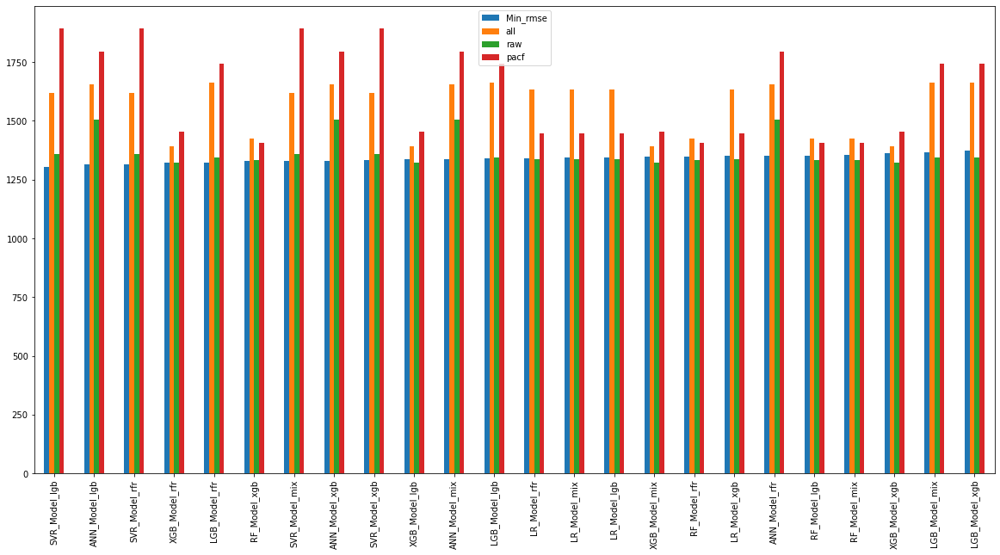

In [128]:
all_sort[['Min_rmse','all','raw','pacf']].plot.bar(rot=0,figsize=(20,10))
plt.xticks(rotation=90)
plt.show()

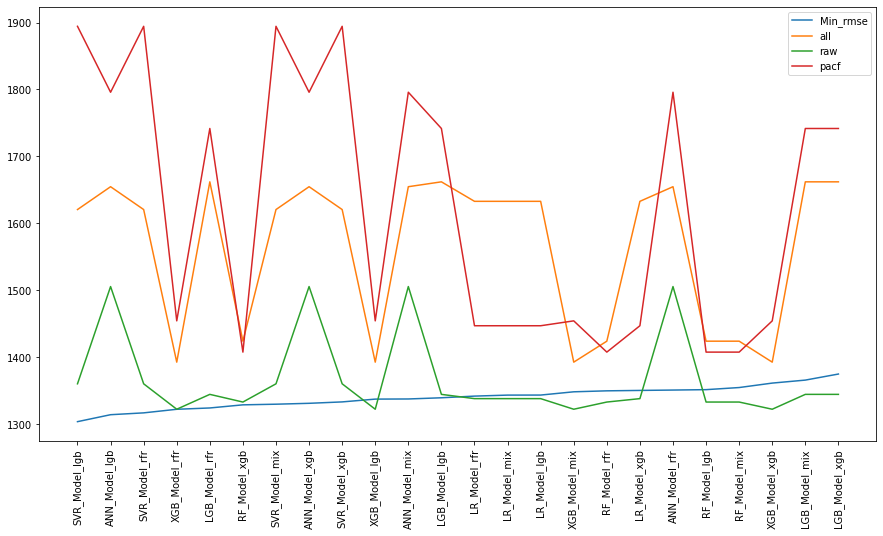

In [239]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/PRSA/Compare.png")
plt.show()

### 画图

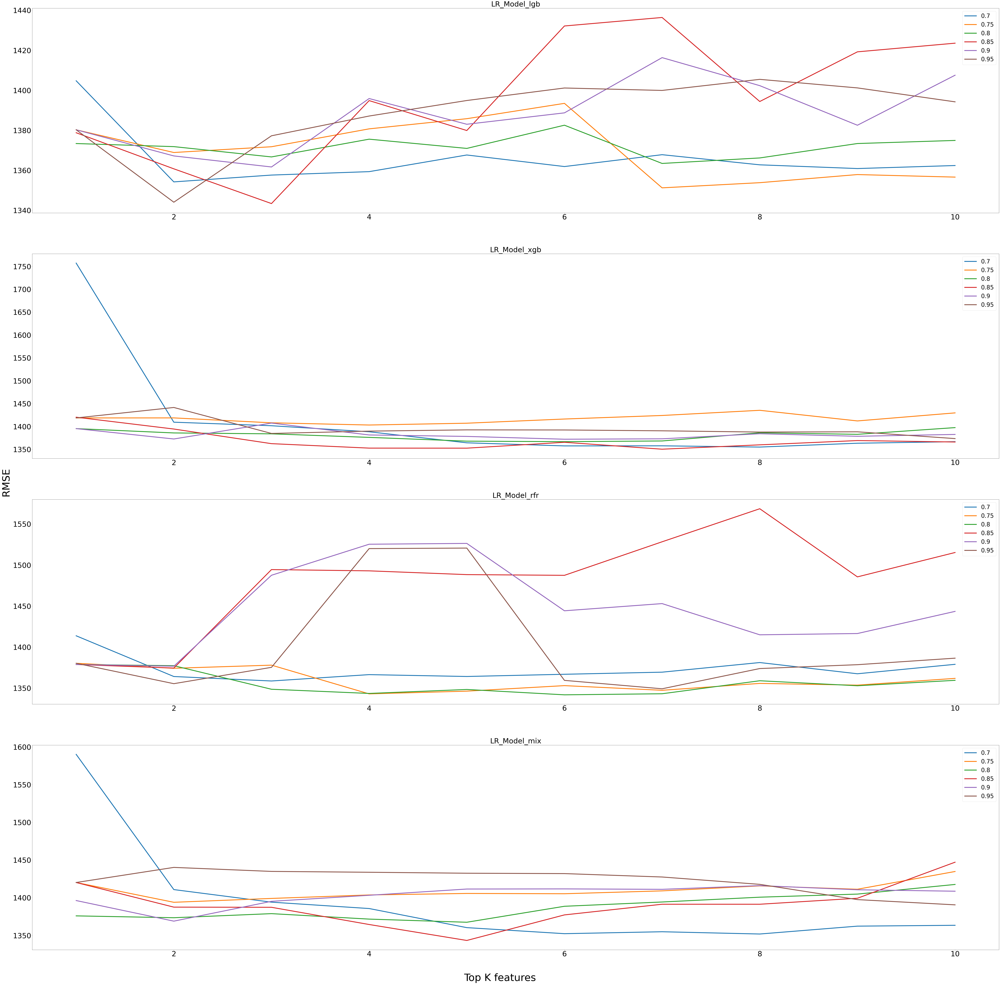

In [129]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/Linear.png')

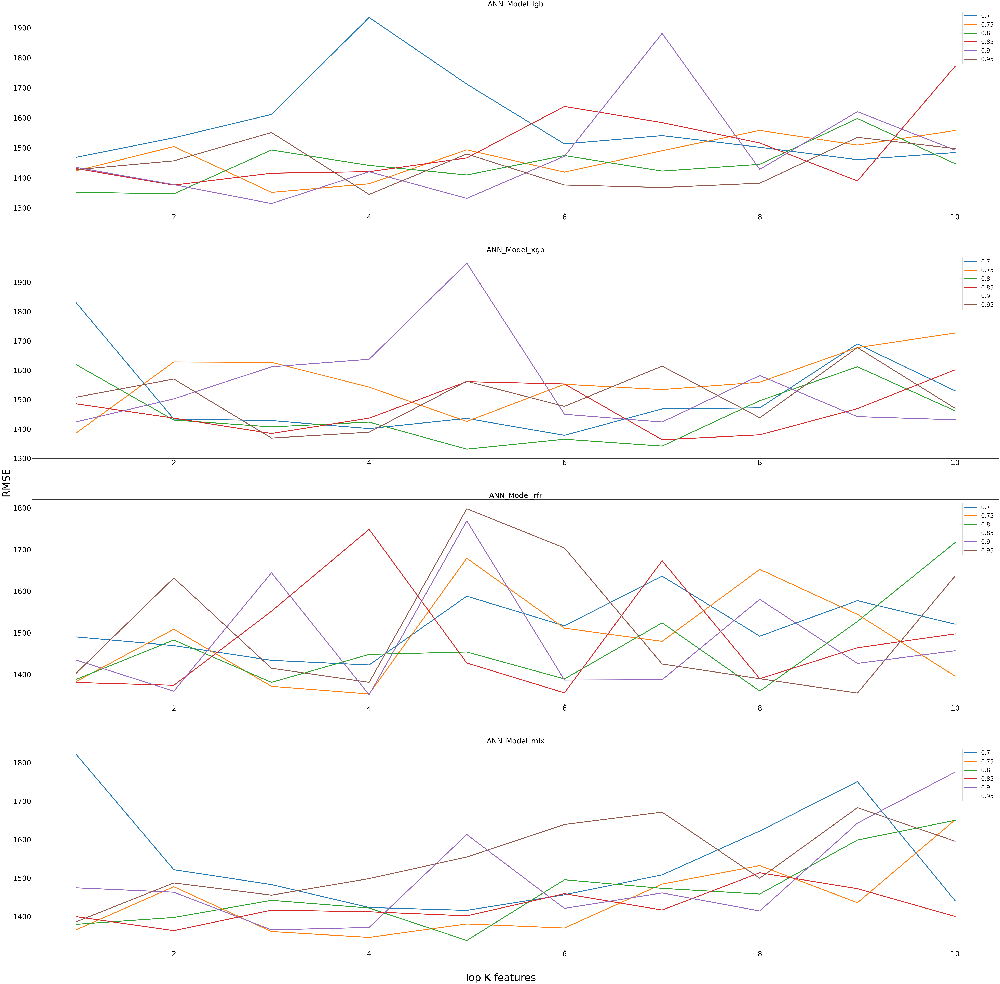

In [240]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/ANN.png')

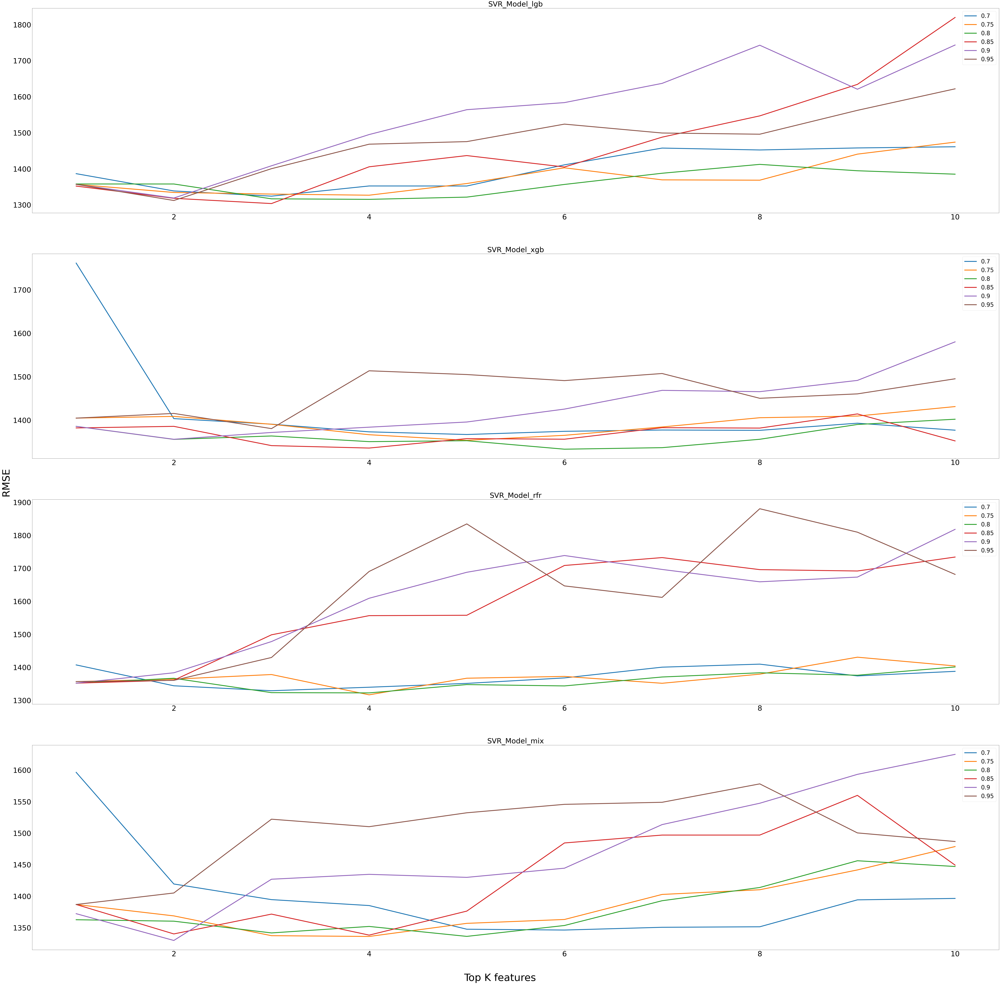

In [241]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/SVR.png')

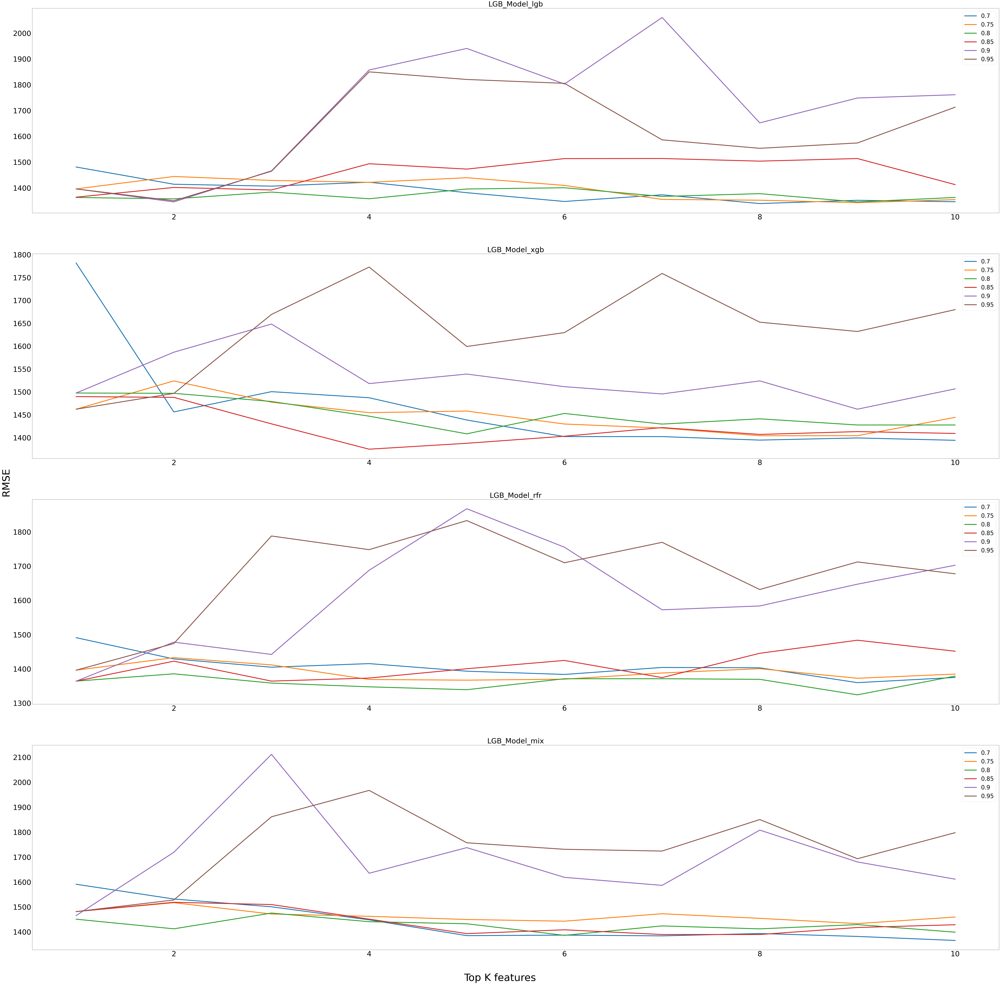

In [242]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/LGB.png')

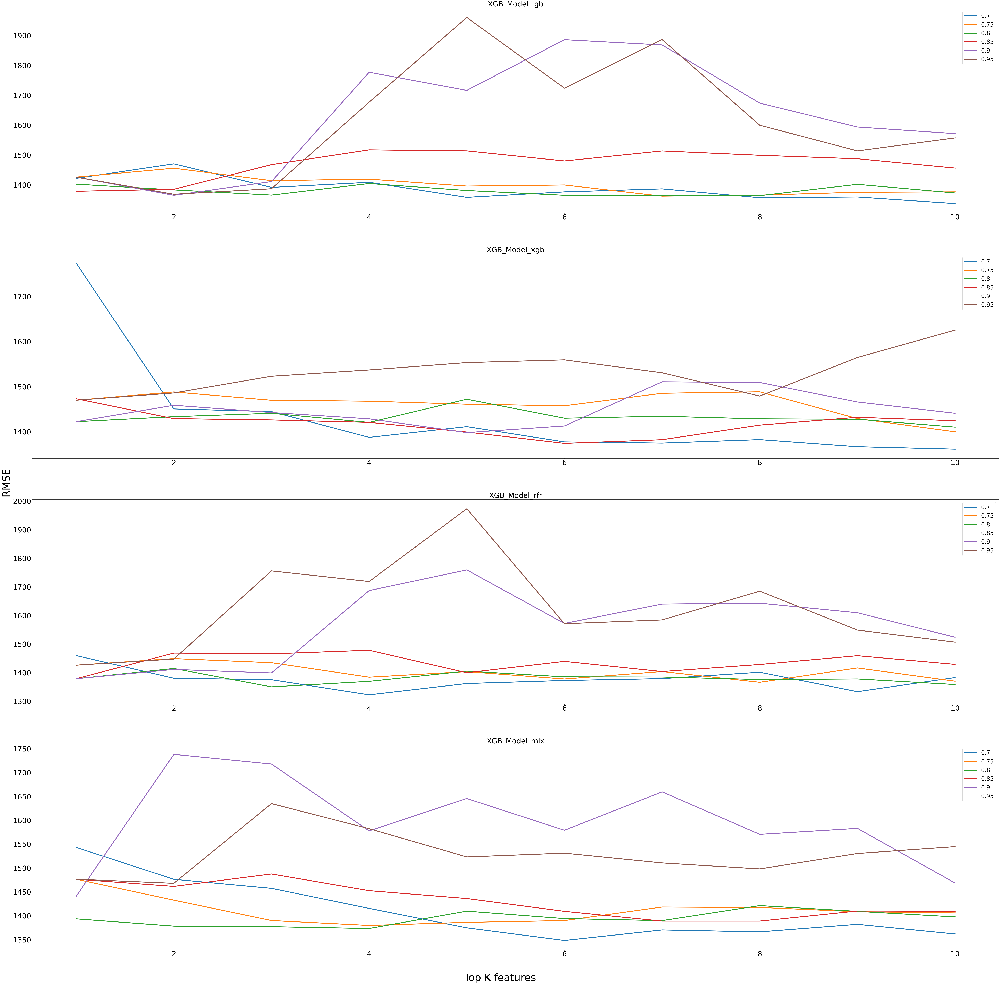

In [243]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/XGB.png')

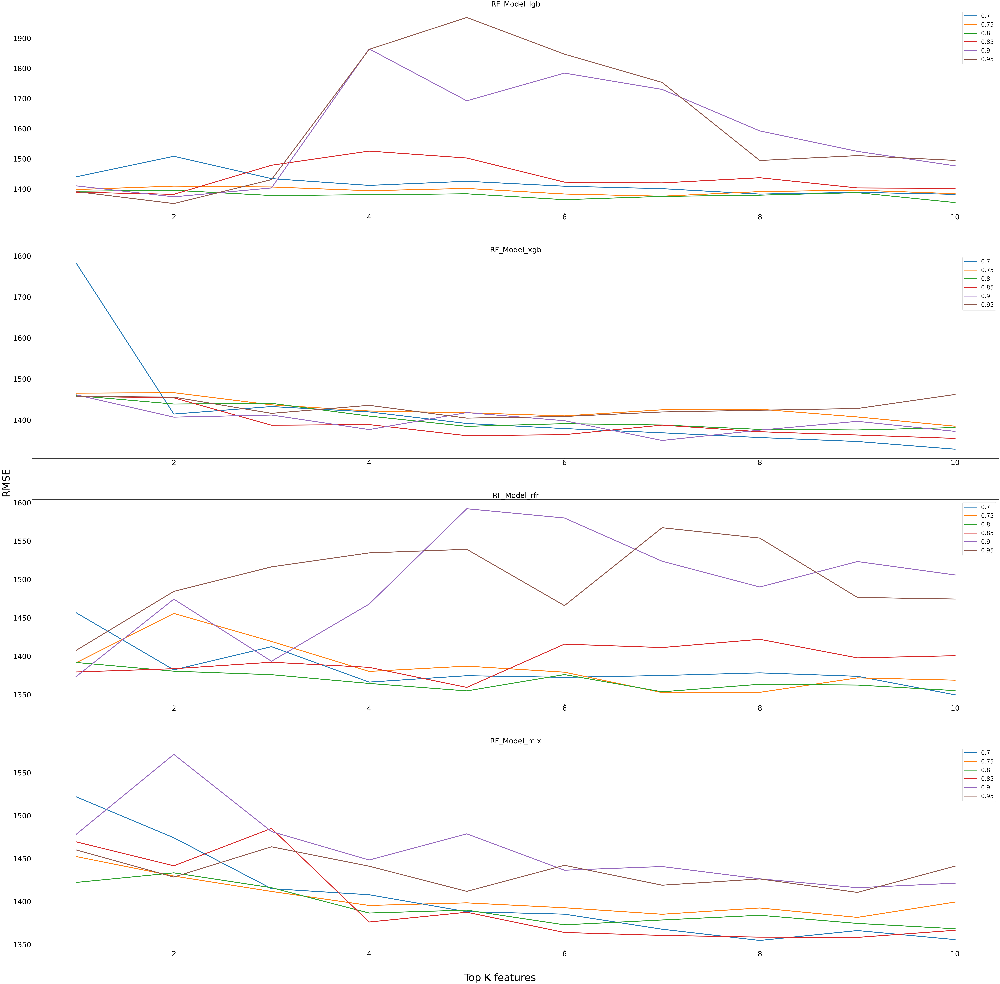

In [244]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/PRSA/RF.png')

In [246]:
def SVR_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )

    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
    y_svr = svr.predict(x_test)
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    
    y_df = pd.DataFrame({
        'Actual':y_svr_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_svr_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/PRSA/Final_prediction.png")
    return y_df

-0.3746213853647393


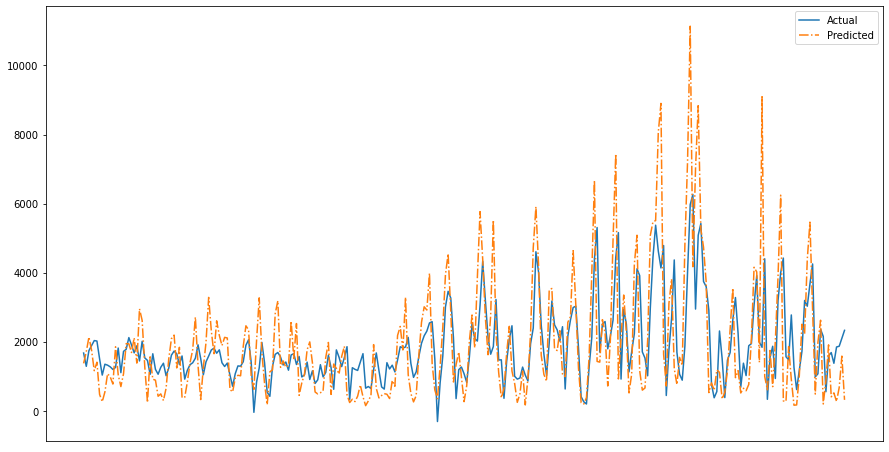

In [248]:
yy = SVR_plot(X_train_lag[real_lgb[0.85][3]],Y_train_lag,X_test_lag[real_lgb[0.85][3]],Y_test_lag)